# CSC52087EP lab1a by Vicky Kalogeiton
# Ecole Polytechnique
# Basic GAN Notebook

In [1]:
# import the libraries
import torch, pdb
from torch.utils.data import DataLoader
from torch import nn
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from tqdm.auto import tqdm
import matplotlib.pyplot as plt

In [ ]:
!pip install torchvision

   ---------------------------------------- 0.0/1.6 MB ? eta -:--:--
   -------------------------- ------------- 1.0/1.6 MB 5.6 MB/s eta 0:00:01
   ---------------------------------------- 1.6/1.6 MB 5.6 MB/s eta 0:00:00


## Setup

In [2]:
# visualization function
def show(tensor, ch=1, size=(28,28), num=16):
  # tensor: 128 x 784 (Batch size = 128, 28*28 = 784)
  data=tensor.detach().cpu().view(-1,ch,*size) # 128 x 784 --> 128 x 1 x 28 x 28
  # matplotlib has a different order (Width ,Height ,Channels) than pytorch for images
  grid = make_grid(data[:num], nrow=4).permute(1,2,0)   # 1 x 28 x 28  = 28 x 28 x 1
  plt.imshow(grid)
  plt.show()


In [3]:
# setup of the main parameters and hyperparameters
epochs = 200
cur_step = 0
# every how many steps we want to show information on the screen
info_step = 300
mean_gen_loss = 0
mean_disc_loss = 0

#dimensionality of noise vector that is the input of the generator
z_dim = 64
# learning rate
lr = 0.00001
# Binary Cross Entropy with Logits (transfoms the output wiht a sigmoid from 0 to 1)
loss_func = nn.BCEWithLogitsLoss()

# batch size
bs = 128
device = 'cuda'

# 1. where to store the data (.), 2. download the data = True 3. tranform according to the Tensor structure
# 4. shuffle: at every epoch we shuffle the data, 5. batch size
dataloader = DataLoader(MNIST('.', download=True, transform=transforms.ToTensor()),shuffle=True, batch_size=bs)

# every epoch is going to have number of steps:
# number of steps = 60000 / 128 = 468.75

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 9.91M/9.91M [00:00<00:00, 15.0MB/s]


Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 28.9k/28.9k [00:00<00:00, 456kB/s]


Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 1.65M/1.65M [00:00<00:00, 4.16MB/s]


Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 4.54k/4.54k [00:00<00:00, 5.07MB/s]

Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw



## Declare the models
#### Fill in the missing blanks

In [4]:
# Generator
def generatorBlock(input, output):
  return nn.Sequential(
    nn.Linear(input, output),   # Linear Layer (use torch.nn)
    nn.BatchNorm1d(output),   # Batch Norm 1d
    nn.ReLU(),   # ReLU
  )

class Generator(nn.Module):
  def __init__(self, z_dim=64, image_dim=784, h_dim=128): # z_dim: latent space dimensionality
    super().__init__()
    self.generator = nn.Sequential( # Fill in the rest by using the z_dim and the h_dim
        generatorBlock(z_dim, h_dim), # 64 --> 128
        generatorBlock(h_dim, 2*h_dim),
        generatorBlock(2*h_dim, 4*h_dim),
        generatorBlock(4*h_dim, 8*h_dim),
        generatorBlock(8*h_dim, image_dim),  # 128 --> 256
        # 256 --> 512
        # 512 --> 1024
        # 1024 --> 784 (28x28)
        nn.Sigmoid(), # to make the values between 0 and 1
    )

  def forward(self, noise):
       return self.generator(noise)

# function that generates noise
def gen_noise(number, z_dim):
  return torch.randn(number, z_dim).to(device)

In [5]:
## Discriminator
def discriminatorBlock(input, output):
  return nn.Sequential(
      nn.Linear(input, output),   # Linear Layer
      nn.LeakyReLU()   # LeakyReLU
  )

class Discriminator(nn.Module):
  def __init__(self, image_dim=784, h_dim=256):
    super().__init__()
    self.discriminator=nn.Sequential( # Fill in the rest by using the image_dim and the h_dim
        discriminatorBlock(image_dim, h_dim * 4),
        discriminatorBlock(h_dim * 4, h_dim * 2),
        discriminatorBlock(h_dim * 2, h_dim), # 784 --> 1024
        #TODO, # 1024 --> 512
        #TODO, # 512 --> 256
        nn.Linear(h_dim, 1) # output: 256 --> 1
    )

  def forward(self, image):
      return self.discriminator(image)

## Main code

In [8]:
gen = Generator(z_dim).to(device)
# optimizer of the generator
gen_opt = torch.optim.Adam(gen.parameters()) # Adam optimizer
disc = Discriminator().to(device)
# optimizer of the discriminator
disc_opt = torch.optim.Adam(disc.parameters()) # Adam optimizer

In [9]:
# check your generator
gen

Generator(
  (generator): Sequential(
    (0): Sequential(
      (0): Linear(in_features=64, out_features=128, bias=True)
      (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (1): Sequential(
      (0): Linear(in_features=128, out_features=256, bias=True)
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (2): Sequential(
      (0): Linear(in_features=256, out_features=512, bias=True)
      (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (3): Sequential(
      (0): Linear(in_features=512, out_features=1024, bias=True)
      (1): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
    (4): Sequential(
      (0): Linear(in_features=1024, out_features=784, bias=True)
      (1): BatchNorm1d(784, eps=1e-05, momentum=0.1, affine=True, track

In [10]:
# check your discriminator
disc

Discriminator(
  (discriminator): Sequential(
    (0): Sequential(
      (0): Linear(in_features=784, out_features=1024, bias=True)
      (1): LeakyReLU(negative_slope=0.01)
    )
    (1): Sequential(
      (0): Linear(in_features=1024, out_features=512, bias=True)
      (1): LeakyReLU(negative_slope=0.01)
    )
    (2): Sequential(
      (0): Linear(in_features=512, out_features=256, bias=True)
      (1): LeakyReLU(negative_slope=0.01)
    )
    (3): Linear(in_features=256, out_features=1, bias=True)
  )
)

In [11]:
x,y=next(iter(dataloader))
print(x.shape, y.shape)
print(y[:10])

torch.Size([128, 1, 28, 28]) torch.Size([128])
tensor([6, 1, 5, 2, 8, 7, 9, 2, 6, 4])


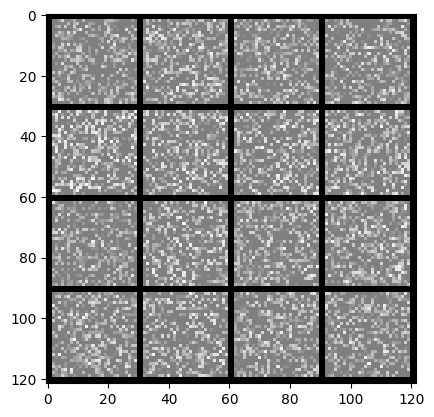

In [12]:
noise = gen_noise(bs, z_dim)
fake = gen(noise)
show(fake)

# Here we see the initial output of passing the noise through the generator
# Since the generator did not start learning, it produces a very noisy output

## Compute the loss

In [13]:
# generator loss
def calc_gen_loss(loss_func, gen, disc, number, z_dim): # number is the number of elemenent we want to process, i.e. batch size
   noise = gen_noise(number, z_dim)
   fake = gen(noise)
   pred = disc(fake)
   targets=torch.ones_like(pred) # 1: real, 0: fake
   gen_loss=loss_func(pred,targets)

   return gen_loss


def calc_disc_loss(loss_func, gen, disc, number, real, z_dim):
   # number is the number of elemenent we want to process, i.e. batch size
   # real is the number of real images
   noise = gen_noise(number, z_dim)
   fake = gen(noise)
   disc_fake = disc(fake.detach()) # need to detach so that we do not change the generator
   disc_fake_targets=torch.zeros_like(disc_fake) # 1: real, 0: fake
   disc_fake_loss=loss_func(disc_fake, disc_fake_targets)

   disc_real = disc(real)
   disc_real_targets=torch.ones_like(disc_real)
   disc_real_loss=loss_func(disc_real, disc_real_targets)

   disc_loss=(disc_fake_loss+disc_real_loss)/2

   return disc_loss





**GANs are known for their training instability and difficulty in achieving convergence. Discuss the potential causes of these issues**

1. Vanishing Gradients
* When the discriminator becomes stronger than the generator, it always recognizes when the image is fake, because of this, during the backprop, the gradients of the generator begin to vanish
2. Mode Collapse
* Mode collapse occurs when the generator produces only a limited set of outputs (or even a single output) rather than covering the entire data distribution.
3. Loss Function Issues
* The loss functions used in GANs are sensitive to the training dynamics. The original GAN objective, which involves minimizing the Jensen-Shannon divergence between the real and generated data distributions, is difficult to optimize. This can result in unstable gradients and non-convergence.

## Training loop

  0%|          | 0/469 [00:00<?, ?it/s]

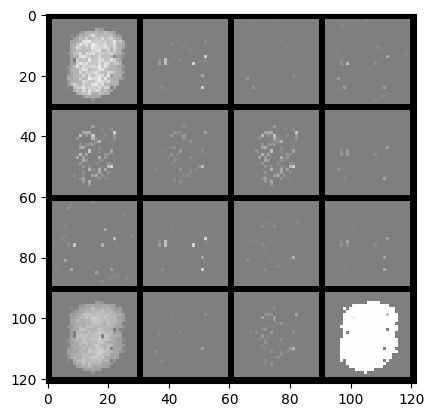

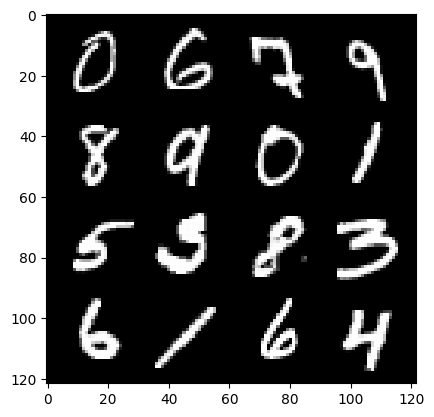

0: step 300 / Gen loss: 9.070098321728576 / disc_loss: 23.372081724446122


  0%|          | 0/469 [00:00<?, ?it/s]

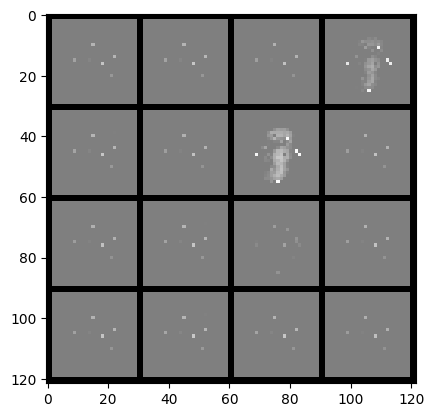

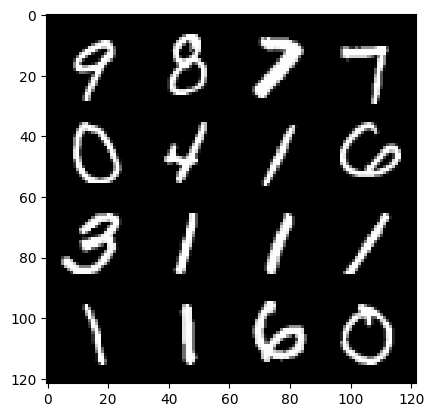

1: step 600 / Gen loss: 203.96804148412903 / disc_loss: 440.79888638186566


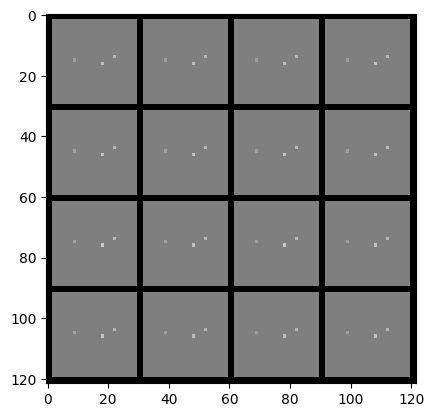

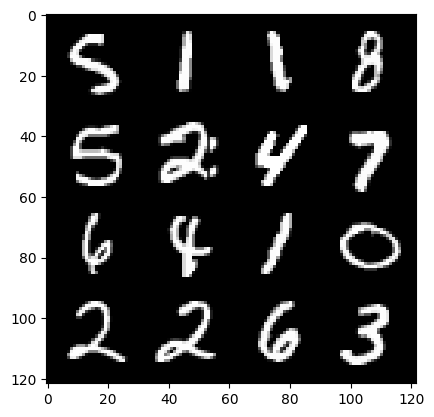

1: step 900 / Gen loss: 509.9537969856073 / disc_loss: 1100.1887623461212


  0%|          | 0/469 [00:00<?, ?it/s]

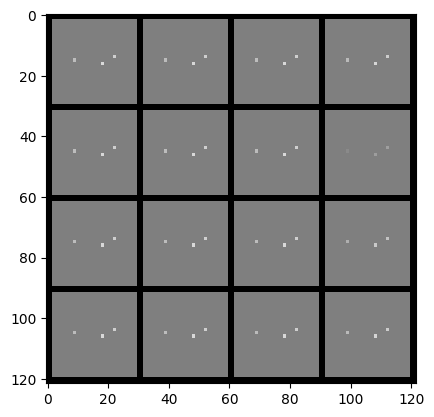

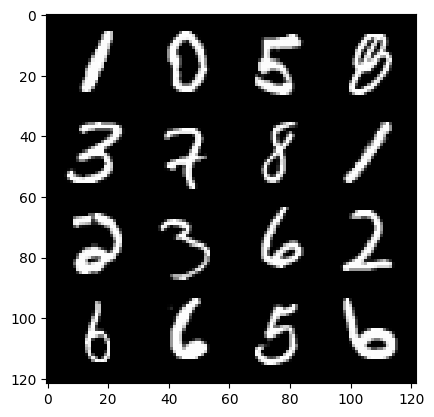

2: step 1200 / Gen loss: 2441.3130571238207 / disc_loss: 7316.964117065268


  0%|          | 0/469 [00:00<?, ?it/s]

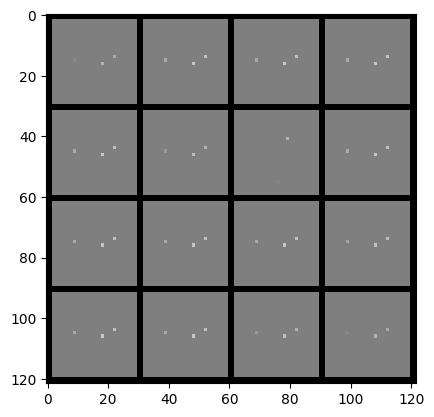

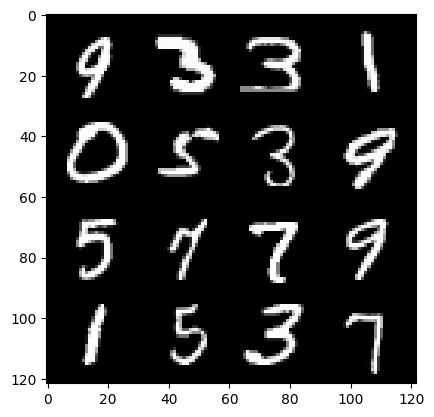

3: step 1500 / Gen loss: 3194.616529127755 / disc_loss: 4262.9627625789335


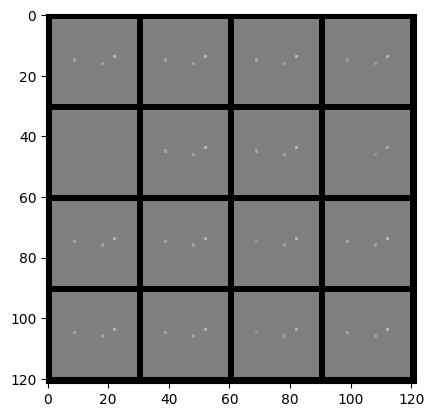

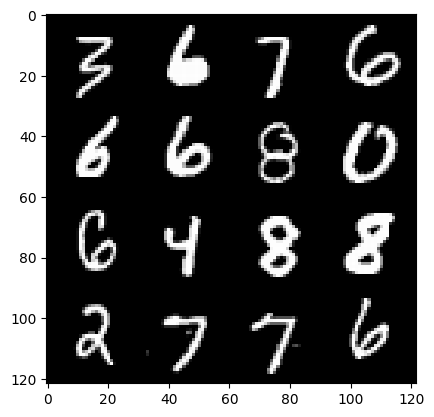

3: step 1800 / Gen loss: 8934.906773885088 / disc_loss: 16605.823179143274


  0%|          | 0/469 [00:00<?, ?it/s]

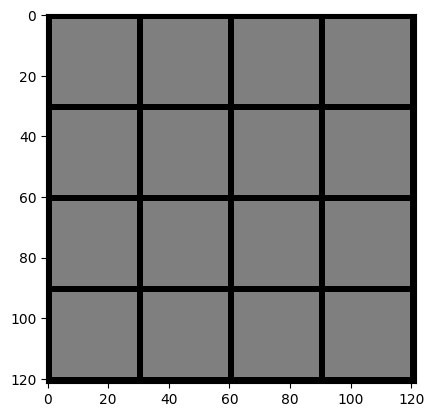

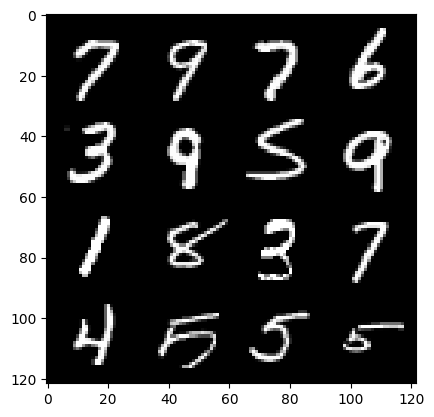

4: step 2100 / Gen loss: 2717.3065606435143 / disc_loss: 4407.226432189938


  0%|          | 0/469 [00:00<?, ?it/s]

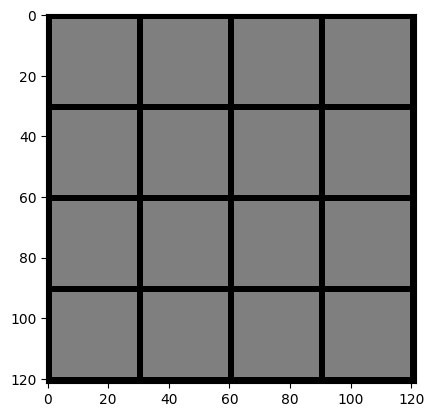

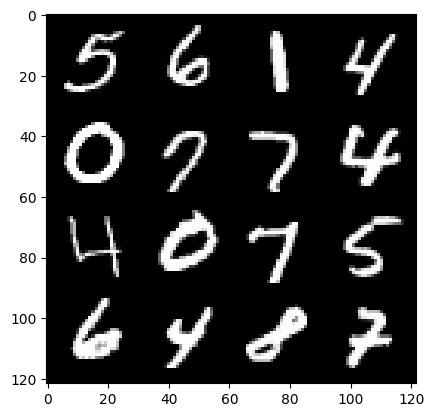

5: step 2400 / Gen loss: 10470.7720501709 / disc_loss: 15274.972862332661


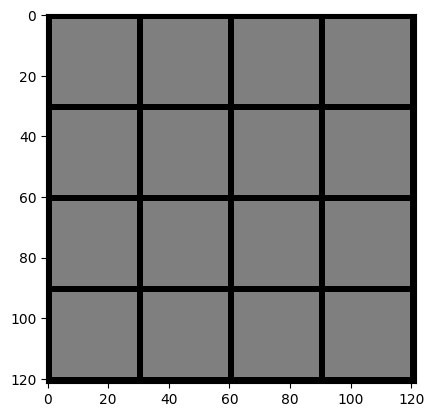

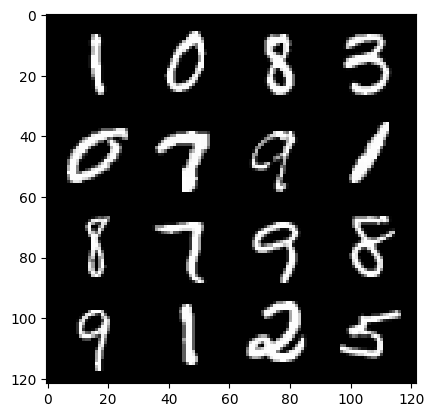

5: step 2700 / Gen loss: 15414.506131998702 / disc_loss: 22133.97115315755


  0%|          | 0/469 [00:00<?, ?it/s]

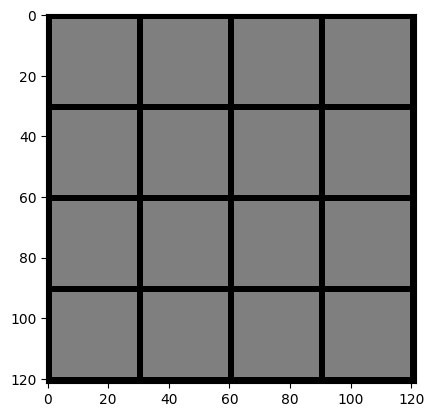

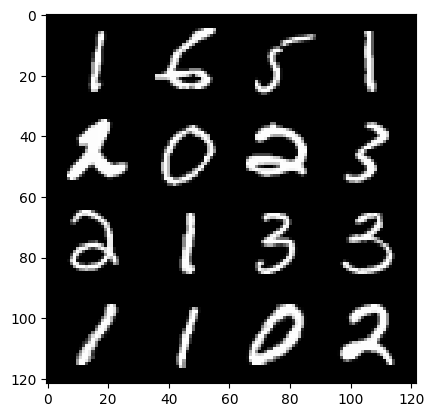

6: step 3000 / Gen loss: 22274.335991007483 / disc_loss: 29039.963004447614


  0%|          | 0/469 [00:00<?, ?it/s]

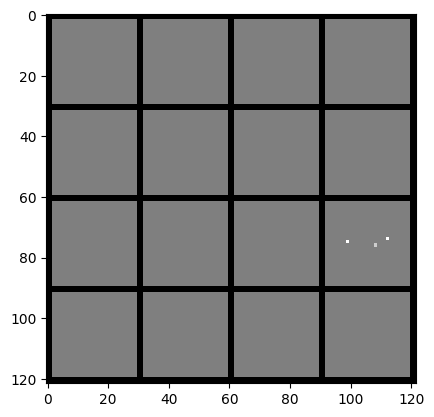

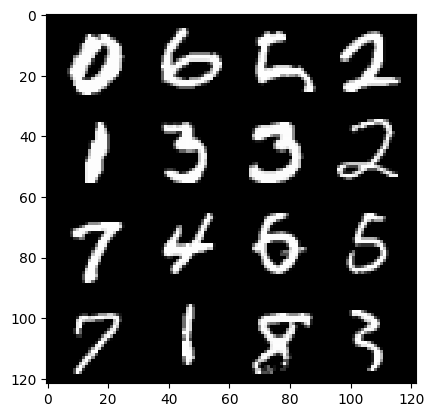

7: step 3300 / Gen loss: 54611.53697102863 / disc_loss: 91395.4280020507


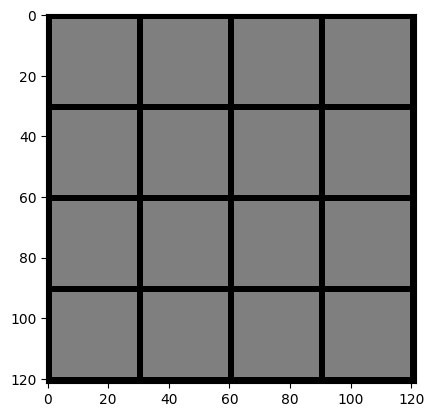

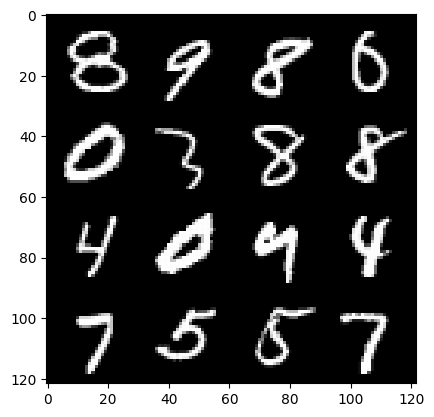

7: step 3600 / Gen loss: 23541.94338625749 / disc_loss: 55023.06921142578


  0%|          | 0/469 [00:00<?, ?it/s]

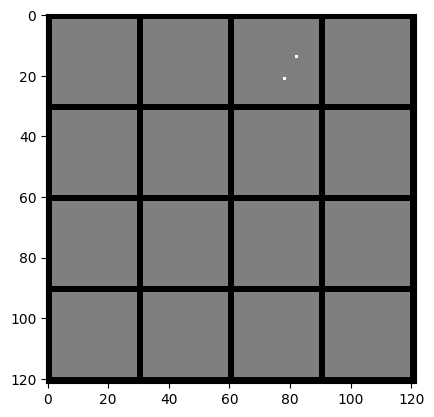

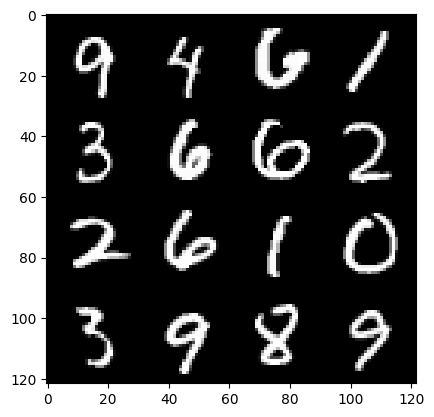

8: step 3900 / Gen loss: 51582.19366414387 / disc_loss: 102866.9810861063


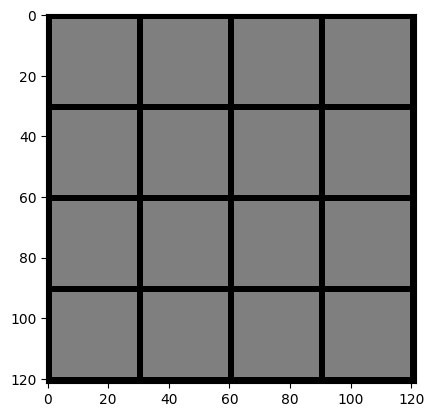

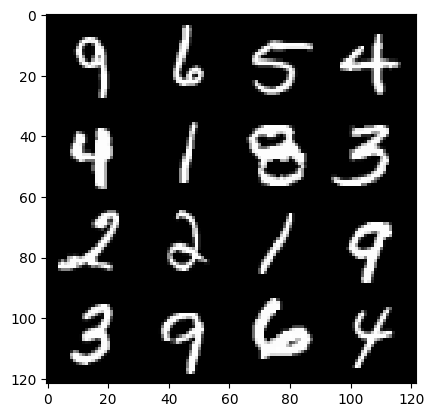

8: step 4200 / Gen loss: 51496.09746500651 / disc_loss: 100022.84893429048


  0%|          | 0/469 [00:00<?, ?it/s]

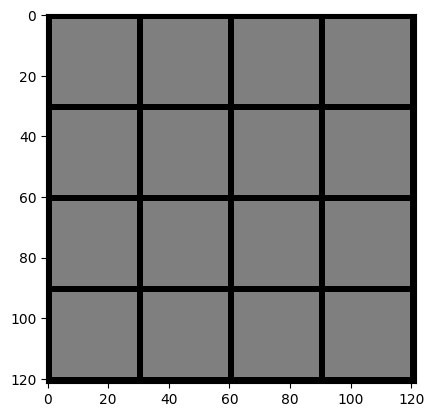

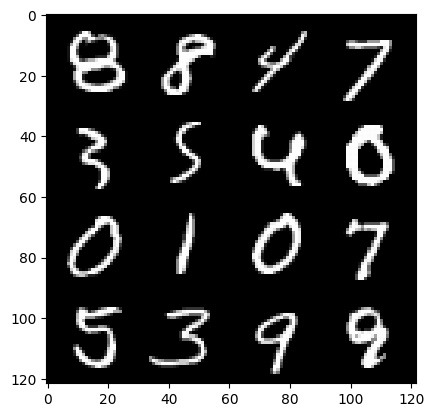

9: step 4500 / Gen loss: 29076.475798950167 / disc_loss: 63737.39091105142


  0%|          | 0/469 [00:00<?, ?it/s]

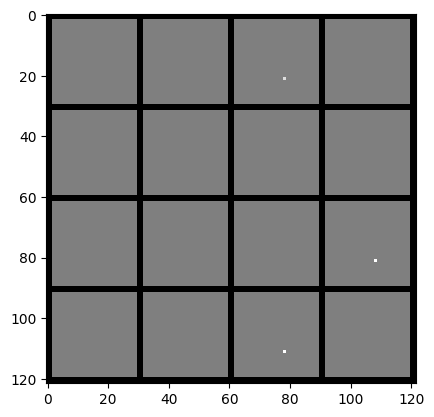

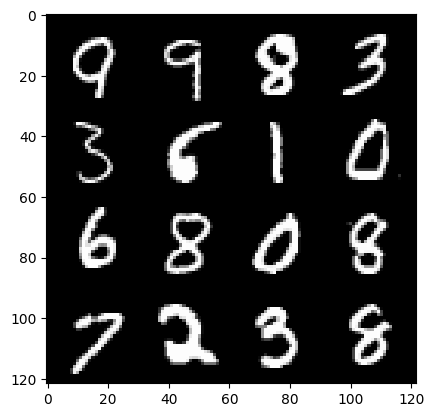

10: step 4800 / Gen loss: 22764.55104349773 / disc_loss: 45491.03316987276


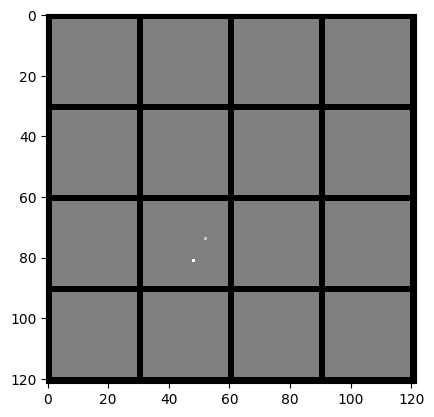

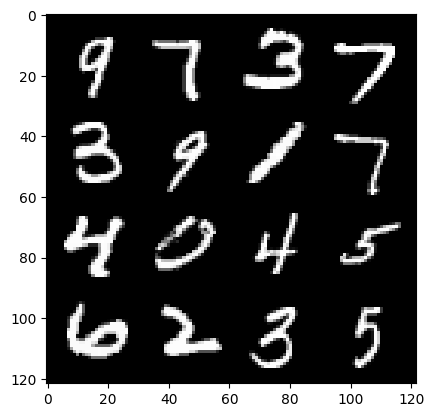

10: step 5100 / Gen loss: 18867.95797851562 / disc_loss: 50092.939243570974


  0%|          | 0/469 [00:00<?, ?it/s]

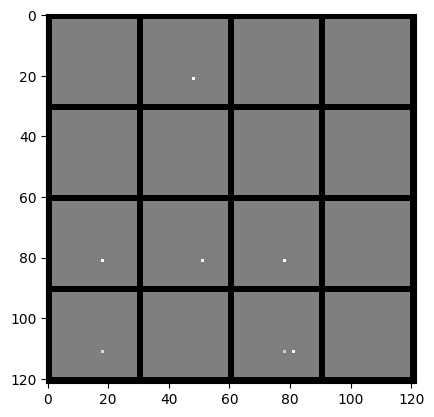

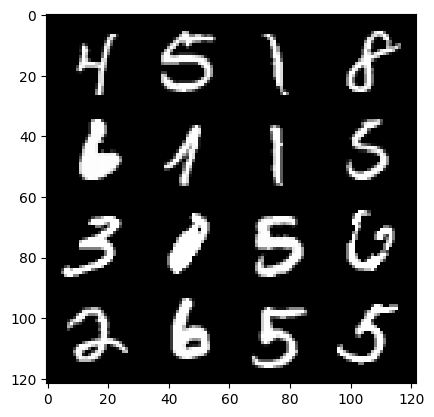

11: step 5400 / Gen loss: 30037.827689921058 / disc_loss: 24378.452246875764


  0%|          | 0/469 [00:00<?, ?it/s]

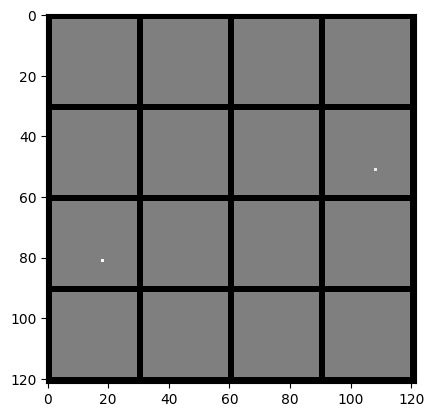

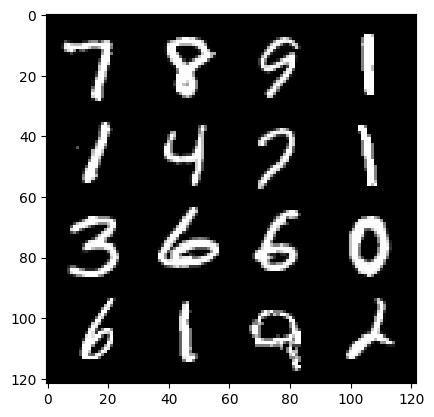

12: step 5700 / Gen loss: 15133.81540323893 / disc_loss: 51131.25229939776


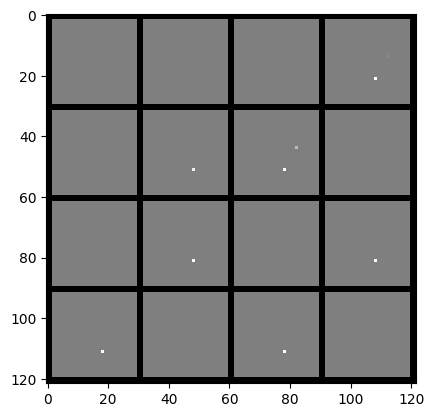

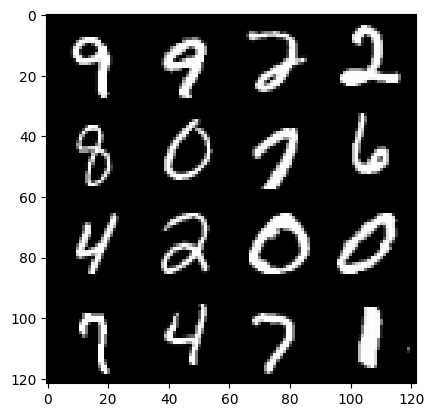

12: step 6000 / Gen loss: 46186.279130859366 / disc_loss: 43257.768394368504


  0%|          | 0/469 [00:00<?, ?it/s]

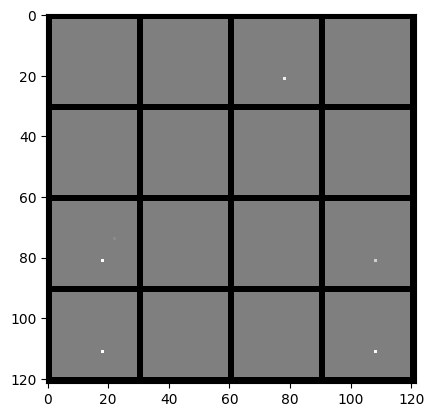

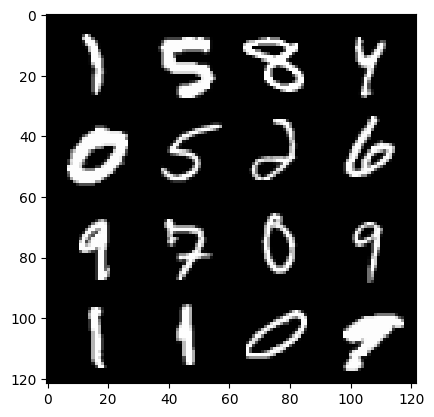

13: step 6300 / Gen loss: 70619.64339233401 / disc_loss: 88407.815978241


  0%|          | 0/469 [00:00<?, ?it/s]

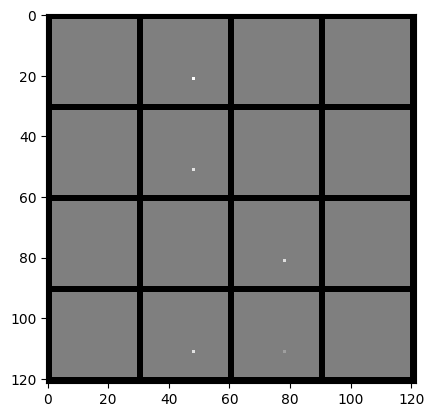

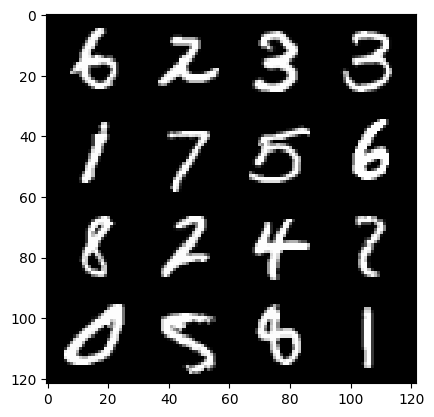

14: step 6600 / Gen loss: 45416.835907389315 / disc_loss: 111827.95099934904


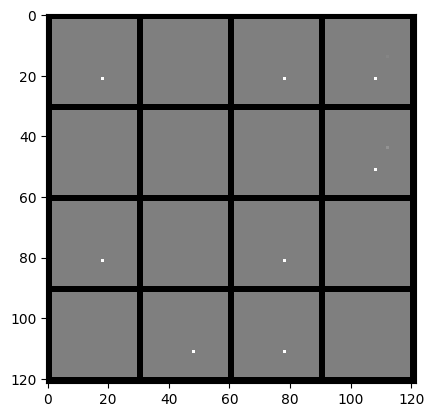

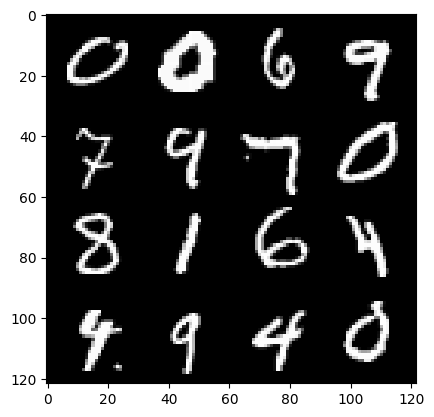

14: step 6900 / Gen loss: 103581.87376627607 / disc_loss: 192809.21669759124


  0%|          | 0/469 [00:00<?, ?it/s]

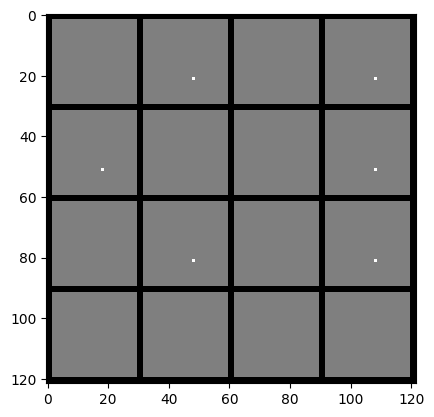

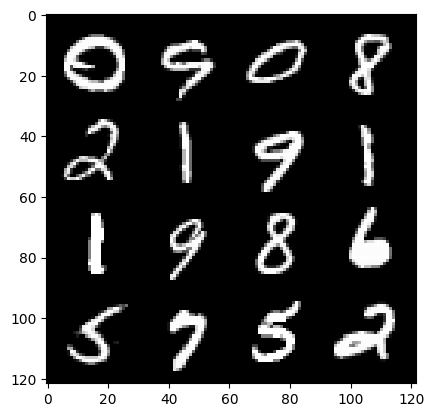

15: step 7200 / Gen loss: 50347.944701741544 / disc_loss: 164347.2162322108


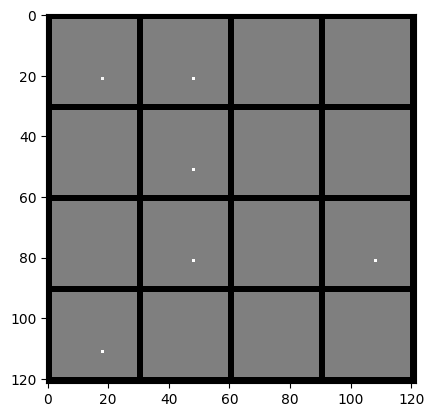

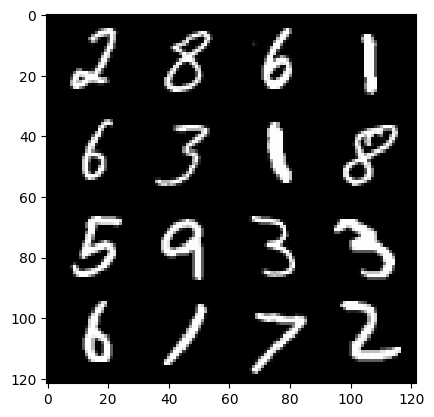

15: step 7500 / Gen loss: 43703.3722721354 / disc_loss: 112929.88634307131


  0%|          | 0/469 [00:00<?, ?it/s]

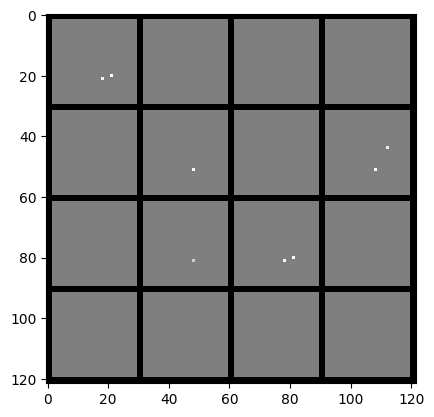

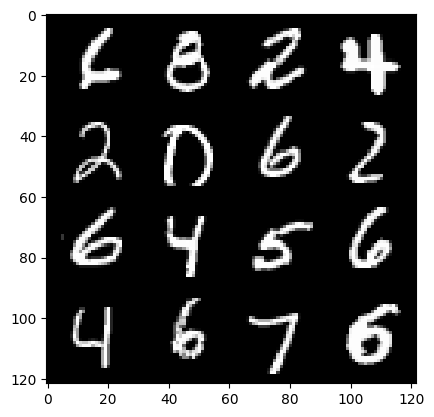

16: step 7800 / Gen loss: 124705.54788085942 / disc_loss: 171046.760632162


  0%|          | 0/469 [00:00<?, ?it/s]

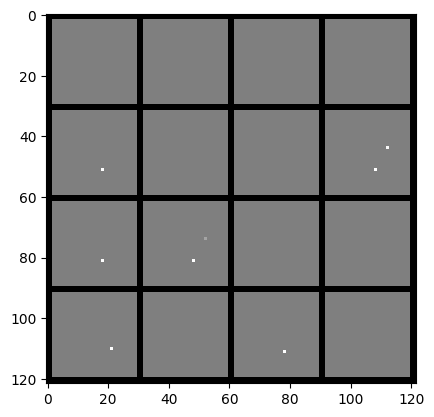

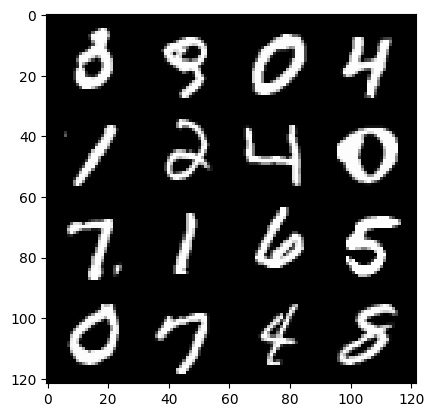

17: step 8100 / Gen loss: 60327.099397786464 / disc_loss: 206236.79744954422


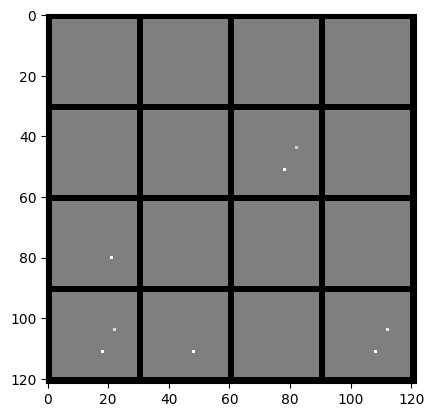

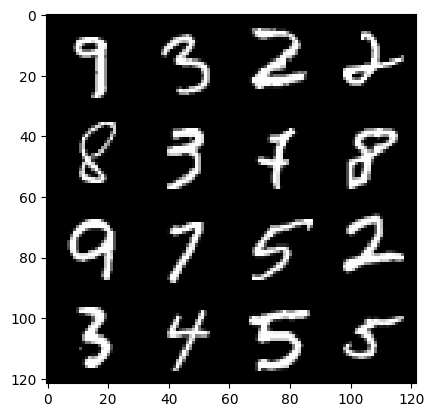

17: step 8400 / Gen loss: 131236.86530354817 / disc_loss: 243670.018303185


  0%|          | 0/469 [00:00<?, ?it/s]

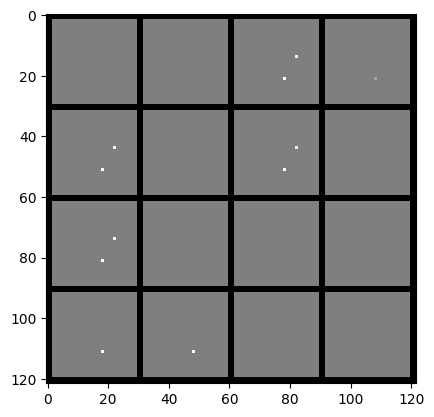

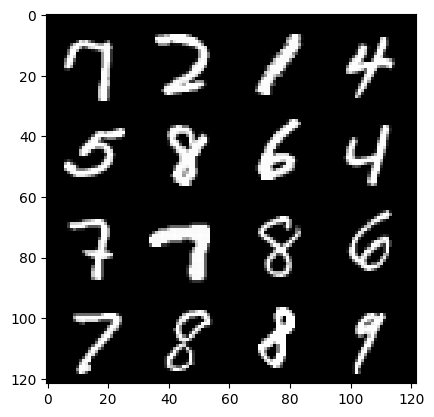

18: step 8700 / Gen loss: 168811.95803955075 / disc_loss: 972049.8746212515


  0%|          | 0/469 [00:00<?, ?it/s]

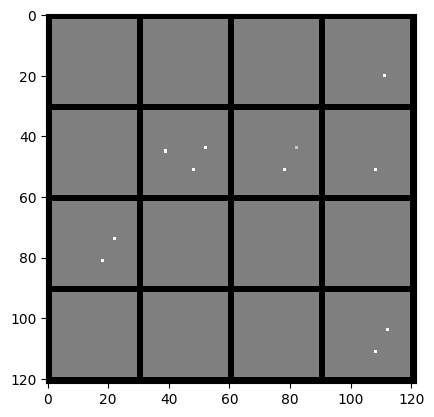

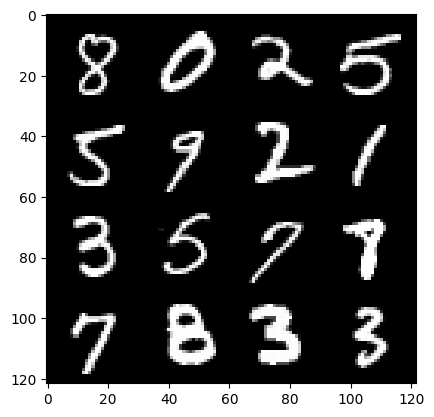

19: step 9000 / Gen loss: 391426.4242285664 / disc_loss: 424867.2600706033


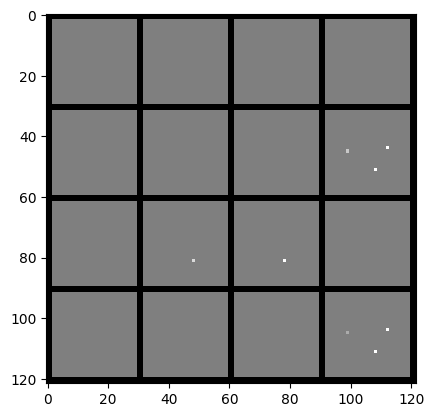

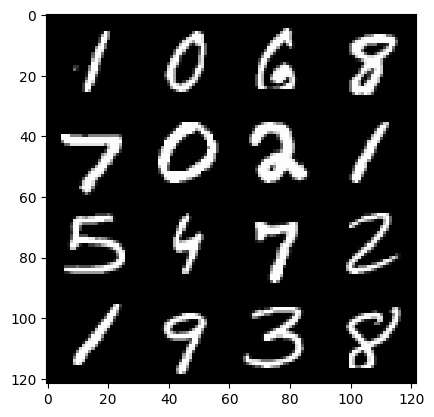

19: step 9300 / Gen loss: 337728.3772786458 / disc_loss: 752788.0072252321


  0%|          | 0/469 [00:00<?, ?it/s]

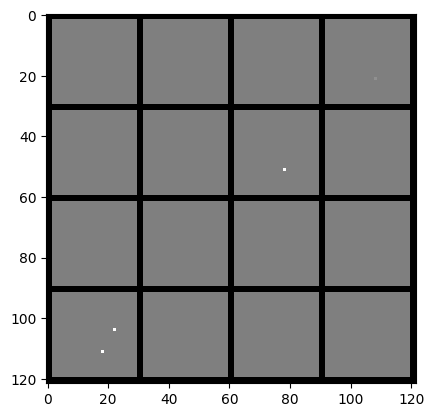

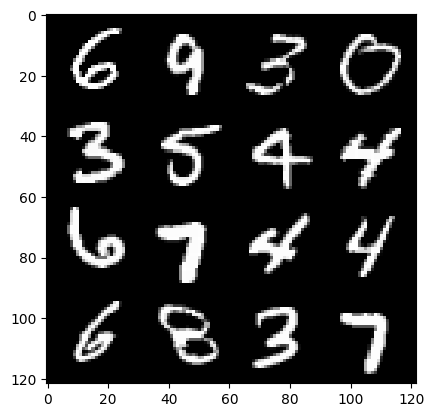

20: step 9600 / Gen loss: 183733.9944986979 / disc_loss: 643622.4952734375


  0%|          | 0/469 [00:00<?, ?it/s]

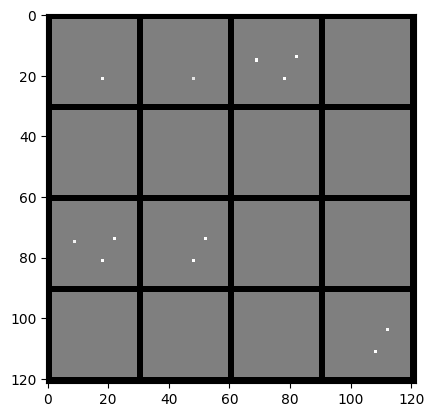

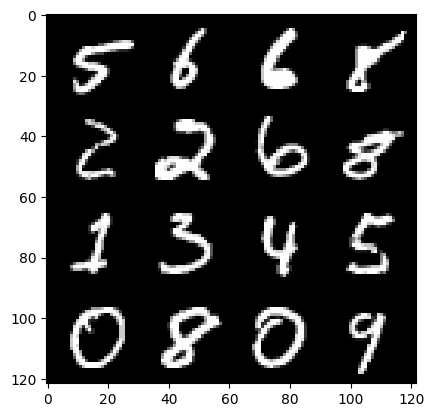

21: step 9900 / Gen loss: 299187.1967578126 / disc_loss: 270461.1609082032


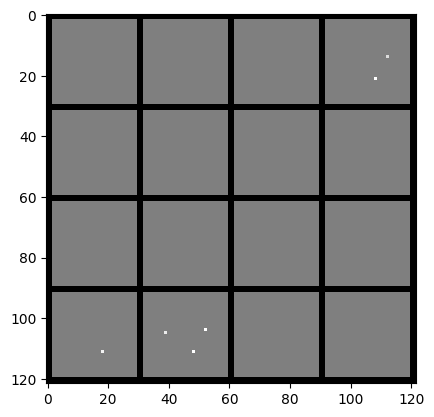

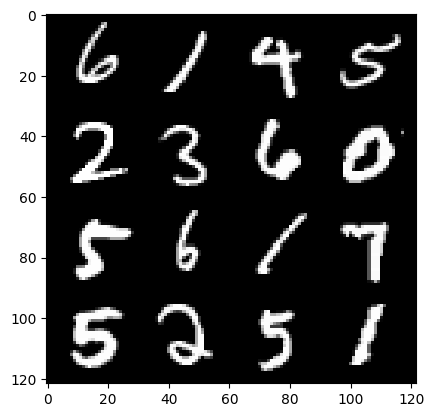

21: step 10200 / Gen loss: 419199.5431001297 / disc_loss: 762271.0534570313


  0%|          | 0/469 [00:00<?, ?it/s]

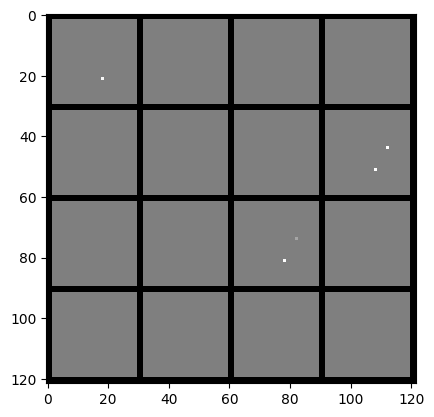

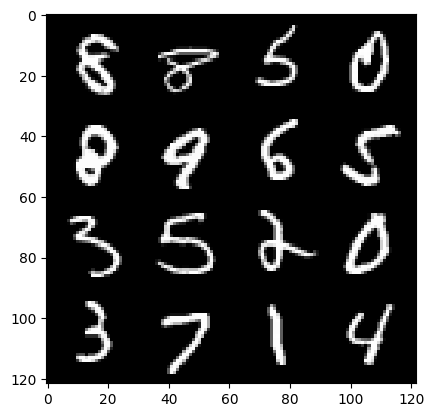

22: step 10500 / Gen loss: 376296.9567177327 / disc_loss: 1351364.5087715667


  0%|          | 0/469 [00:00<?, ?it/s]

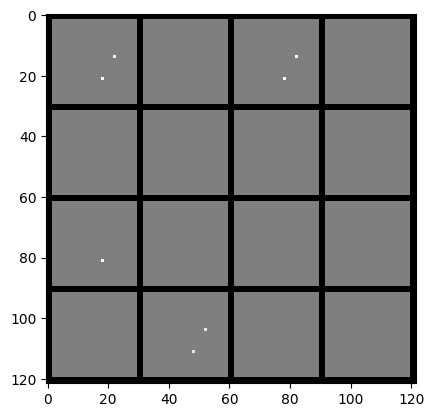

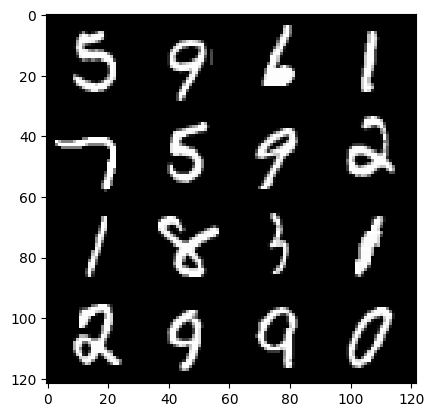

23: step 10800 / Gen loss: 489030.39821614575 / disc_loss: 394431.899318034


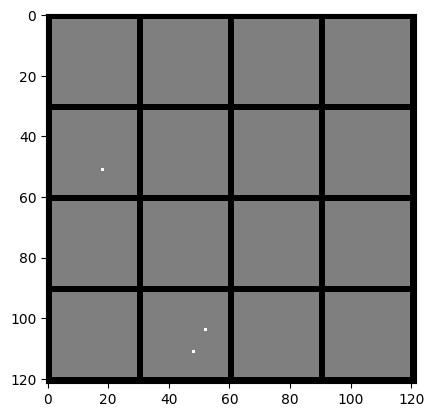

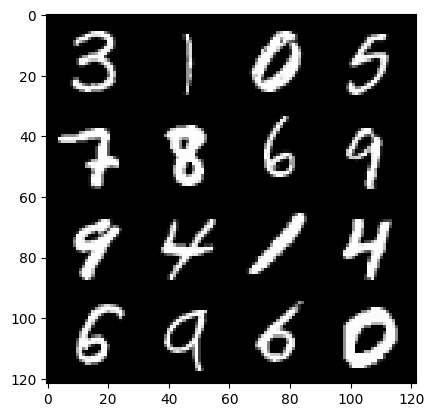

23: step 11100 / Gen loss: 279723.8534049478 / disc_loss: 593755.8705208335


  0%|          | 0/469 [00:00<?, ?it/s]

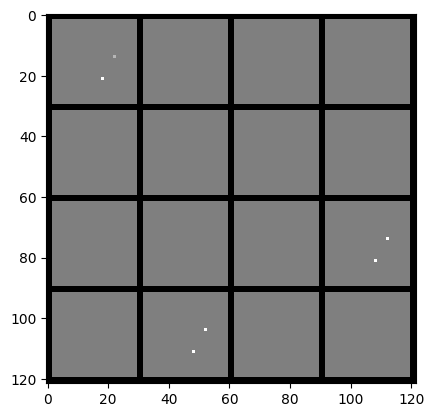

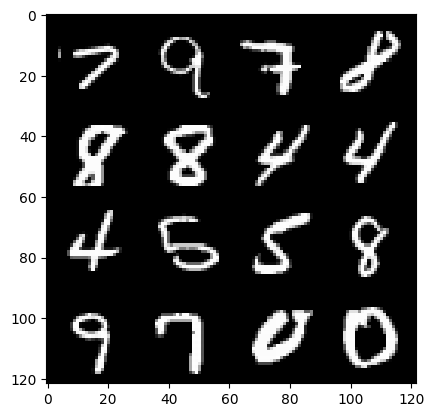

24: step 11400 / Gen loss: 306140.3546614584 / disc_loss: 409071.9704166669


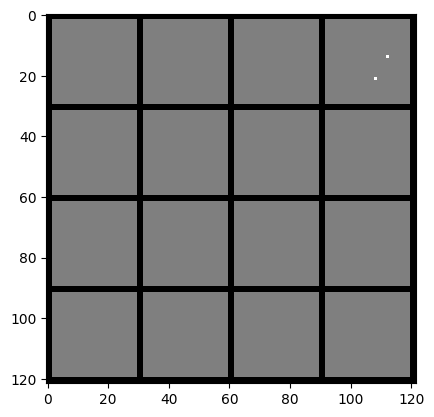

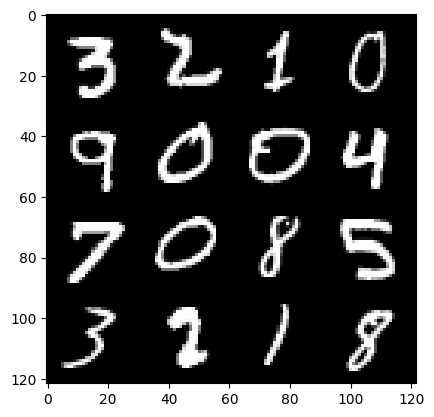

24: step 11700 / Gen loss: 270743.1220572917 / disc_loss: 1021093.3777994789


  0%|          | 0/469 [00:00<?, ?it/s]

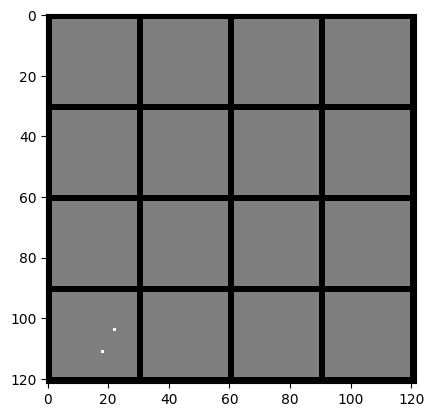

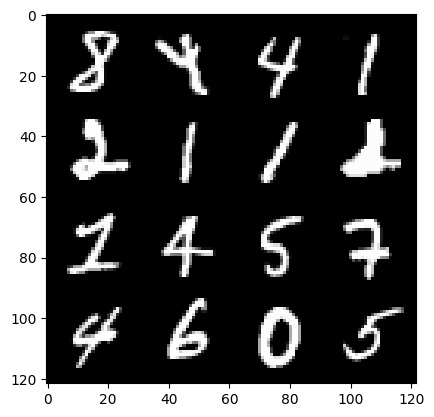

25: step 12000 / Gen loss: 685150.4841145837 / disc_loss: 919014.9739778652


  0%|          | 0/469 [00:00<?, ?it/s]

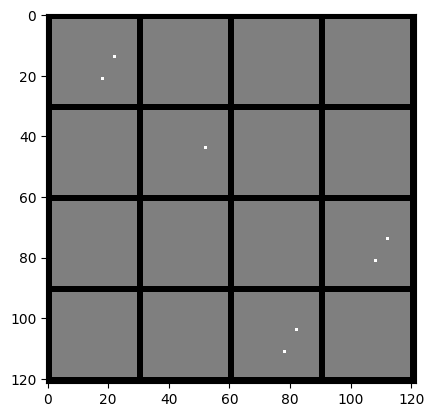

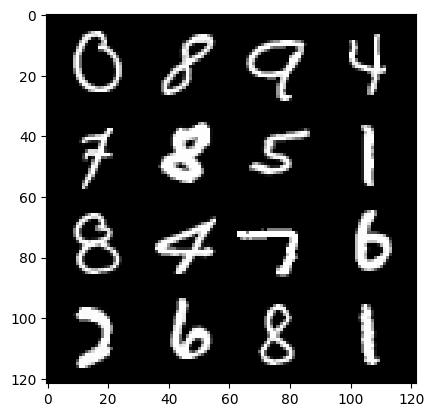

26: step 12300 / Gen loss: 599101.7187947592 / disc_loss: 732052.7834350582


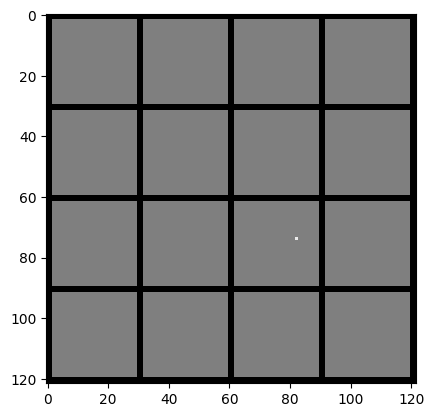

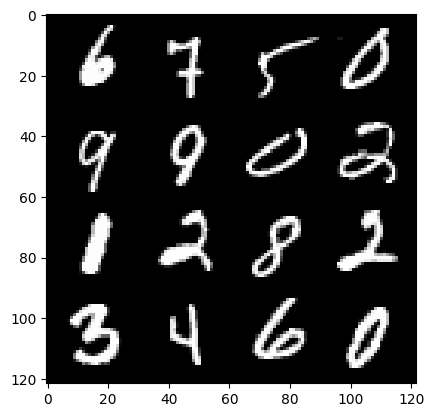

26: step 12600 / Gen loss: 710687.1136197913 / disc_loss: 1089769.9113281255


  0%|          | 0/469 [00:00<?, ?it/s]

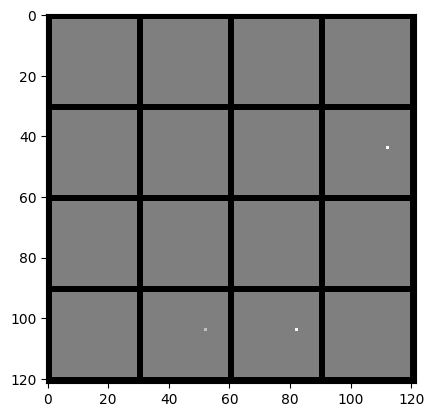

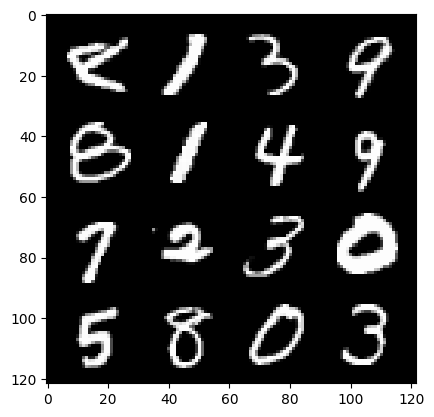

27: step 12900 / Gen loss: 245005.44761067713 / disc_loss: 1355456.3255826815


  0%|          | 0/469 [00:00<?, ?it/s]

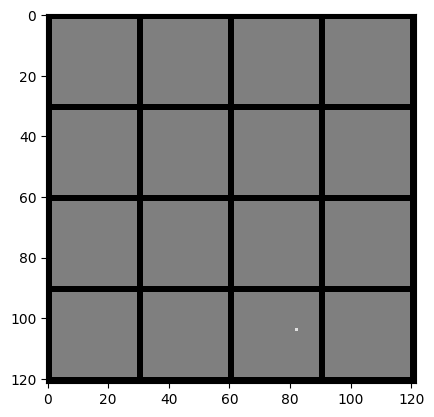

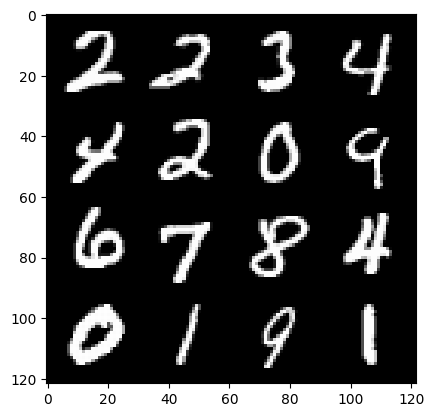

28: step 13200 / Gen loss: 435801.1352571613 / disc_loss: 525748.3939257814


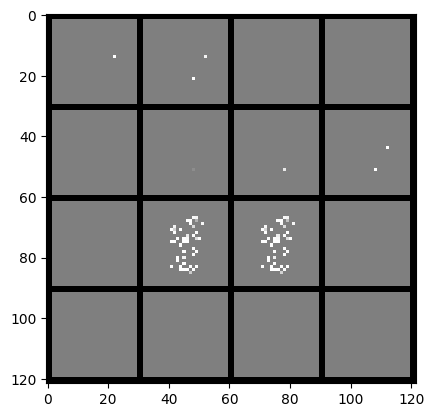

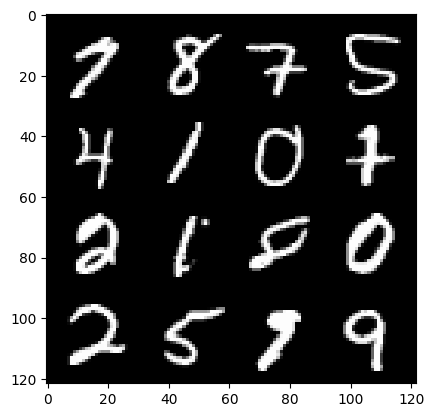

28: step 13500 / Gen loss: 360878.48670735693 / disc_loss: 1174879.9626197945


  0%|          | 0/469 [00:00<?, ?it/s]

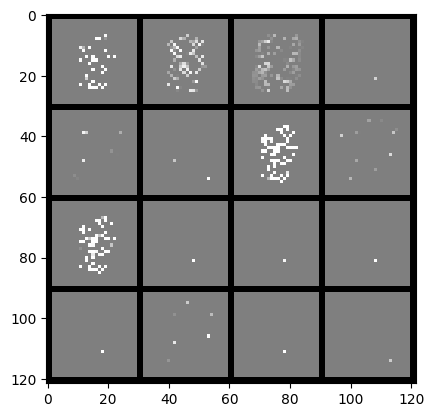

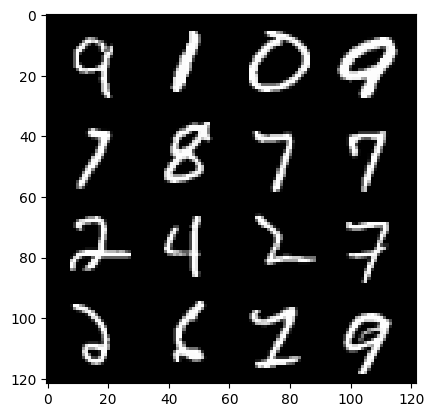

29: step 13800 / Gen loss: 307438.52112915035 / disc_loss: 470419.39619049086


  0%|          | 0/469 [00:00<?, ?it/s]

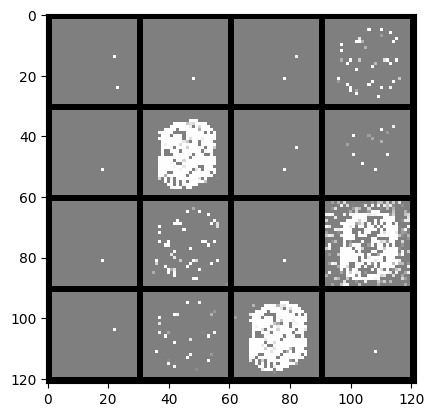

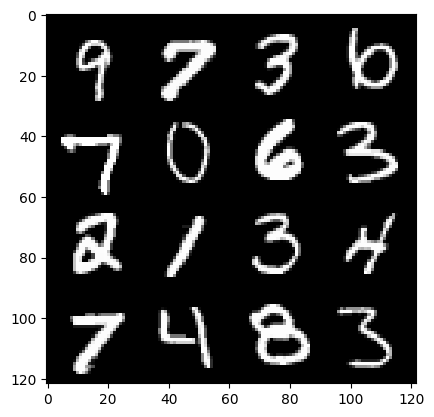

30: step 14100 / Gen loss: 451063.0765869141 / disc_loss: 1328082.22954005


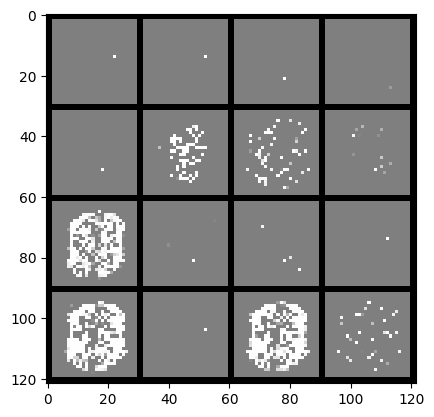

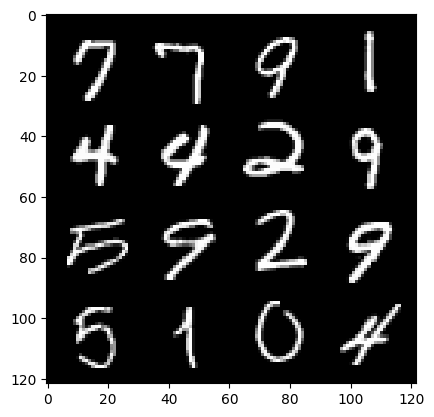

30: step 14400 / Gen loss: 320723.6528876752 / disc_loss: 645007.8139234671


  0%|          | 0/469 [00:00<?, ?it/s]

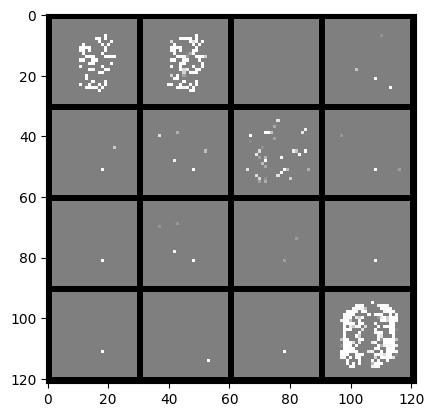

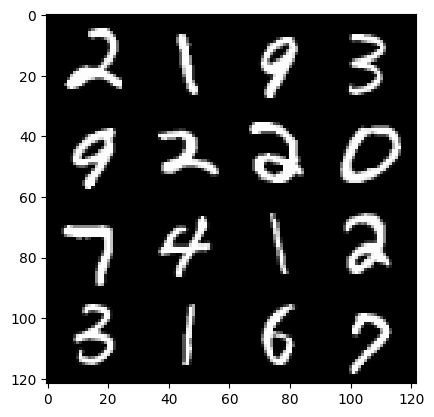

31: step 14700 / Gen loss: 280041.0078476207 / disc_loss: 913506.0782086687


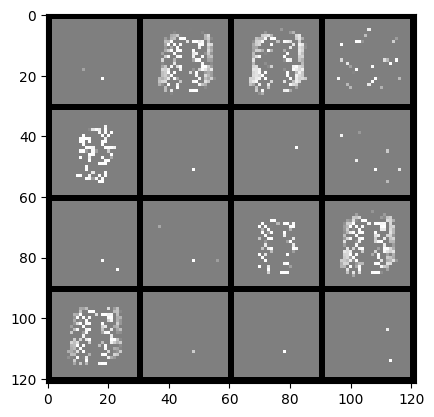

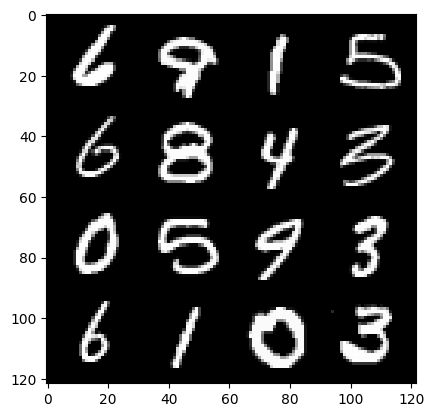

31: step 15000 / Gen loss: 589727.9507539877 / disc_loss: 378532.3715745036


  0%|          | 0/469 [00:00<?, ?it/s]

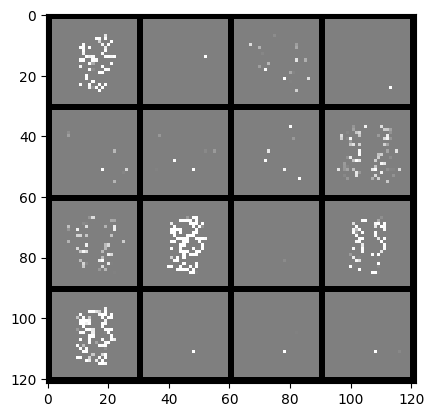

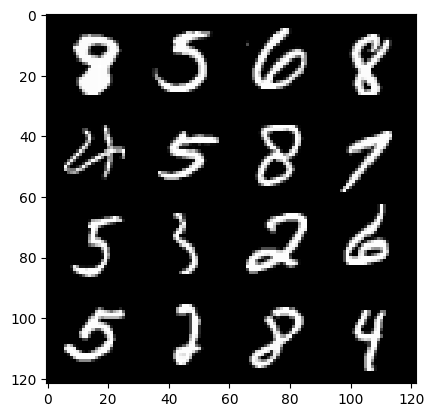

32: step 15300 / Gen loss: 275726.9754557294 / disc_loss: 671958.7458923341


  0%|          | 0/469 [00:00<?, ?it/s]

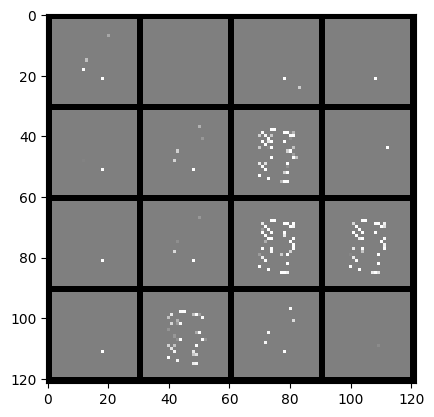

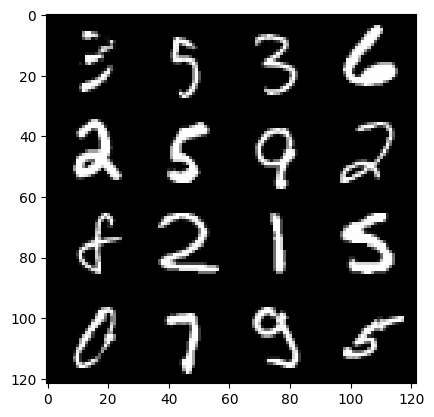

33: step 15600 / Gen loss: 378127.71328124986 / disc_loss: 408153.73755195615


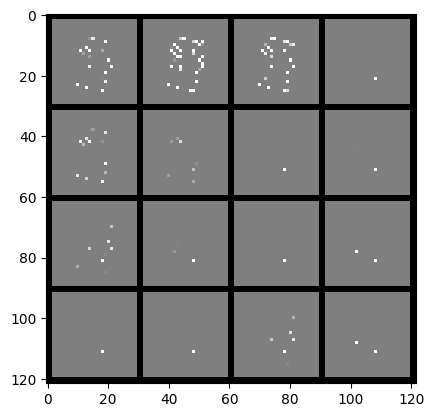

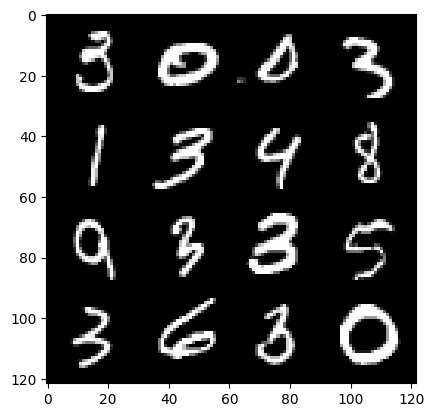

33: step 15900 / Gen loss: 529101.232944336 / disc_loss: 959465.9465902966


  0%|          | 0/469 [00:00<?, ?it/s]

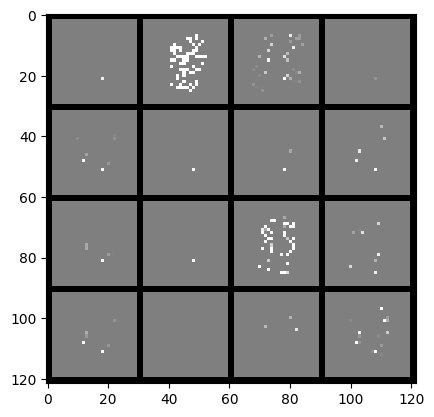

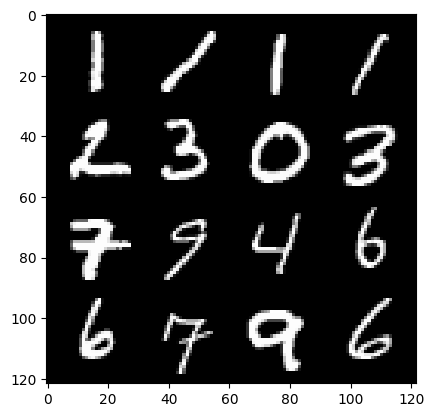

34: step 16200 / Gen loss: 132846.1866634114 / disc_loss: 1362325.2342797855


  0%|          | 0/469 [00:00<?, ?it/s]

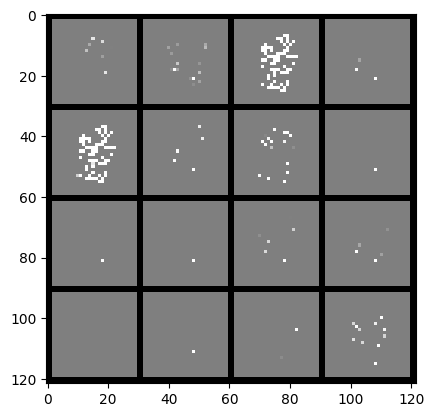

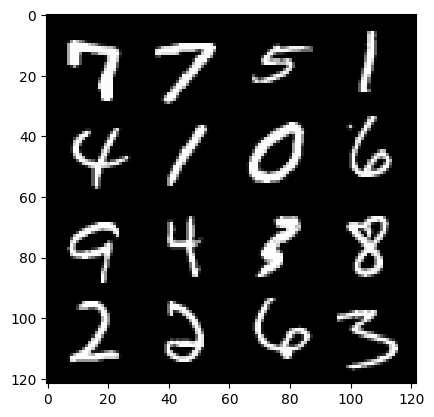

35: step 16500 / Gen loss: 570369.0773958336 / disc_loss: 691131.8819580084


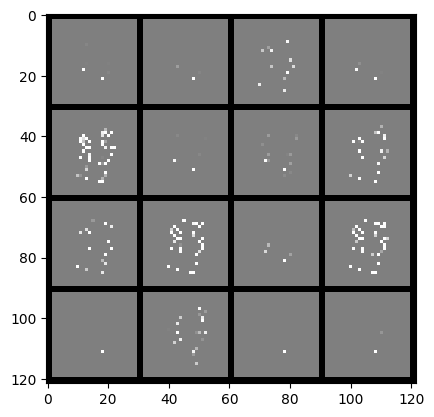

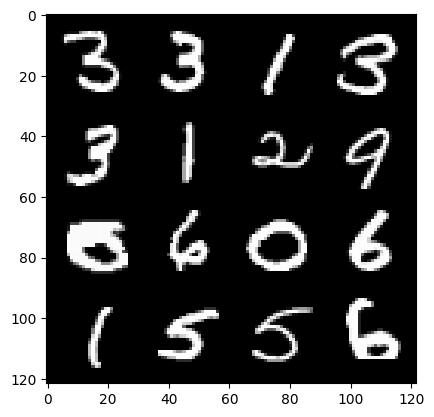

35: step 16800 / Gen loss: 272279.9768986511 / disc_loss: 231046.1224183146


  0%|          | 0/469 [00:00<?, ?it/s]

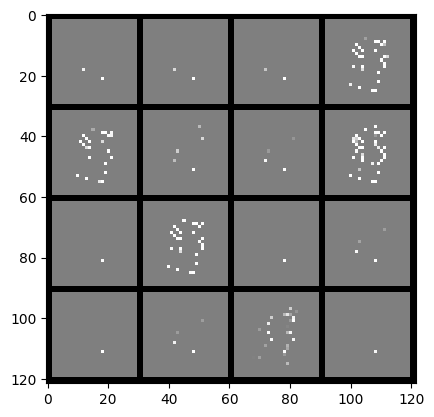

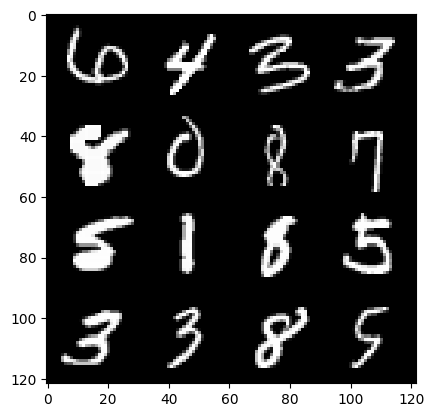

36: step 17100 / Gen loss: 286548.9986783854 / disc_loss: 1235129.294484481


  0%|          | 0/469 [00:00<?, ?it/s]

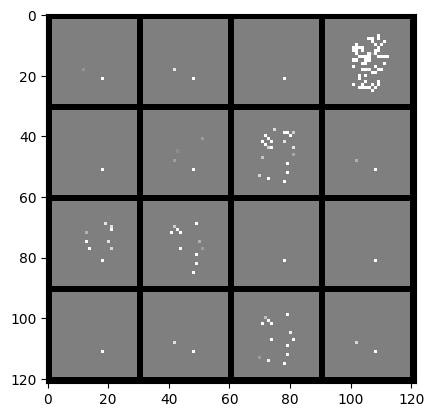

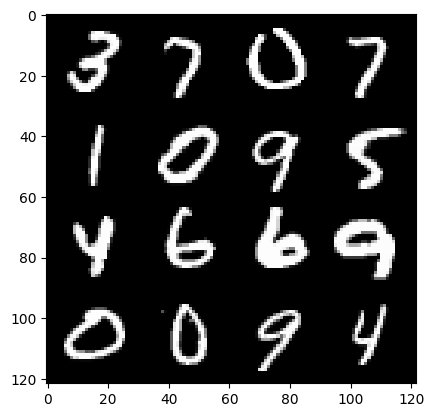

37: step 17400 / Gen loss: 943569.1167136634 / disc_loss: 1433282.1483555094


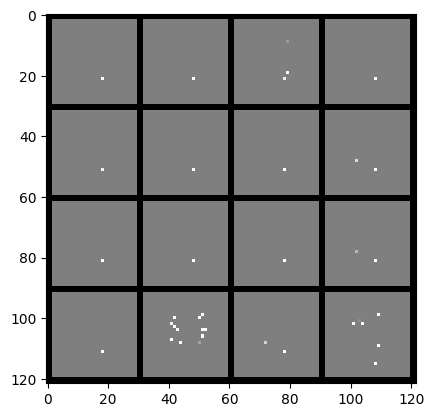

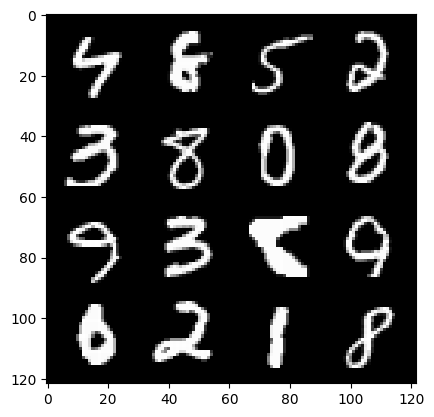

37: step 17700 / Gen loss: 1005137.9457926434 / disc_loss: 1474652.0264996337


  0%|          | 0/469 [00:00<?, ?it/s]

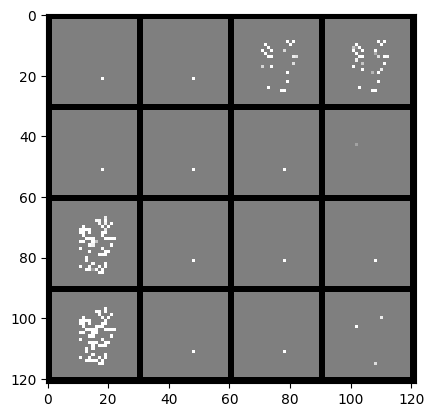

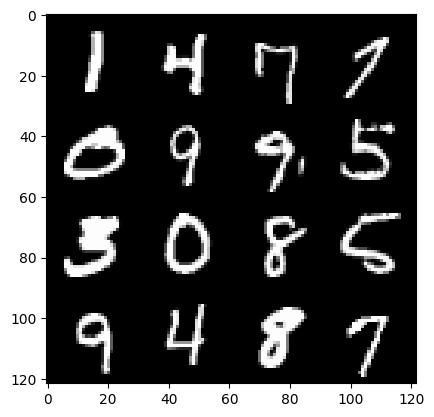

38: step 18000 / Gen loss: 175344.03713793433 / disc_loss: 461895.69810518273


  0%|          | 0/469 [00:00<?, ?it/s]

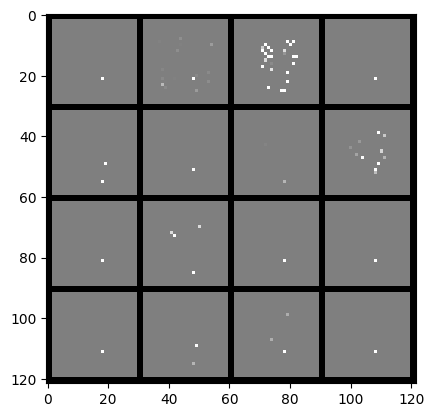

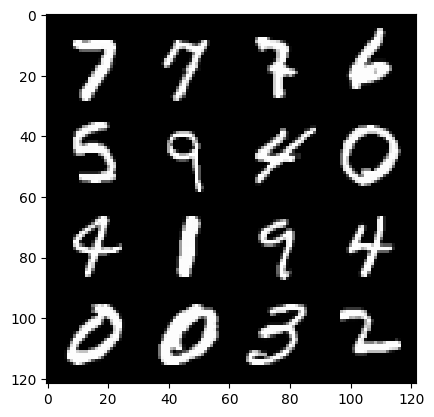

39: step 18300 / Gen loss: 380631.17369486473 / disc_loss: 442412.3168310551


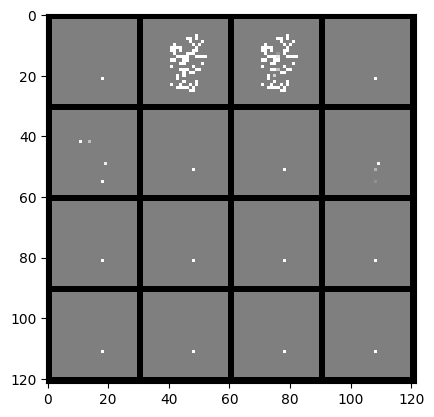

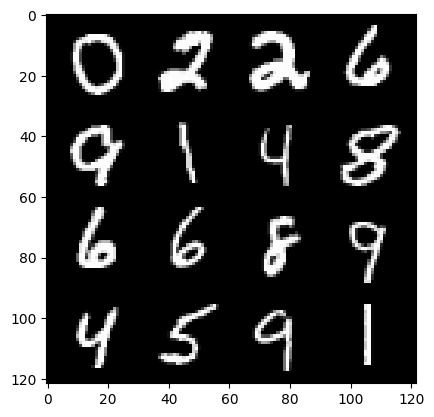

39: step 18600 / Gen loss: 692096.1659977214 / disc_loss: 1134480.9874211147


  0%|          | 0/469 [00:00<?, ?it/s]

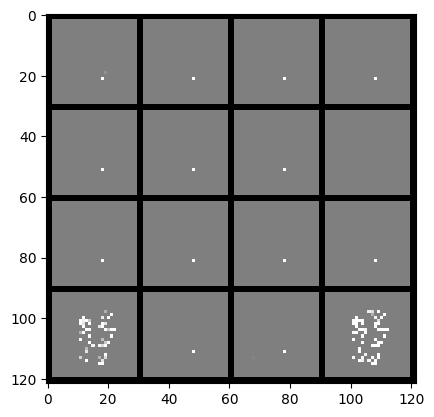

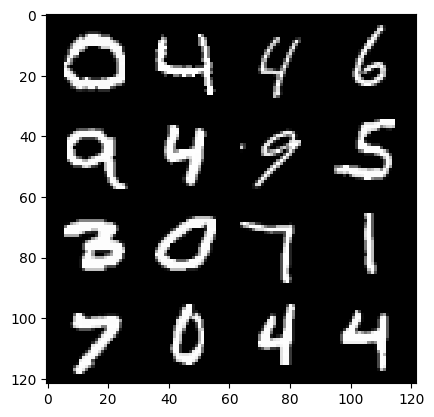

40: step 18900 / Gen loss: 160191.08227620446 / disc_loss: 1492955.7486786922


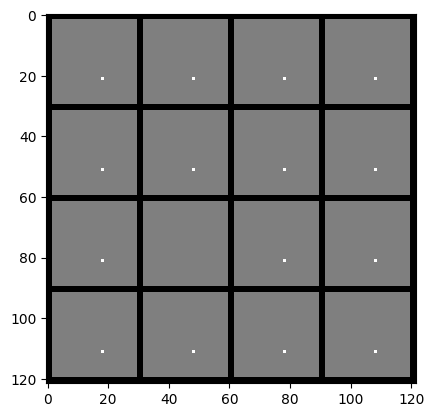

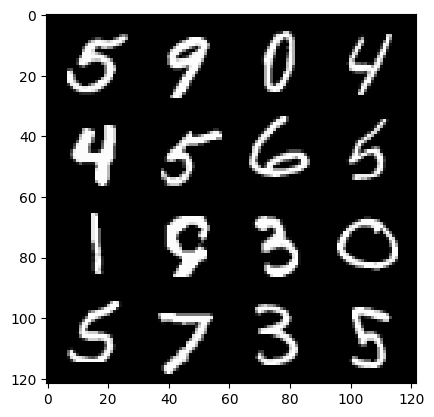

40: step 19200 / Gen loss: 963556.2376334637 / disc_loss: 1081688.7853236136


  0%|          | 0/469 [00:00<?, ?it/s]

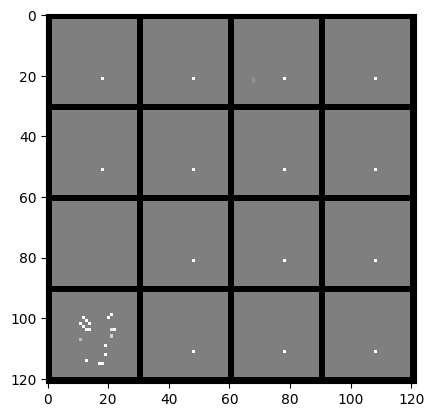

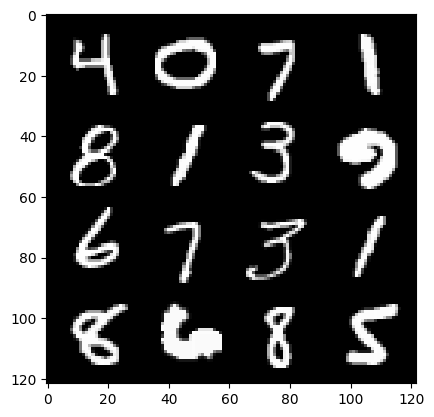

41: step 19500 / Gen loss: 252854.44073160808 / disc_loss: 1012164.3156994629


  0%|          | 0/469 [00:00<?, ?it/s]

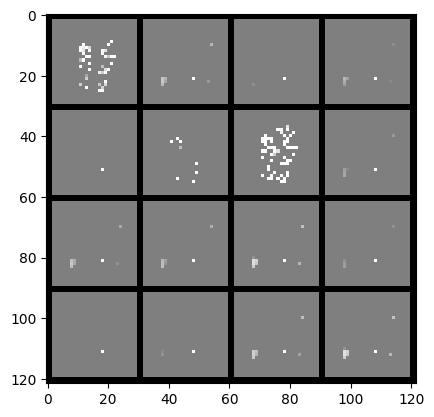

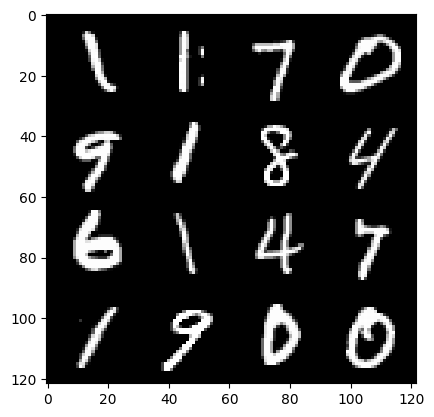

42: step 19800 / Gen loss: 275653.7214221191 / disc_loss: 1201602.4995774846


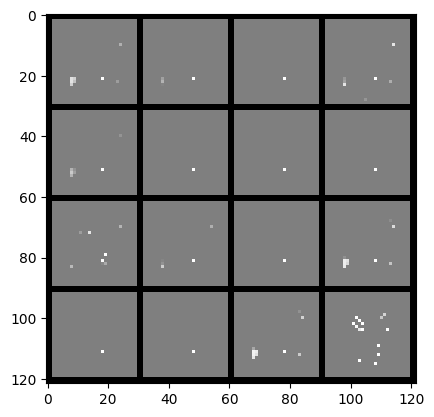

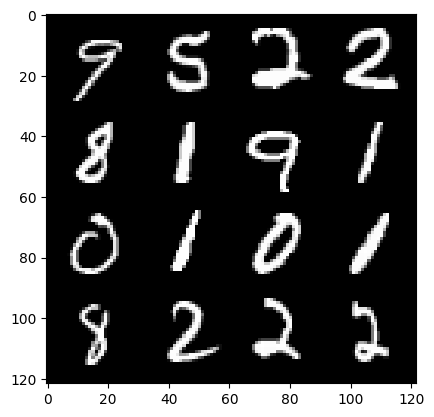

42: step 20100 / Gen loss: 638068.5966015627 / disc_loss: 1091831.8859389594


  0%|          | 0/469 [00:00<?, ?it/s]

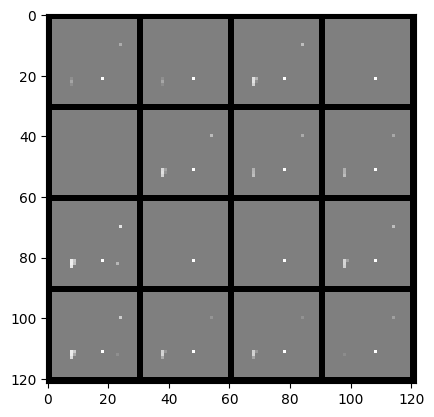

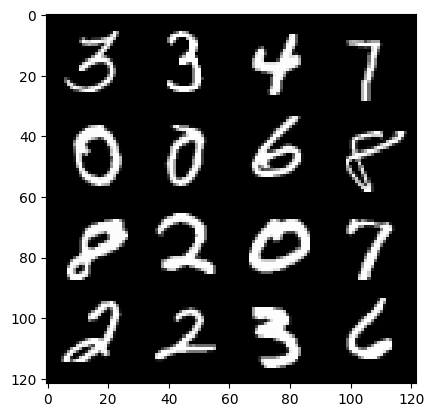

43: step 20400 / Gen loss: 511225.4885978188 / disc_loss: 562507.9643718209


  0%|          | 0/469 [00:00<?, ?it/s]

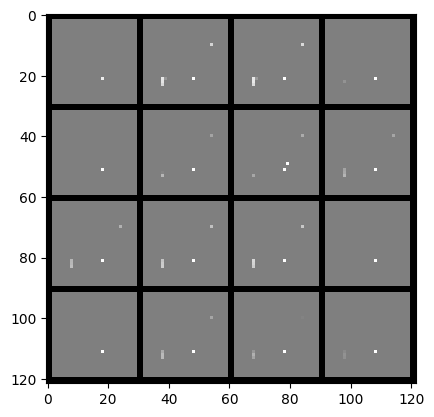

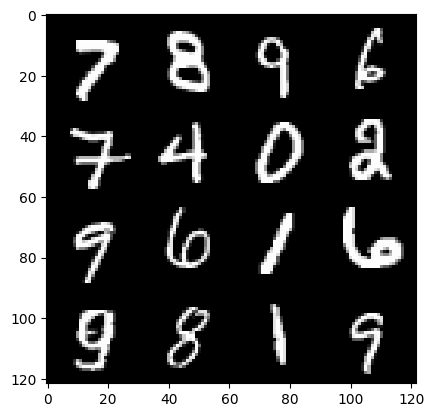

44: step 20700 / Gen loss: 630187.7340755209 / disc_loss: 1067643.183220135


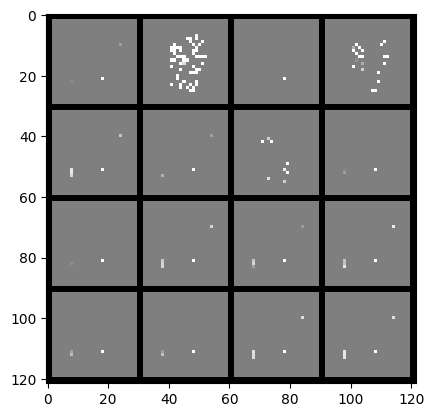

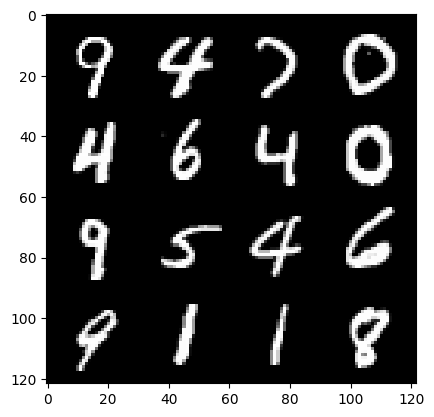

44: step 21000 / Gen loss: 994926.5772233071 / disc_loss: 2272126.9647451015


  0%|          | 0/469 [00:00<?, ?it/s]

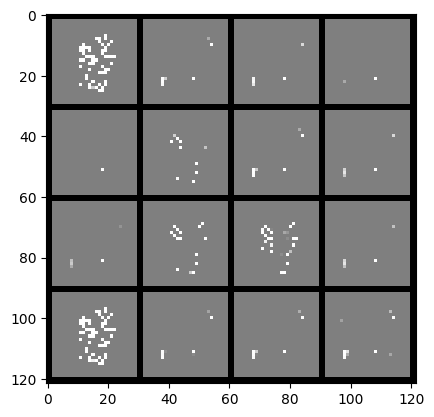

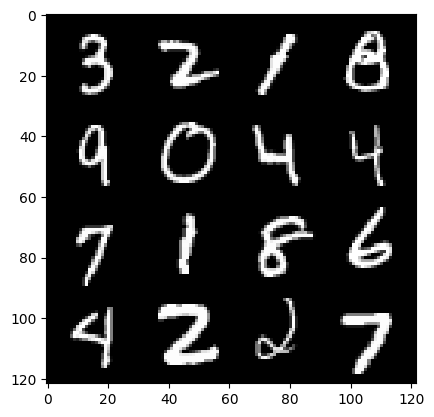

45: step 21300 / Gen loss: 1320861.3591080732 / disc_loss: 2075855.922369741


  0%|          | 0/469 [00:00<?, ?it/s]

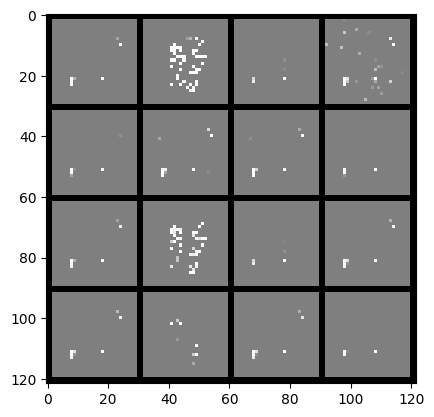

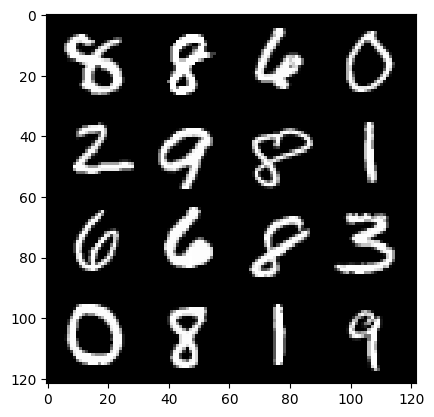

46: step 21600 / Gen loss: 685918.3029783118 / disc_loss: 2107558.899487914


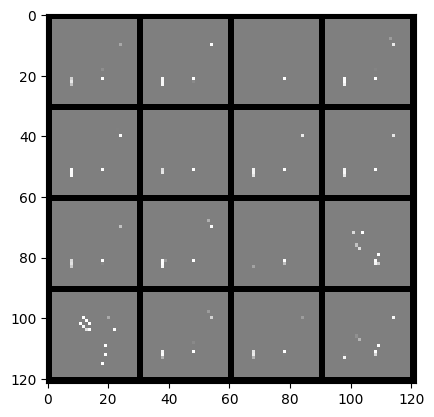

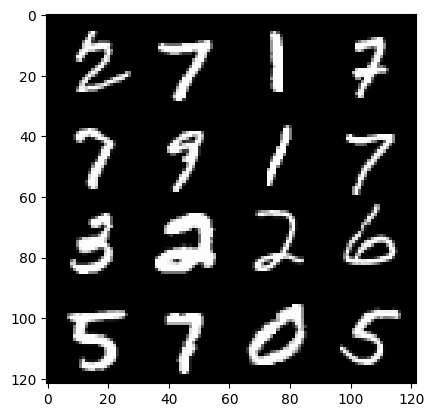

46: step 21900 / Gen loss: 863125.1972916664 / disc_loss: 1671679.5991581979


  0%|          | 0/469 [00:00<?, ?it/s]

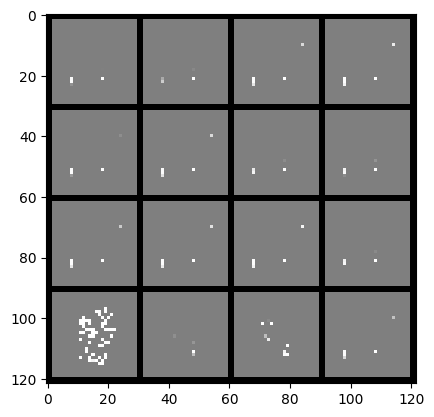

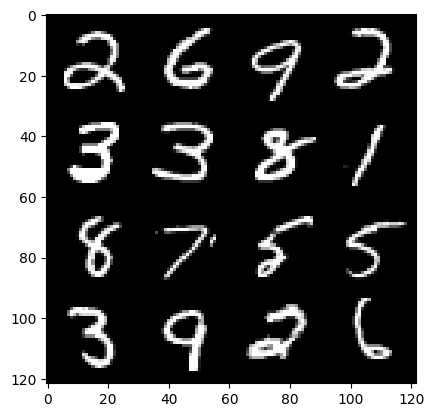

47: step 22200 / Gen loss: 1177662.9648437498 / disc_loss: 1542027.5918457021


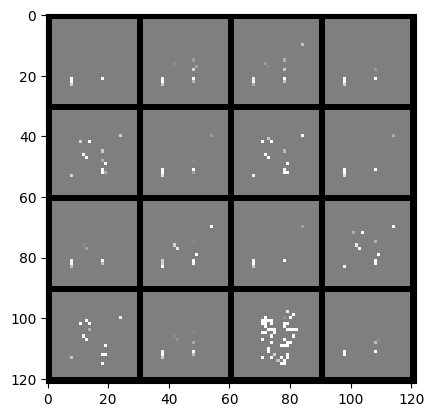

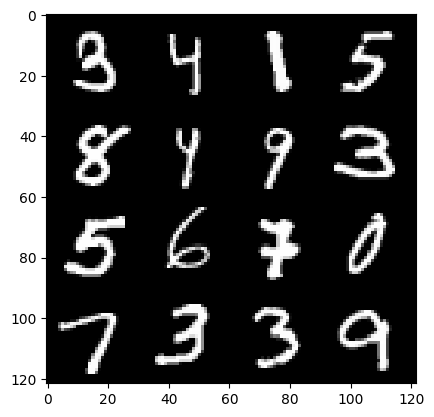

47: step 22500 / Gen loss: 707520.0118749999 / disc_loss: 2001021.6742473342


  0%|          | 0/469 [00:00<?, ?it/s]

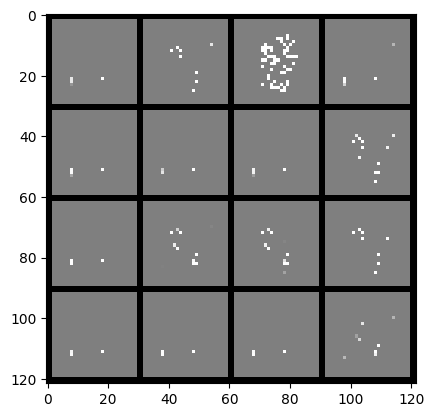

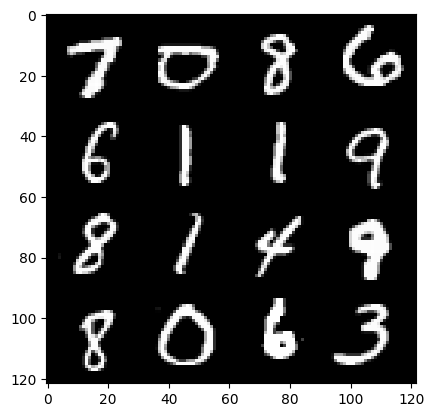

48: step 22800 / Gen loss: 861805.69140625 / disc_loss: 1615112.145757243


  0%|          | 0/469 [00:00<?, ?it/s]

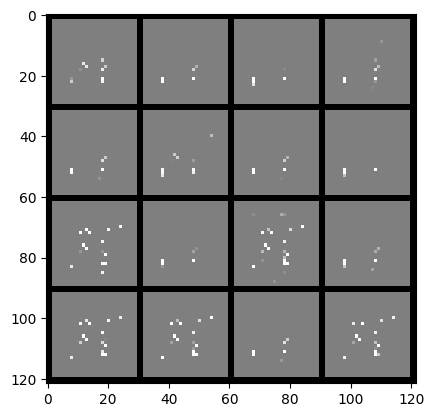

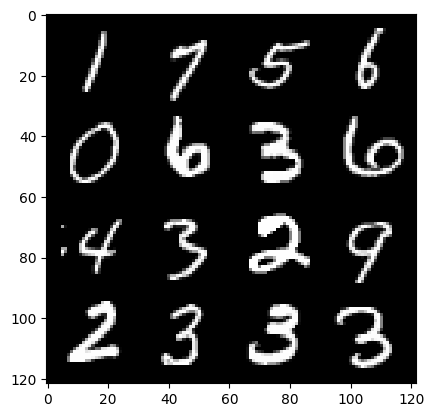

49: step 23100 / Gen loss: 535356.7993359374 / disc_loss: 1465139.3529568522


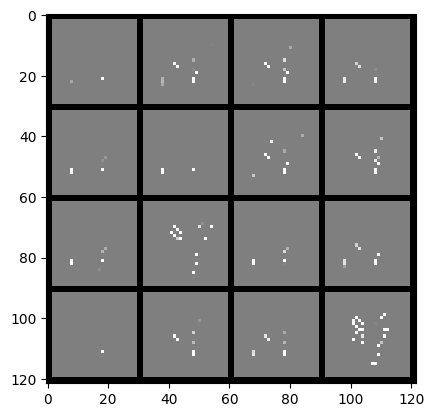

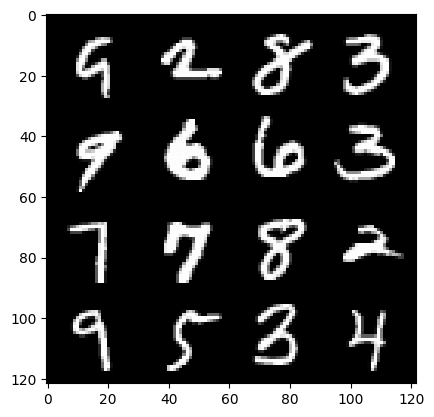

49: step 23400 / Gen loss: 950539.8064135747 / disc_loss: 2196383.2359394063


  0%|          | 0/469 [00:00<?, ?it/s]

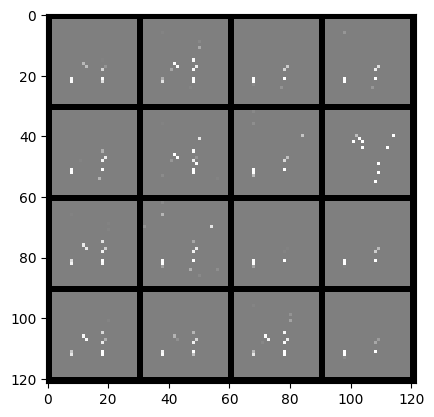

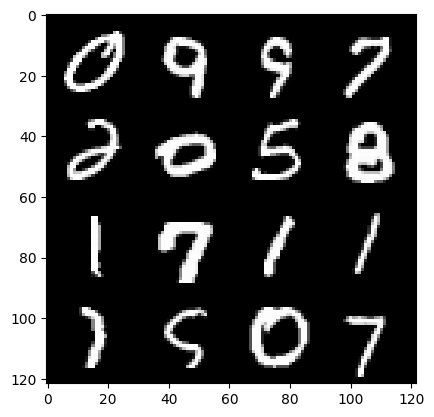

50: step 23700 / Gen loss: 2173502.684423471 / disc_loss: 3573482.744885254


  0%|          | 0/469 [00:00<?, ?it/s]

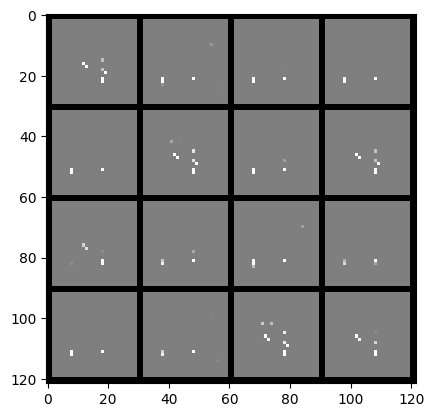

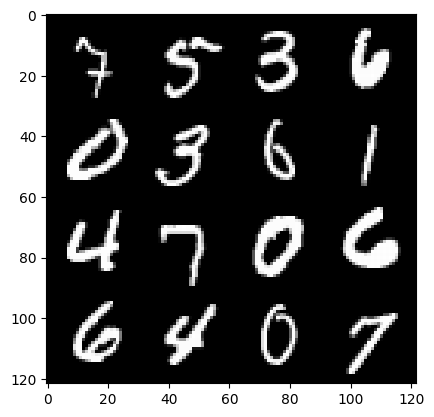

51: step 24000 / Gen loss: 2541376.2128253174 / disc_loss: 5878886.3181819655


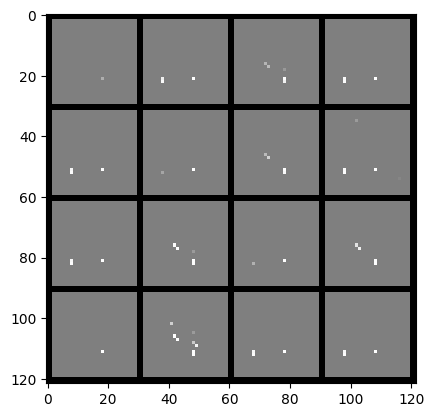

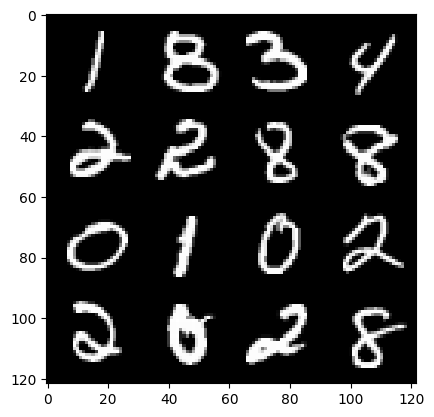

51: step 24300 / Gen loss: 3579531.7244270835 / disc_loss: 7031770.639776661


  0%|          | 0/469 [00:00<?, ?it/s]

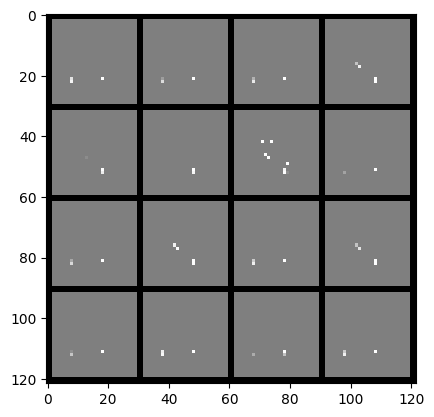

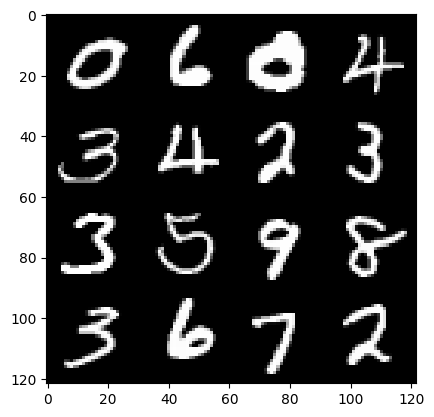

52: step 24600 / Gen loss: 3247595.9852018235 / disc_loss: 4243398.651209182


  0%|          | 0/469 [00:00<?, ?it/s]

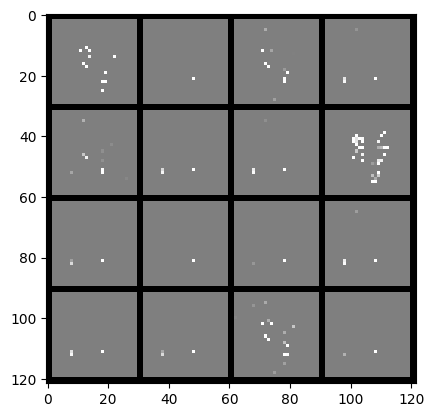

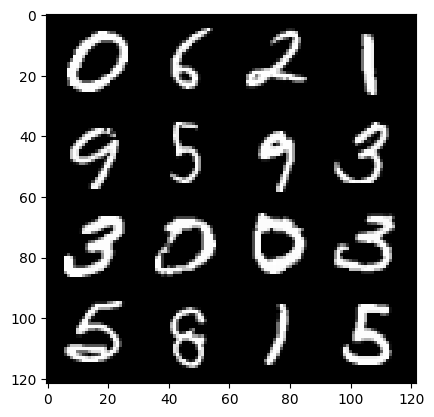

53: step 24900 / Gen loss: 3364908.38719996 / disc_loss: 3097555.9453741442


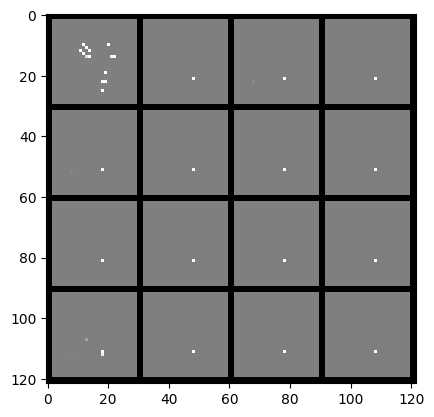

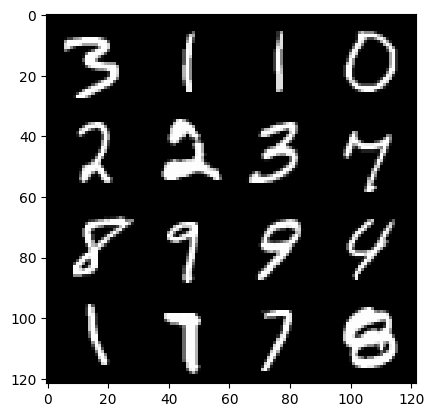

53: step 25200 / Gen loss: 791184.7909374998 / disc_loss: 4727984.509004515


  0%|          | 0/469 [00:00<?, ?it/s]

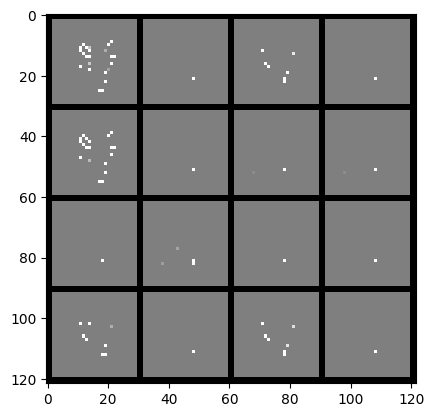

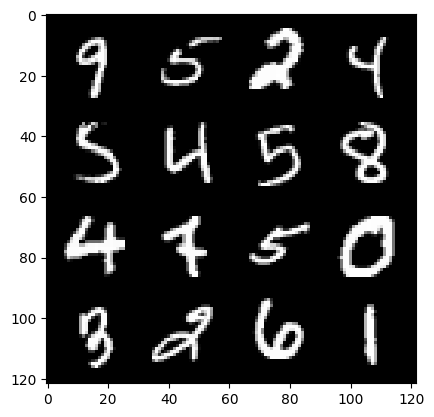

54: step 25500 / Gen loss: 805663.1420182289 / disc_loss: 2936261.8281907677


  0%|          | 0/469 [00:00<?, ?it/s]

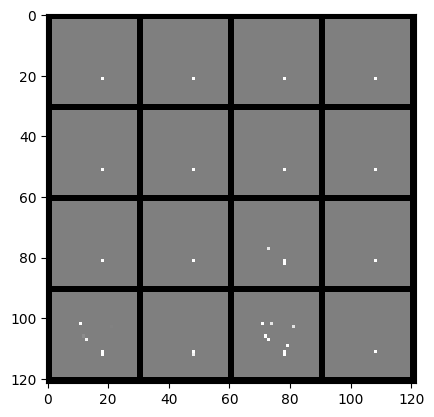

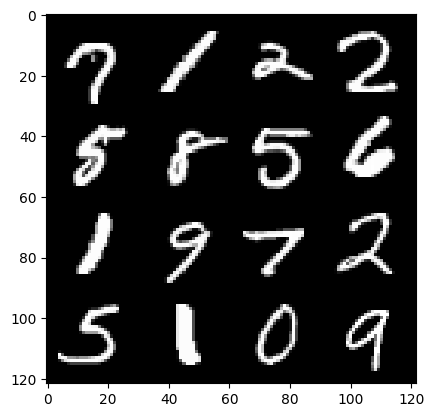

55: step 25800 / Gen loss: 2617464.7089583334 / disc_loss: 3034017.9545300305


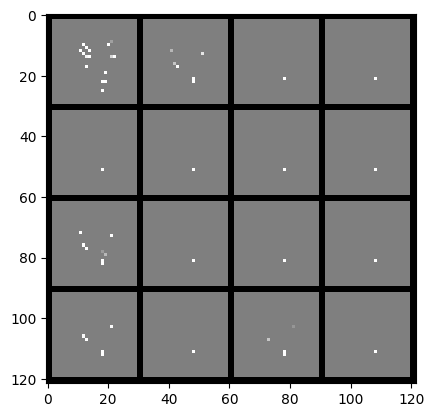

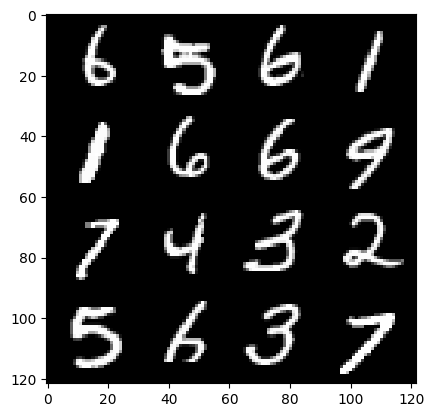

55: step 26100 / Gen loss: 2103090.8004166665 / disc_loss: 4149445.8047786443


  0%|          | 0/469 [00:00<?, ?it/s]

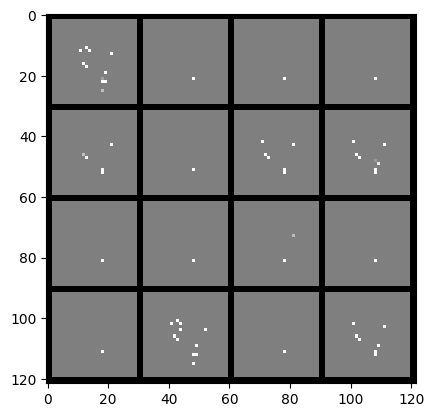

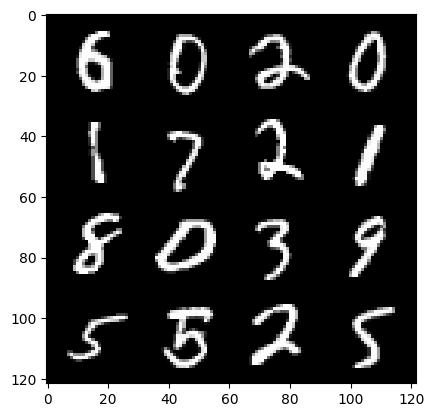

56: step 26400 / Gen loss: 1137407.5631966146 / disc_loss: 3325159.0292324326


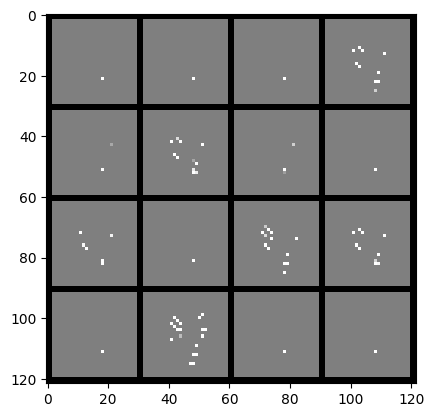

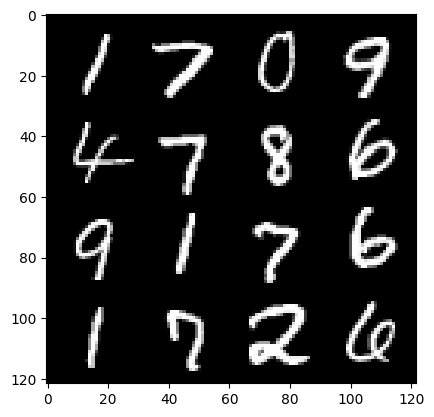

56: step 26700 / Gen loss: 1430946.1483658846 / disc_loss: 2473377.331438241


  0%|          | 0/469 [00:00<?, ?it/s]

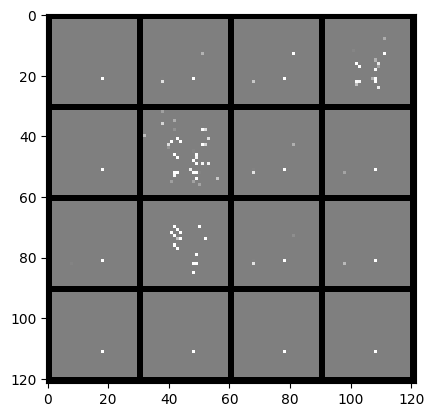

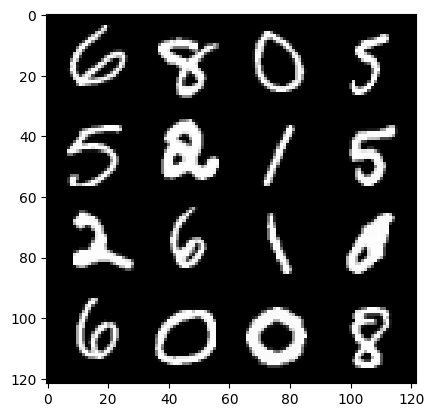

57: step 27000 / Gen loss: 641832.8723840334 / disc_loss: 2902416.8506355784


  0%|          | 0/469 [00:00<?, ?it/s]

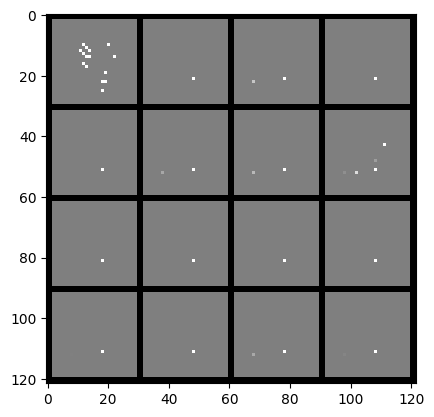

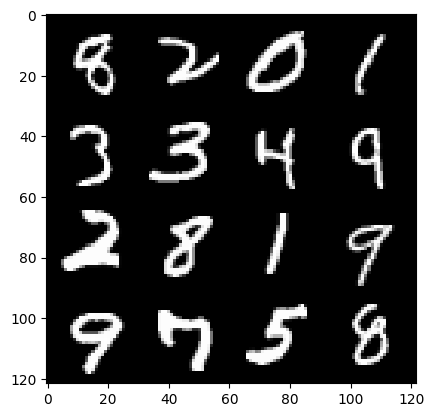

58: step 27300 / Gen loss: 2053961.047825114 / disc_loss: 4864409.414562989


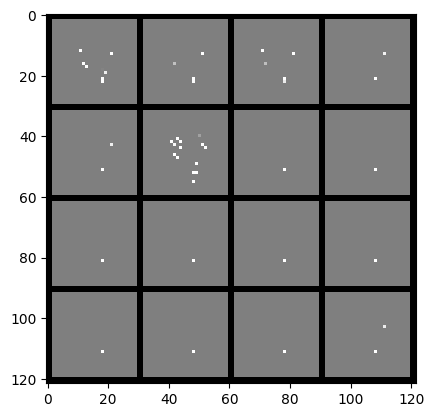

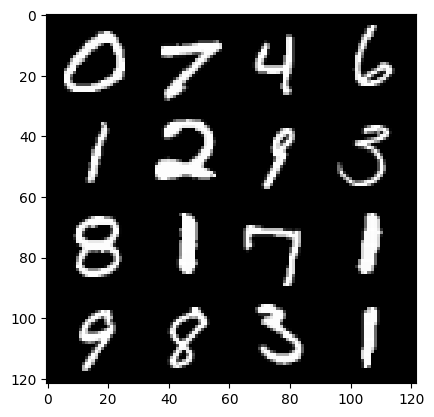

58: step 27600 / Gen loss: 4148993.9740364575 / disc_loss: 1837797.2873042822


  0%|          | 0/469 [00:00<?, ?it/s]

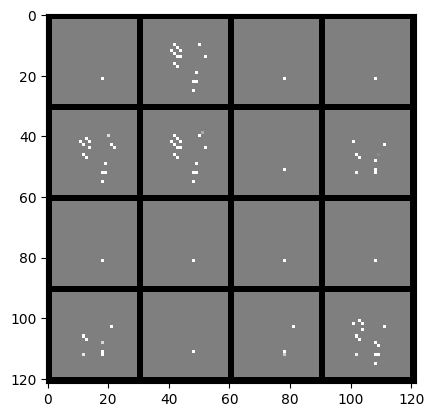

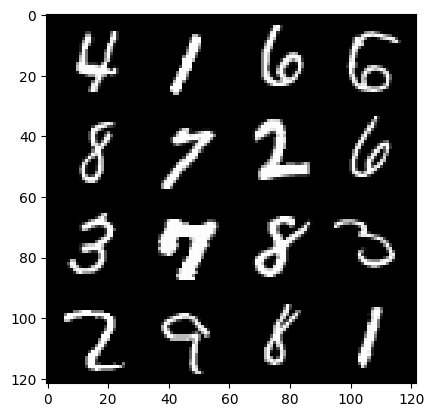

59: step 27900 / Gen loss: 0.0 / disc_loss: 9735865.083333338


  0%|          | 0/469 [00:00<?, ?it/s]

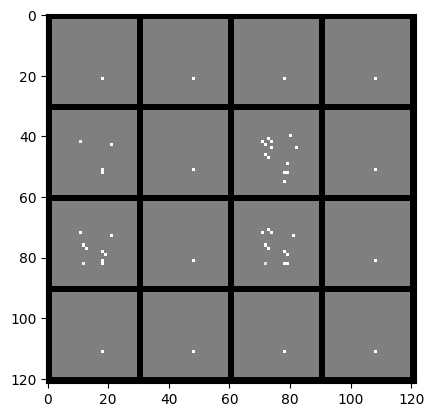

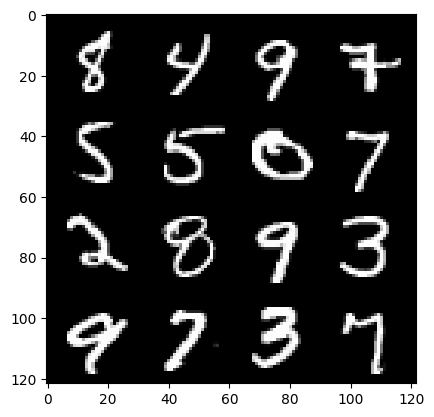

60: step 28200 / Gen loss: 6536616.68067708 / disc_loss: 1556930.680854022


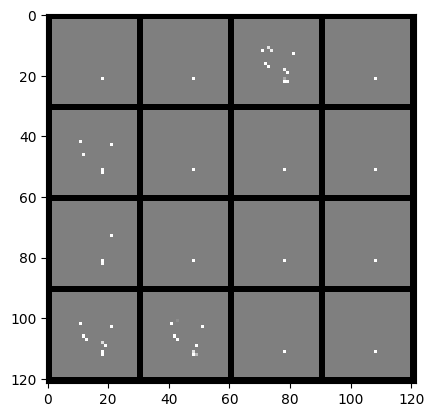

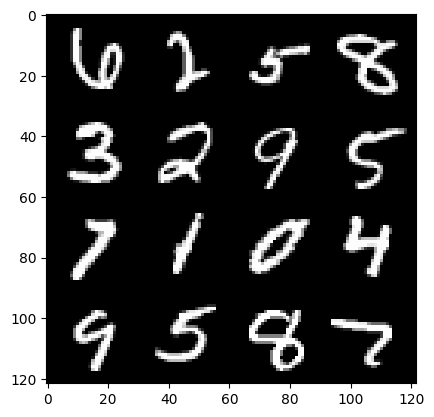

60: step 28500 / Gen loss: 849809.6101953123 / disc_loss: 8417048.696888018


  0%|          | 0/469 [00:00<?, ?it/s]

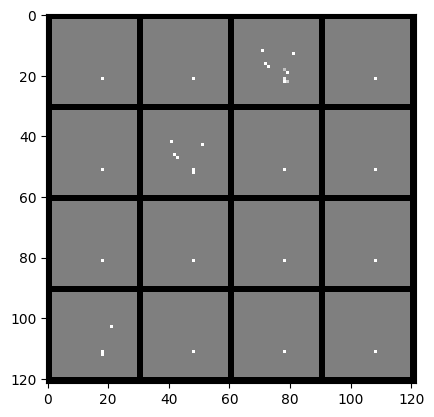

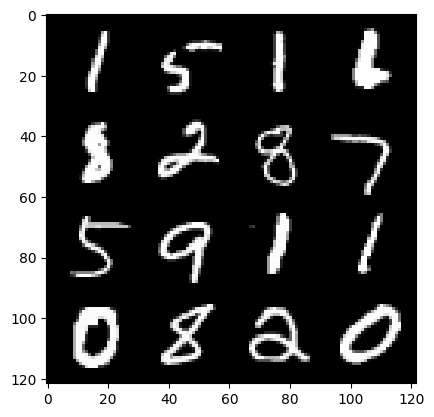

61: step 28800 / Gen loss: 1417652.6760677078 / disc_loss: 3132357.3616682948


  0%|          | 0/469 [00:00<?, ?it/s]

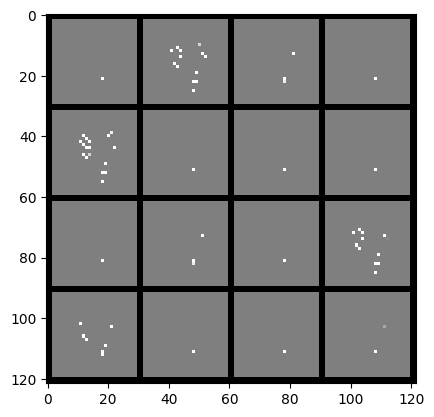

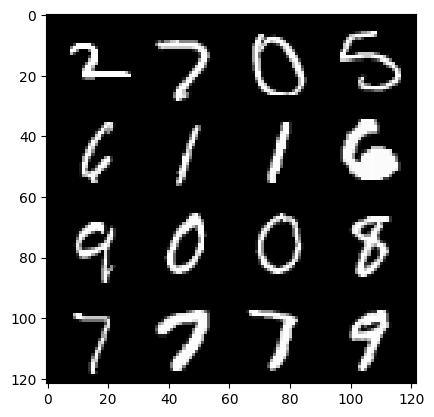

62: step 29100 / Gen loss: 1875902.7807812495 / disc_loss: 1975497.749257813


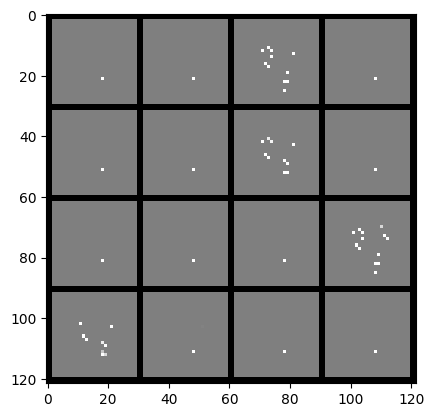

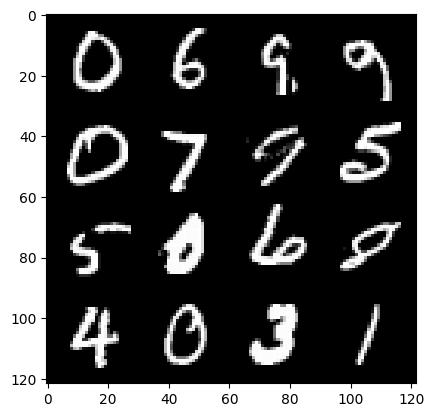

62: step 29400 / Gen loss: 849897.8816666667 / disc_loss: 2231540.903060125


  0%|          | 0/469 [00:00<?, ?it/s]

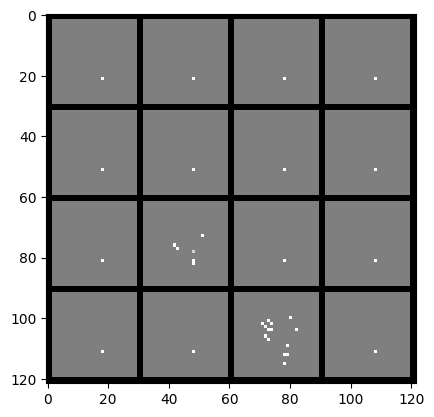

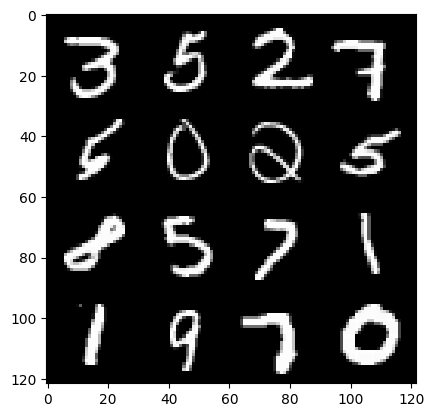

63: step 29700 / Gen loss: 878823.132776343 / disc_loss: 1779777.57078125


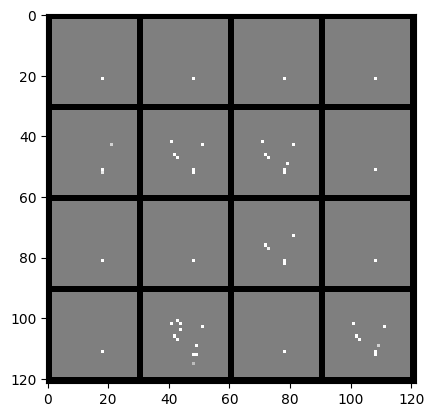

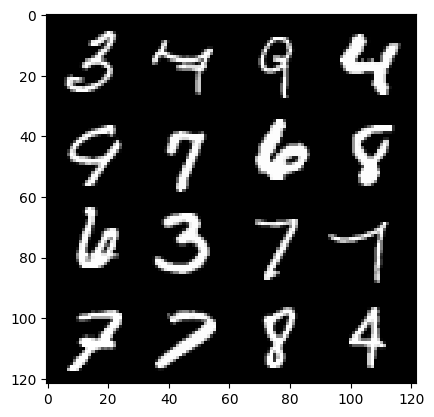

63: step 30000 / Gen loss: 816259.7962630206 / disc_loss: 1941224.497610676


  0%|          | 0/469 [00:00<?, ?it/s]

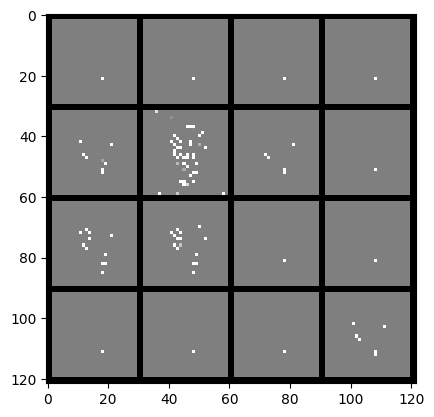

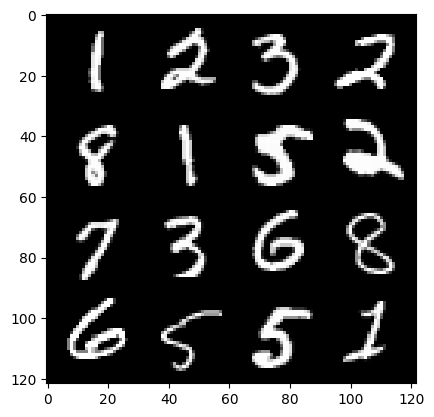

64: step 30300 / Gen loss: 1477200.5222233064 / disc_loss: 3305067.8351676427


  0%|          | 0/469 [00:00<?, ?it/s]

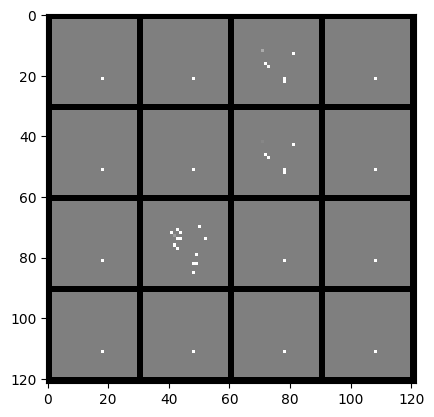

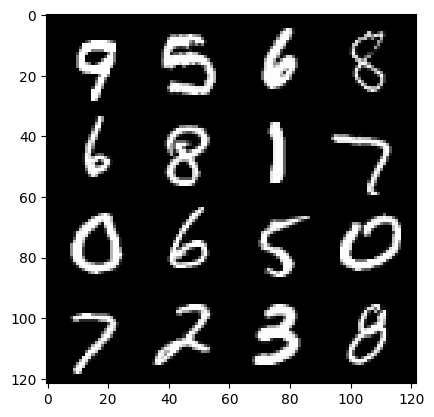

65: step 30600 / Gen loss: 1863483.43359375 / disc_loss: 1941880.648450725


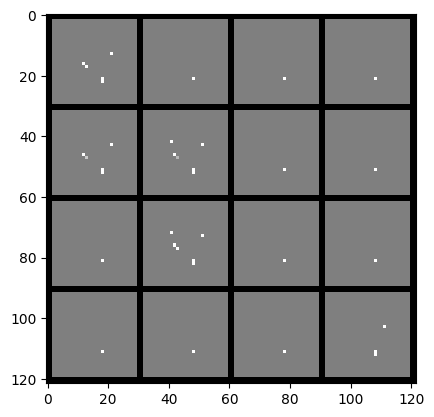

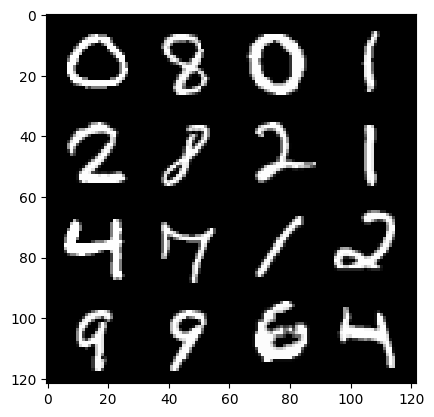

65: step 30900 / Gen loss: 663373.3392252604 / disc_loss: 2141587.1228309134


  0%|          | 0/469 [00:00<?, ?it/s]

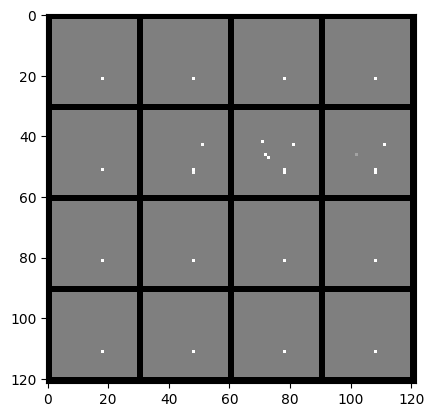

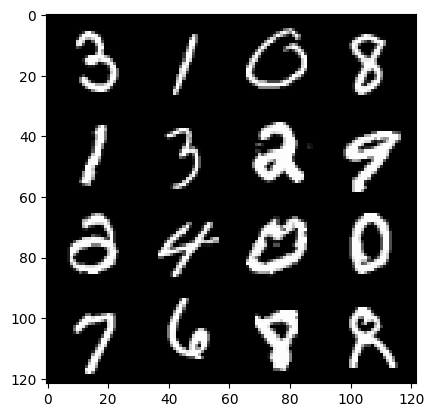

66: step 31200 / Gen loss: 1396777.0649479167 / disc_loss: 3172119.165618895


  0%|          | 0/469 [00:00<?, ?it/s]

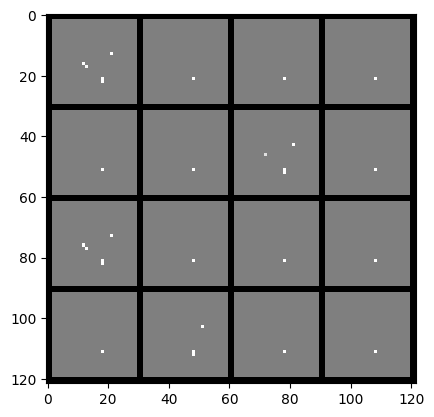

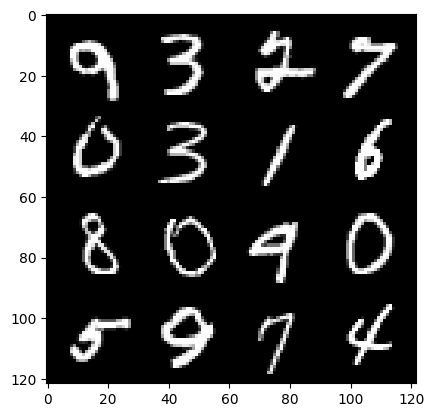

67: step 31500 / Gen loss: 2209219.7428483074 / disc_loss: 3042425.442524895


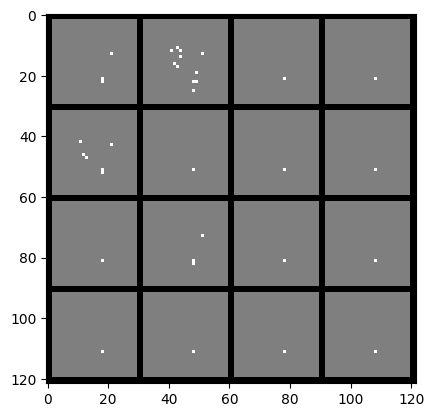

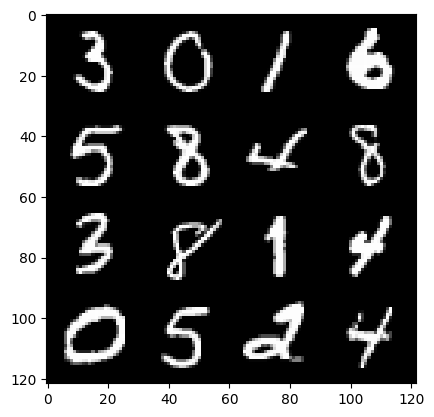

67: step 31800 / Gen loss: 2571479.198645833 / disc_loss: 2467253.578898112


  0%|          | 0/469 [00:00<?, ?it/s]

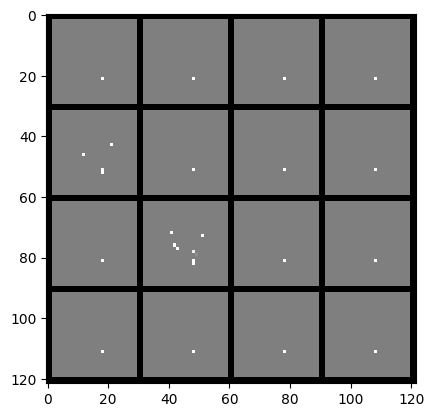

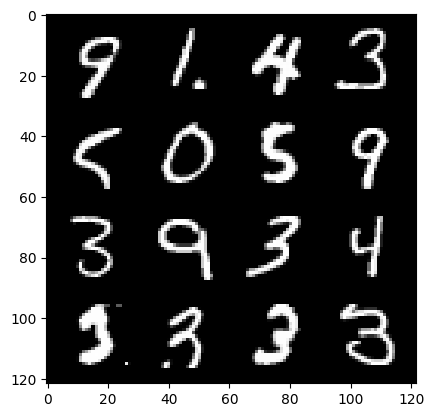

68: step 32100 / Gen loss: 1840899.0954687488 / disc_loss: 3279897.409046224


  0%|          | 0/469 [00:00<?, ?it/s]

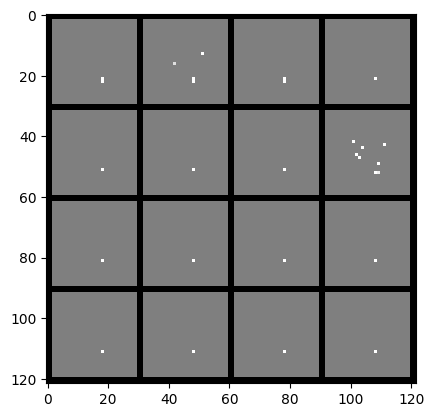

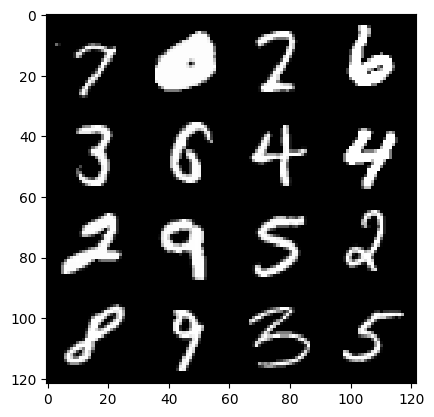

69: step 32400 / Gen loss: 490997.0865039652 / disc_loss: 3252552.150309271


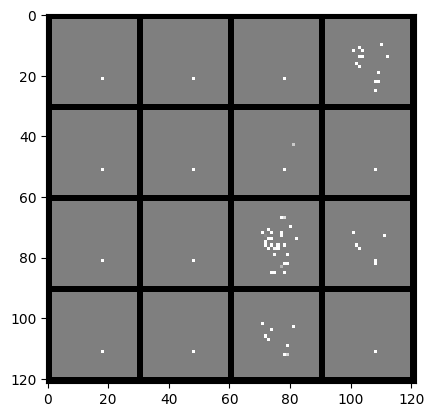

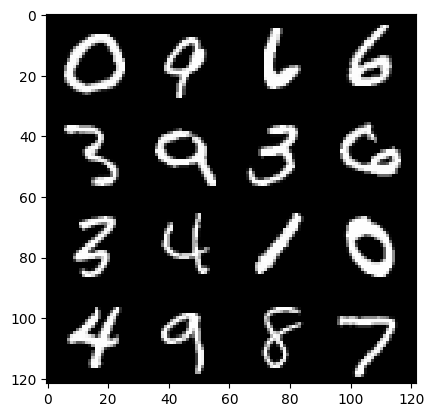

69: step 32700 / Gen loss: 780434.7872200522 / disc_loss: 1310401.9624087512


  0%|          | 0/469 [00:00<?, ?it/s]

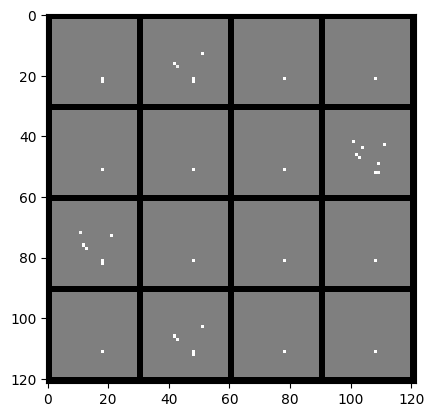

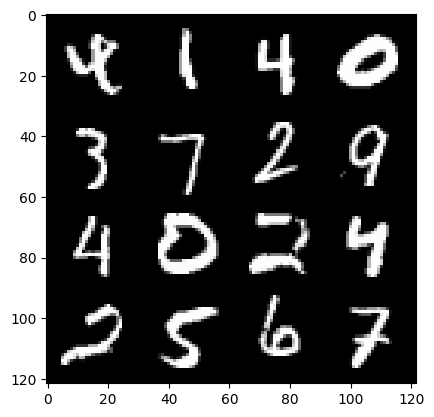

70: step 33000 / Gen loss: 207395.94469973256 / disc_loss: 1342394.9646350222


  0%|          | 0/469 [00:00<?, ?it/s]

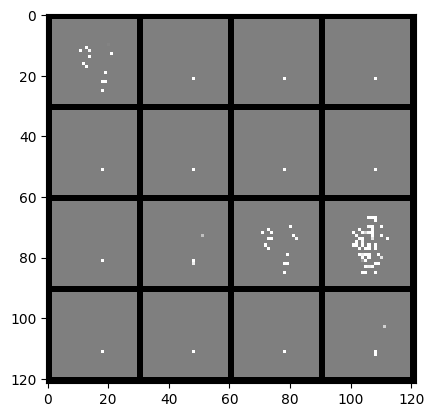

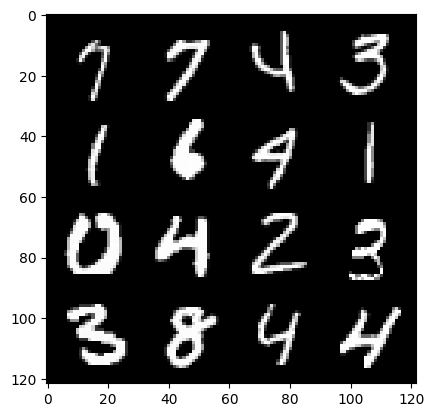

71: step 33300 / Gen loss: 732653.6334684248 / disc_loss: 2393017.912460913


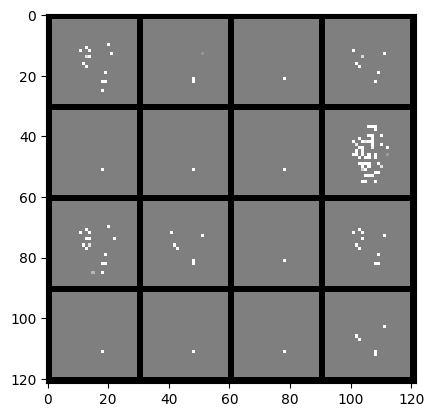

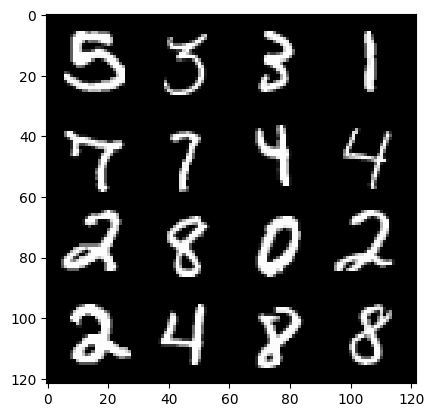

71: step 33600 / Gen loss: 2037665.0927975446 / disc_loss: 2953379.7346093752


  0%|          | 0/469 [00:00<?, ?it/s]

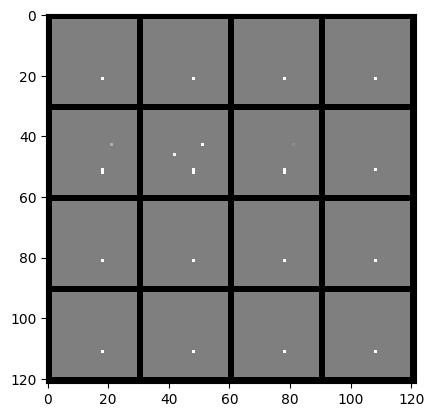

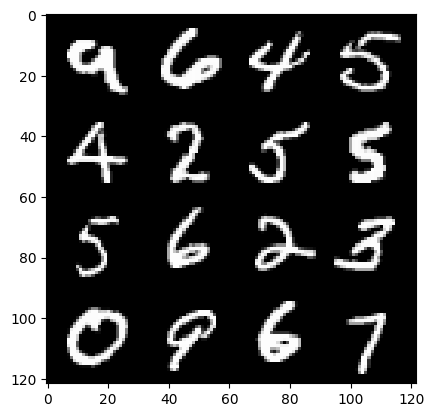

72: step 33900 / Gen loss: 3378754.074769402 / disc_loss: 2596894.6324609397


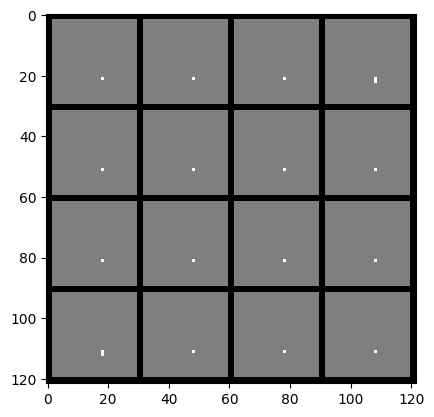

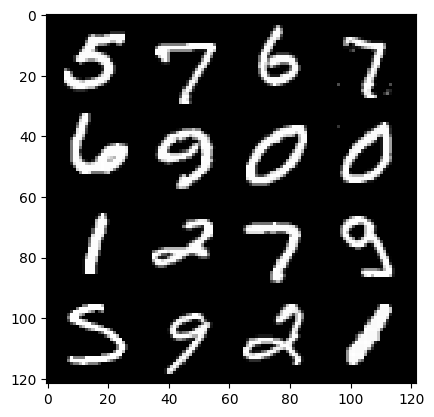

72: step 34200 / Gen loss: 1082779.4103841144 / disc_loss: 4675618.395115969


  0%|          | 0/469 [00:00<?, ?it/s]

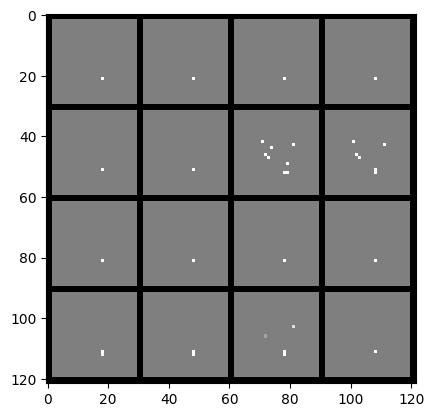

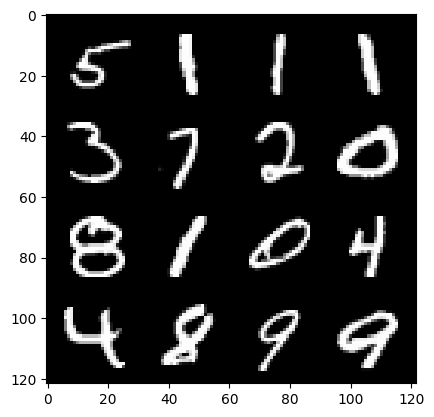

73: step 34500 / Gen loss: 232800.2654821778 / disc_loss: 1230908.8377720134


  0%|          | 0/469 [00:00<?, ?it/s]

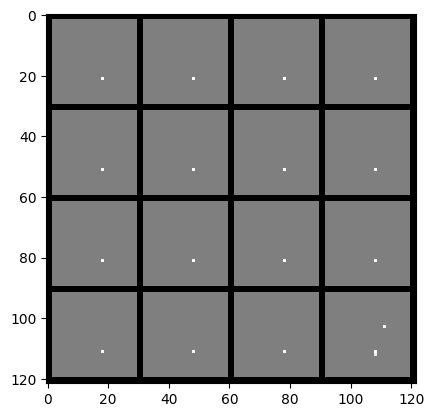

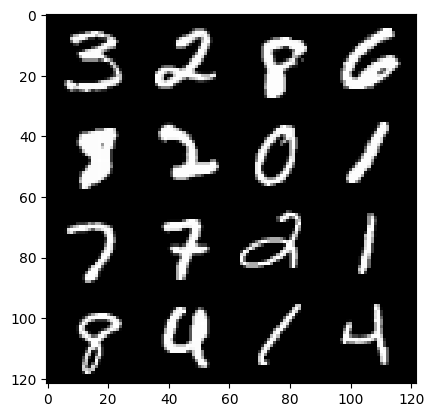

74: step 34800 / Gen loss: 2021828.538954264 / disc_loss: 2381899.296710713


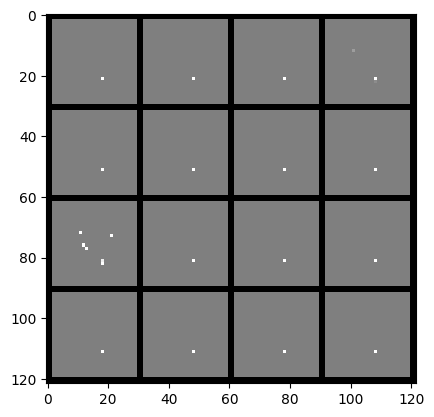

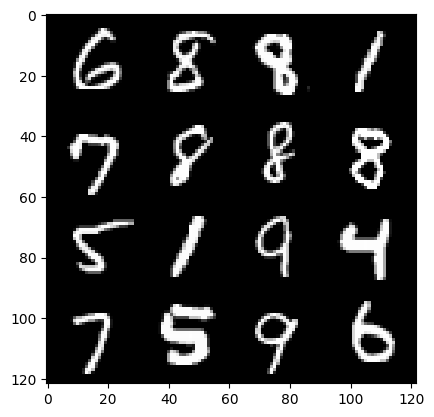

74: step 35100 / Gen loss: 3345567.460546875 / disc_loss: 3932680.0762760425


  0%|          | 0/469 [00:00<?, ?it/s]

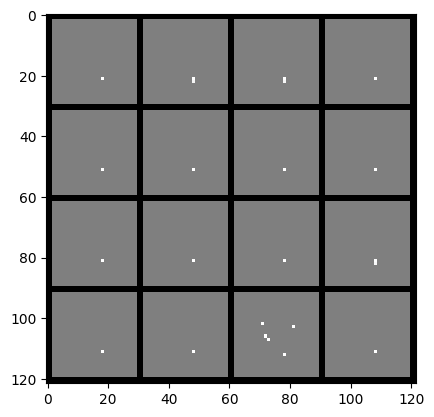

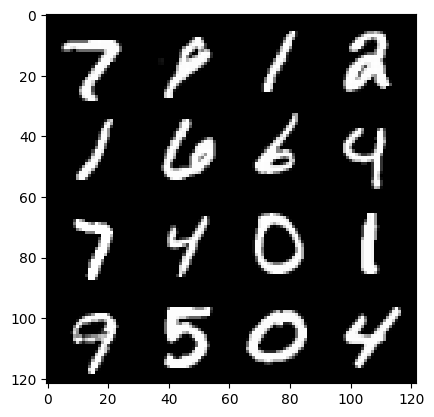

75: step 35400 / Gen loss: 543804.3951562499 / disc_loss: 8436350.323229171


  0%|          | 0/469 [00:00<?, ?it/s]

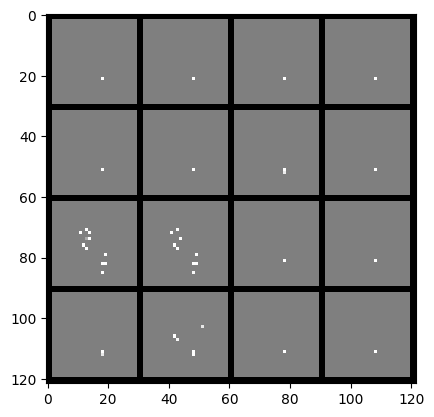

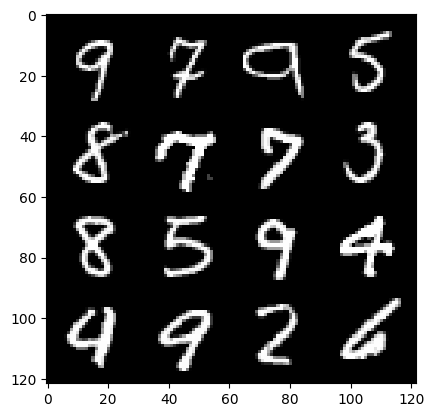

76: step 35700 / Gen loss: 5210194.059724937 / disc_loss: 1666555.3776319372


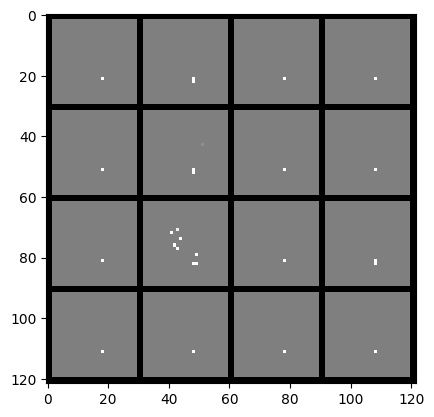

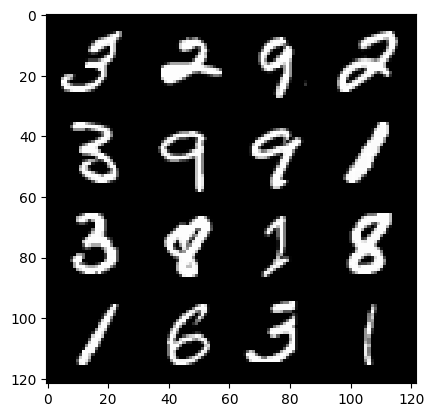

76: step 36000 / Gen loss: 455807.08225260425 / disc_loss: 7217709.175548095


  0%|          | 0/469 [00:00<?, ?it/s]

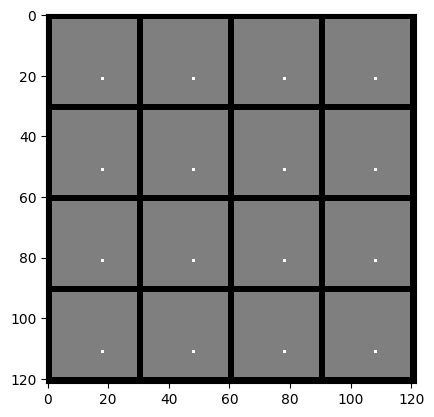

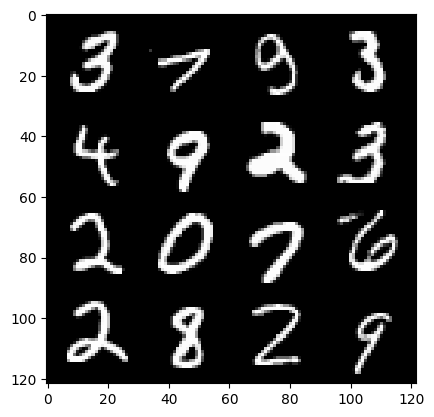

77: step 36300 / Gen loss: 1368135.9197916659 / disc_loss: 2871128.146692197


  0%|          | 0/469 [00:00<?, ?it/s]

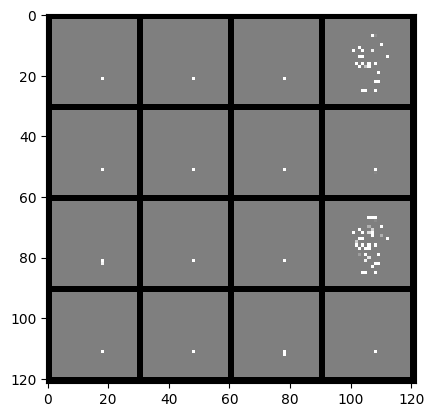

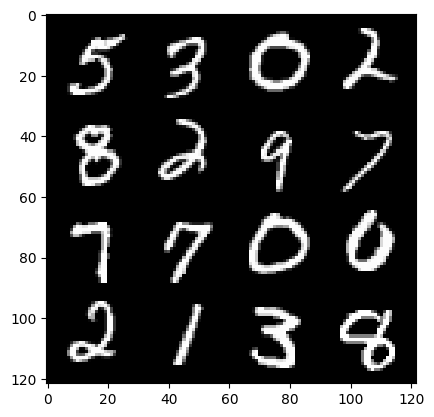

78: step 36600 / Gen loss: 2349531.2211197917 / disc_loss: 3752611.647165287


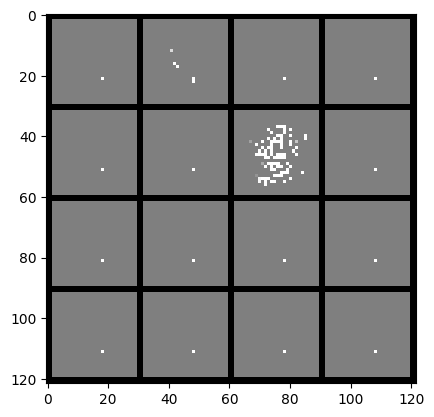

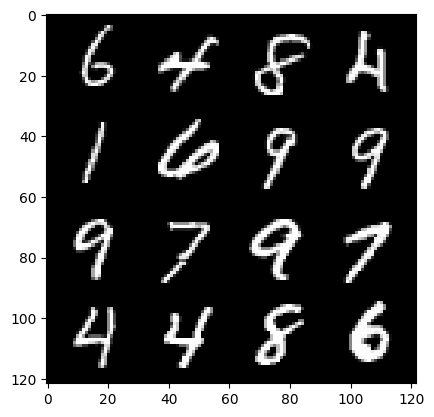

78: step 36900 / Gen loss: 3925786.5251757824 / disc_loss: 2279253.8073828123


  0%|          | 0/469 [00:00<?, ?it/s]

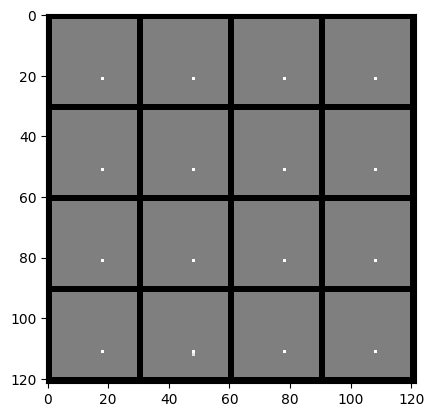

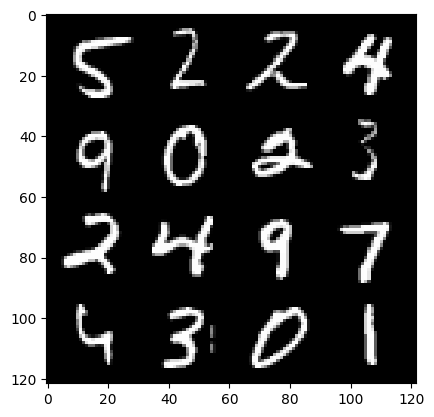

79: step 37200 / Gen loss: 2663826.0688541667 / disc_loss: 7844172.486344409


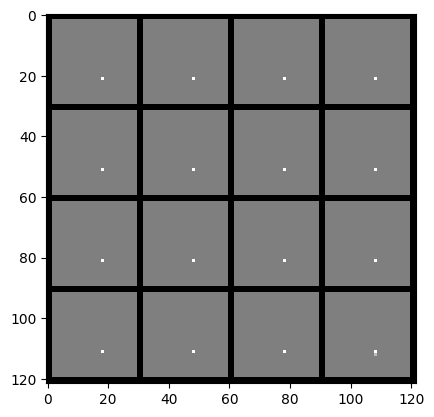

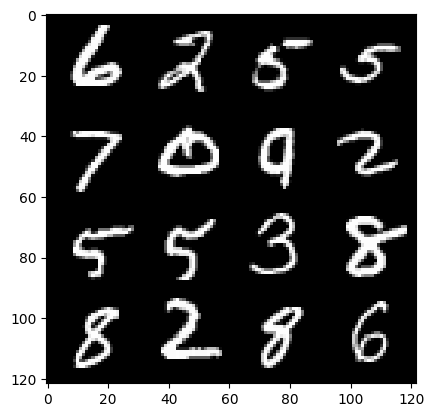

79: step 37500 / Gen loss: 2557023.7038374837 / disc_loss: 4089592.730742189


  0%|          | 0/469 [00:00<?, ?it/s]

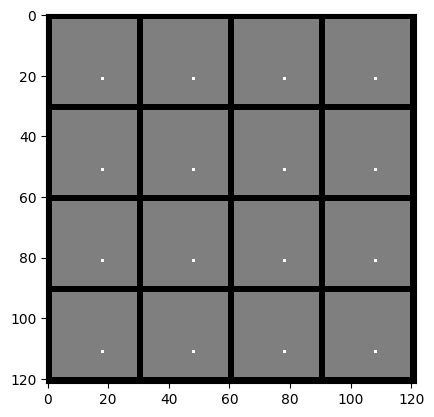

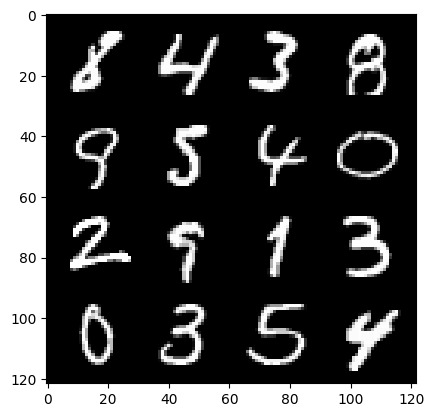

80: step 37800 / Gen loss: 945197.6462369789 / disc_loss: 6433092.49905273


  0%|          | 0/469 [00:00<?, ?it/s]

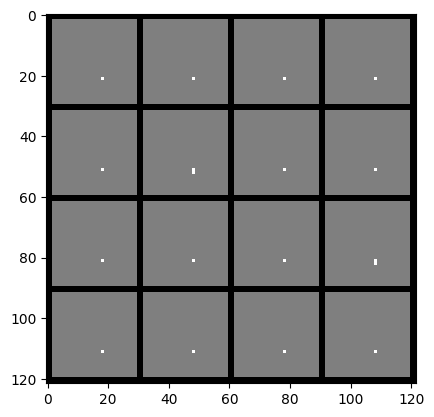

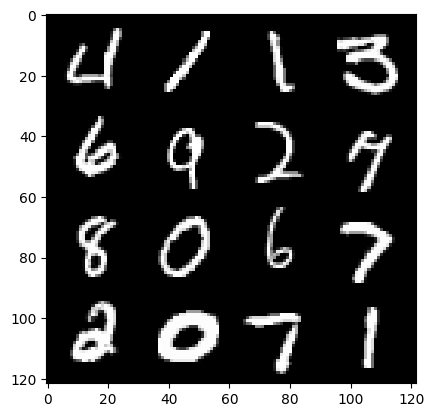

81: step 38100 / Gen loss: 4128506.459375001 / disc_loss: 6767318.999304607


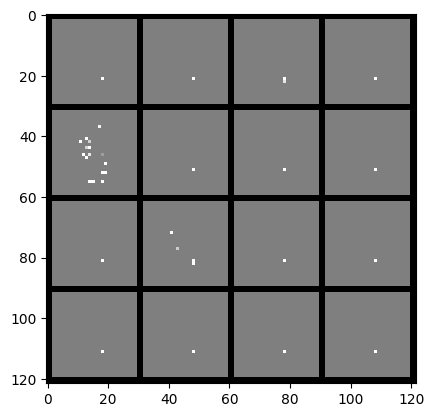

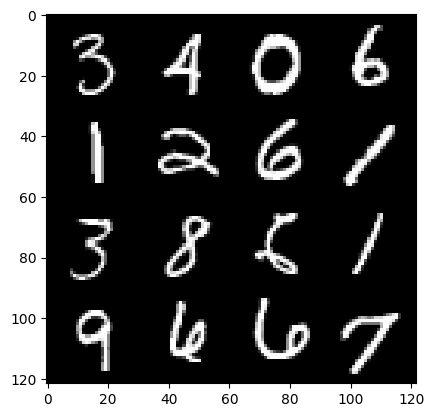

81: step 38400 / Gen loss: 1807360.9966939287 / disc_loss: 7178452.779720255


  0%|          | 0/469 [00:00<?, ?it/s]

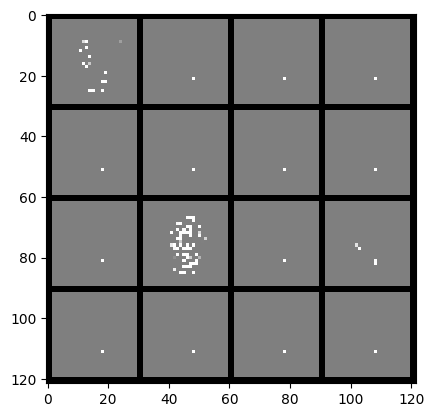

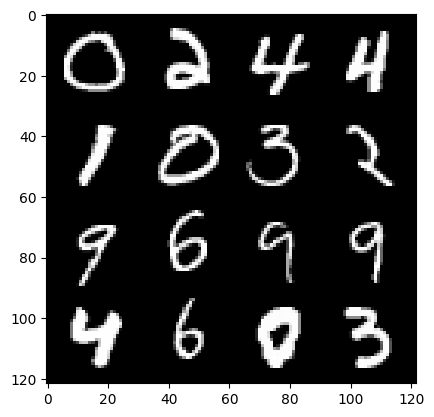

82: step 38700 / Gen loss: 2947901.9622542323 / disc_loss: 4295213.280314739


  0%|          | 0/469 [00:00<?, ?it/s]

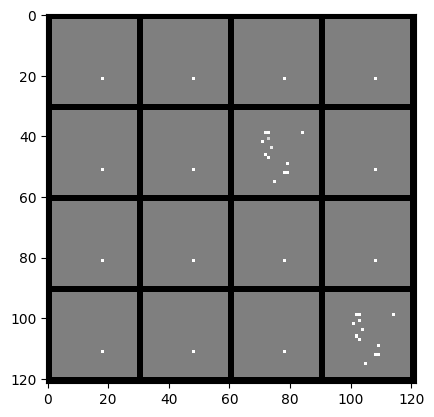

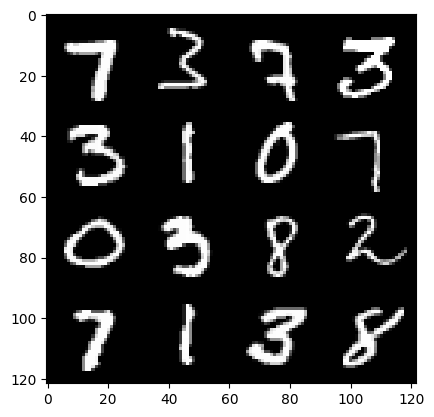

83: step 39000 / Gen loss: 2843296.7159375 / disc_loss: 4946354.967591551


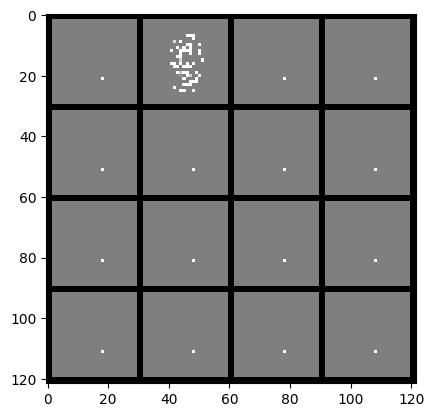

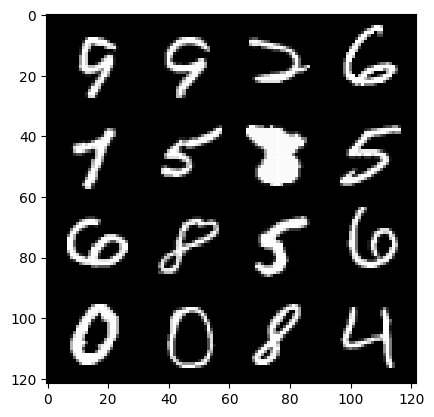

83: step 39300 / Gen loss: 5648293.56538086 / disc_loss: 4378790.060104164


  0%|          | 0/469 [00:00<?, ?it/s]

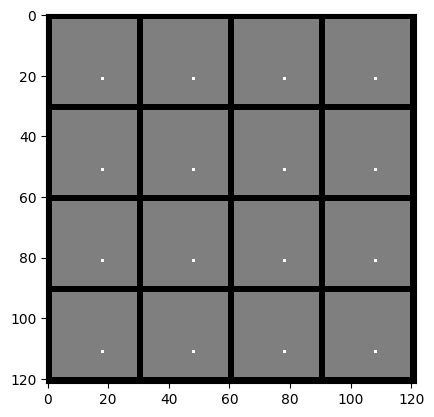

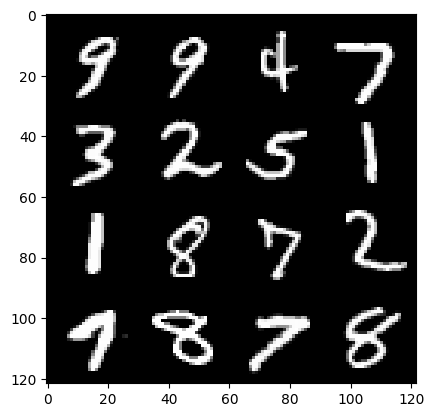

84: step 39600 / Gen loss: 352735.8594775391 / disc_loss: 13667468.153229162


  0%|          | 0/469 [00:00<?, ?it/s]

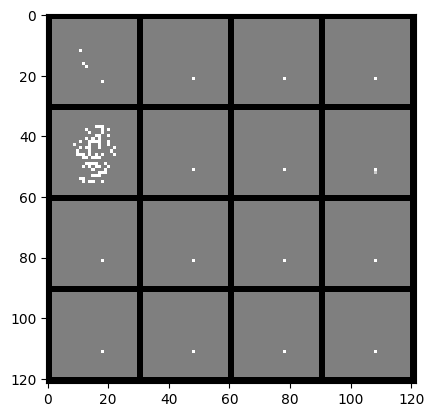

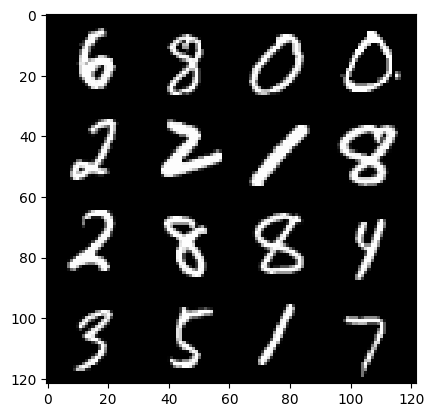

85: step 39900 / Gen loss: 7607531.295455731 / disc_loss: 7495608.425052085


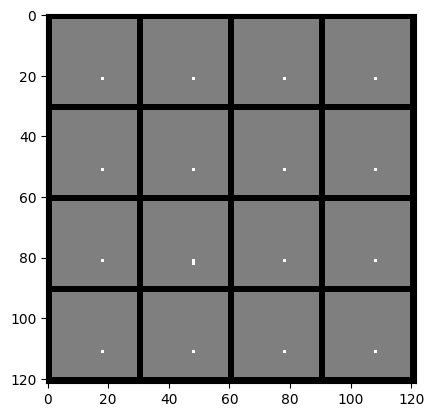

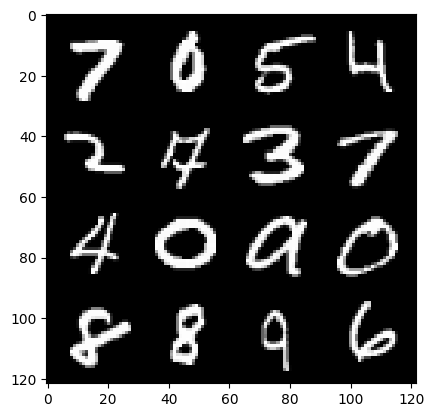

85: step 40200 / Gen loss: 6997363.1046354165 / disc_loss: 7674657.06158854


  0%|          | 0/469 [00:00<?, ?it/s]

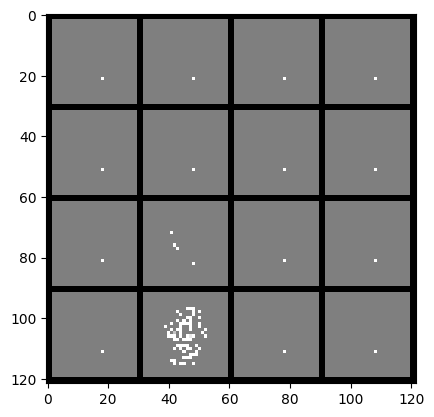

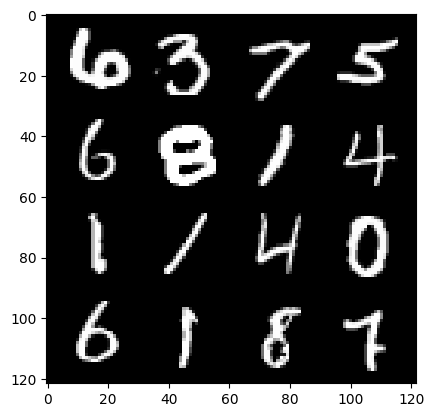

86: step 40500 / Gen loss: 340430.1716389974 / disc_loss: 15433805.869374996


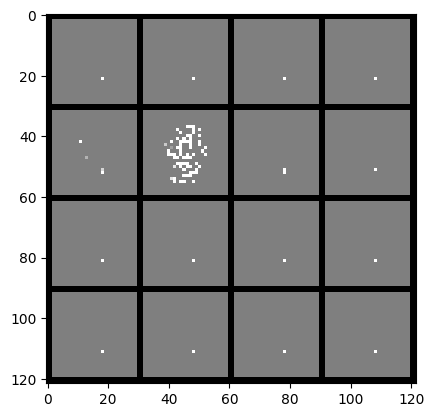

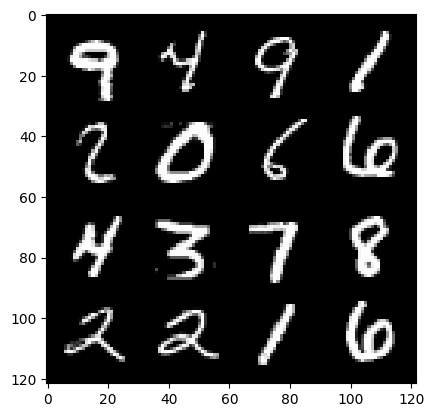

86: step 40800 / Gen loss: 9987149.86447469 / disc_loss: 2600435.3586745206


  0%|          | 0/469 [00:00<?, ?it/s]

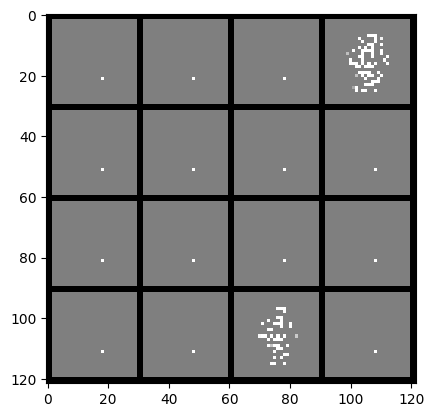

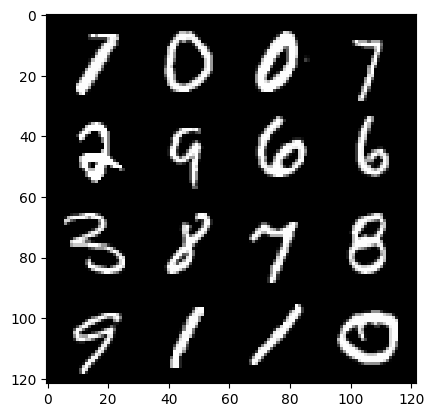

87: step 41100 / Gen loss: 0.0 / disc_loss: 18837758.56499999


  0%|          | 0/469 [00:00<?, ?it/s]

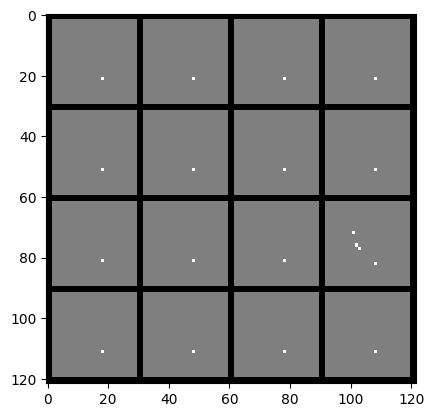

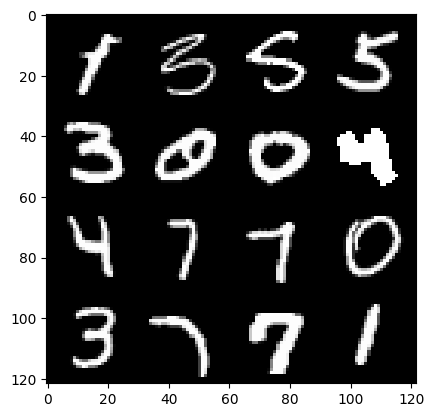

88: step 41400 / Gen loss: 11722021.157937821 / disc_loss: 1810626.0130208335


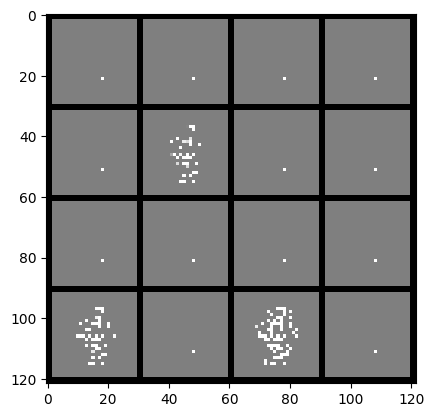

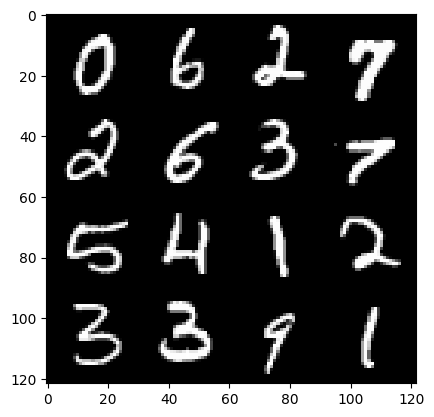

88: step 41700 / Gen loss: 0.0 / disc_loss: 20305470.006666668


  0%|          | 0/469 [00:00<?, ?it/s]

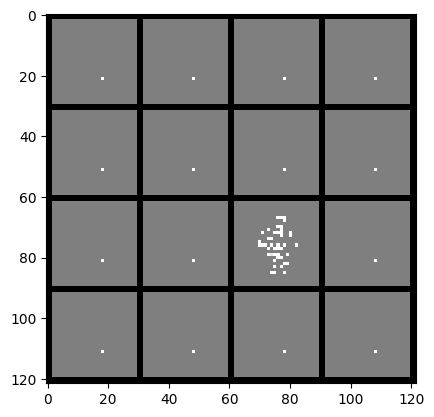

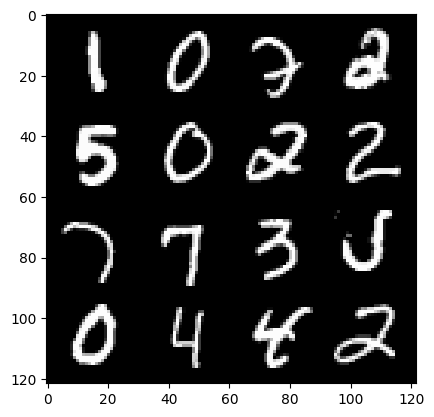

89: step 42000 / Gen loss: 8421979.274363603 / disc_loss: 2680201.0987530528


  0%|          | 0/469 [00:00<?, ?it/s]

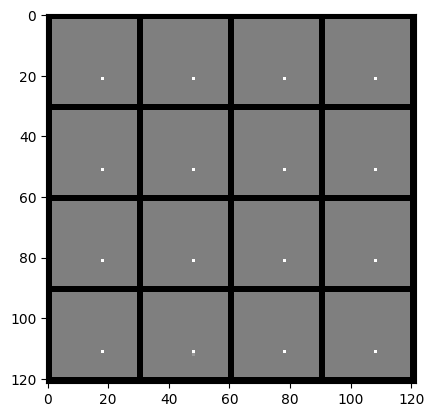

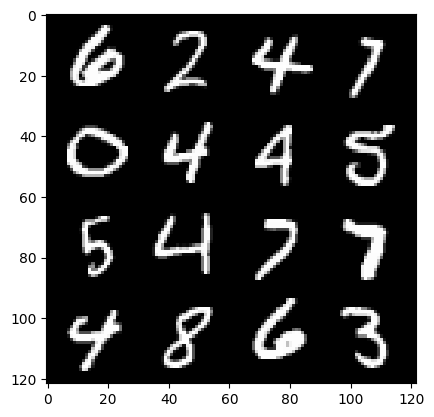

90: step 42300 / Gen loss: 1117868.6668229168 / disc_loss: 8214139.851224391


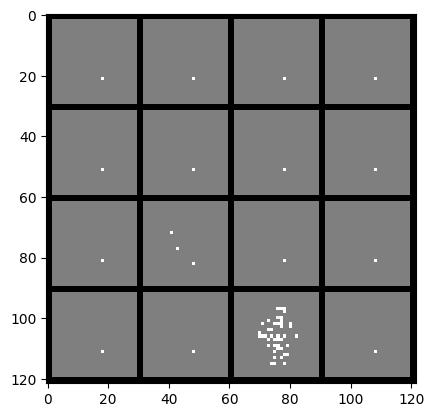

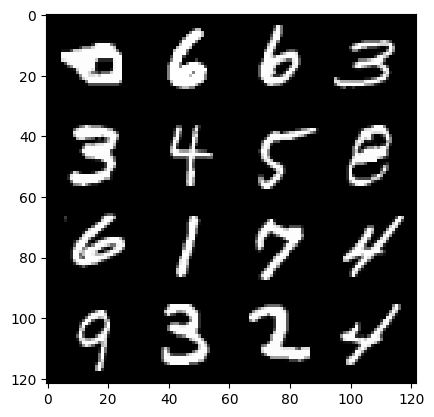

90: step 42600 / Gen loss: 2292652.040485027 / disc_loss: 6608998.679350382


  0%|          | 0/469 [00:00<?, ?it/s]

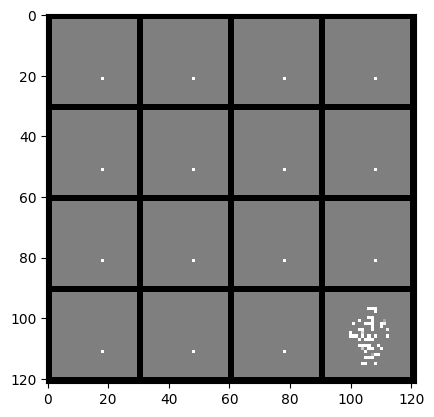

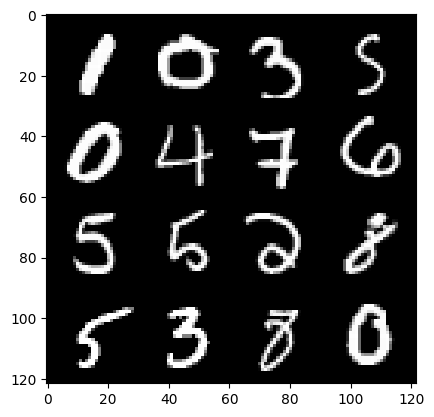

91: step 42900 / Gen loss: 3167954.607217611 / disc_loss: 3669858.646279308


  0%|          | 0/469 [00:00<?, ?it/s]

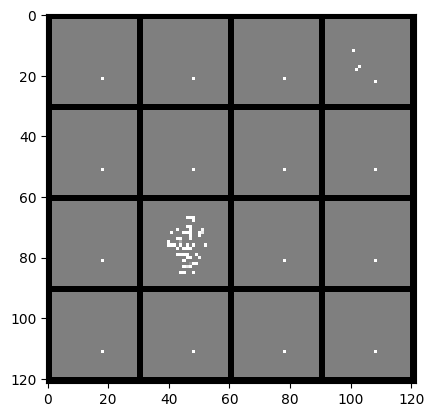

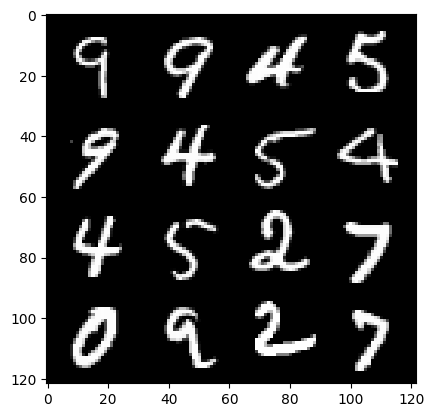

92: step 43200 / Gen loss: 2403394.256683146 / disc_loss: 3349018.805384115


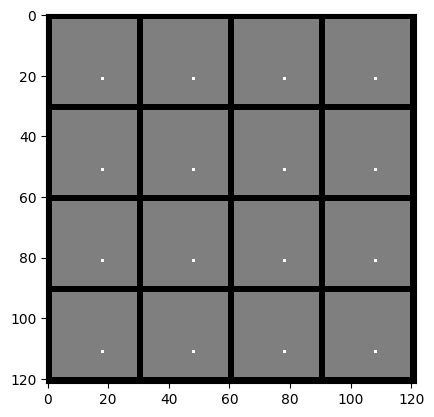

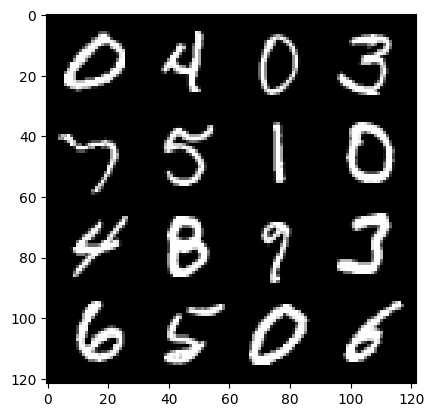

92: step 43500 / Gen loss: 3611615.5555169675 / disc_loss: 3157186.805885415


  0%|          | 0/469 [00:00<?, ?it/s]

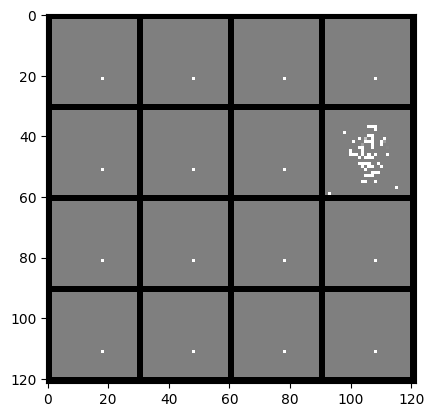

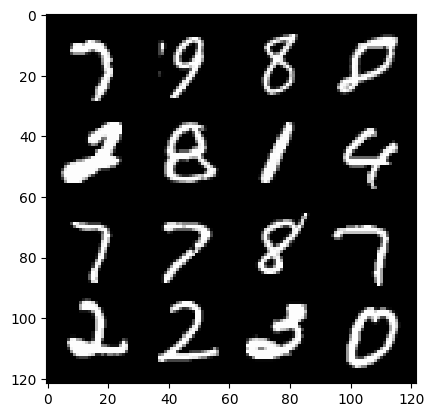

93: step 43800 / Gen loss: 1136607.4934375 / disc_loss: 8775000.840309242


  0%|          | 0/469 [00:00<?, ?it/s]

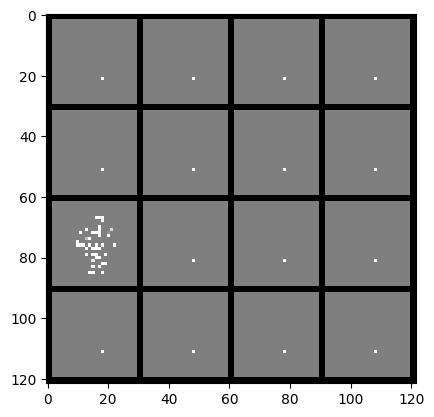

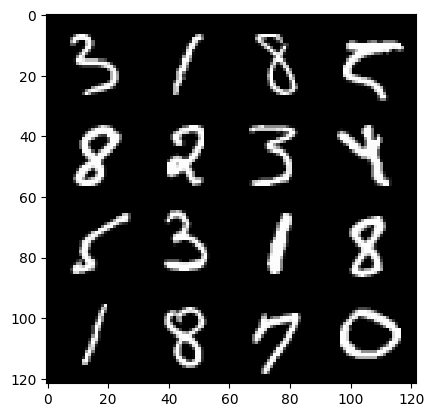

94: step 44100 / Gen loss: 2963366.9120312505 / disc_loss: 5677744.2548787445


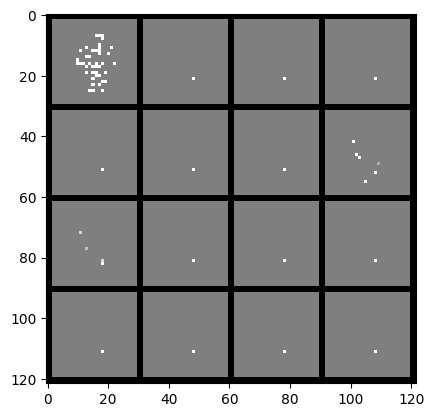

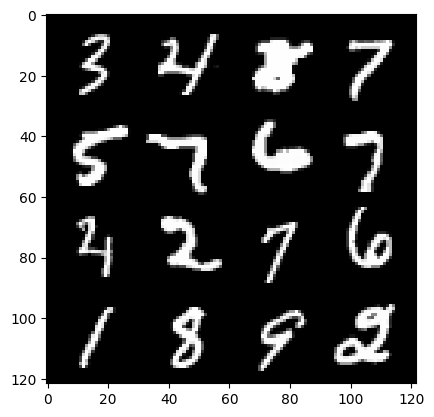

94: step 44400 / Gen loss: 4646892.63893392 / disc_loss: 3353466.452762452


  0%|          | 0/469 [00:00<?, ?it/s]

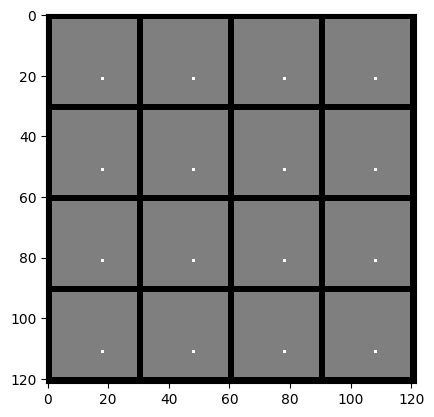

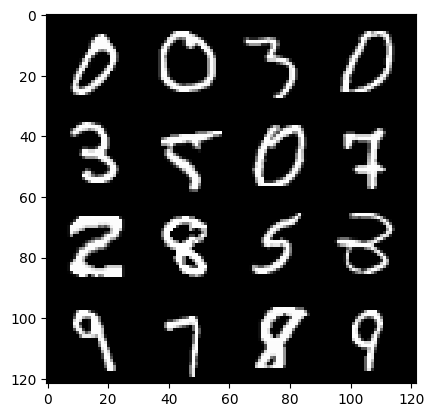

95: step 44700 / Gen loss: 2581236.7587207025 / disc_loss: 9914741.853541657


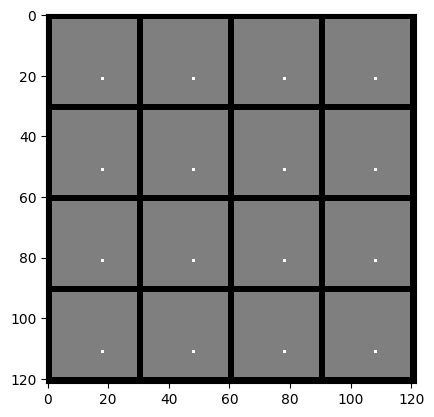

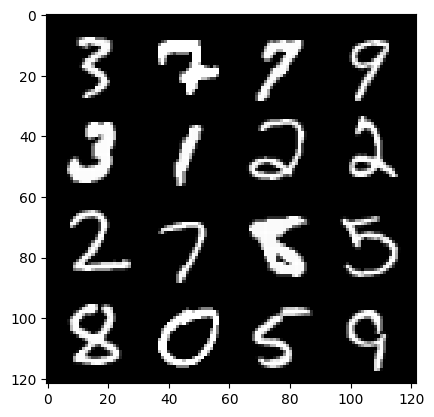

95: step 45000 / Gen loss: 3888867.802552083 / disc_loss: 10903540.29645833


  0%|          | 0/469 [00:00<?, ?it/s]

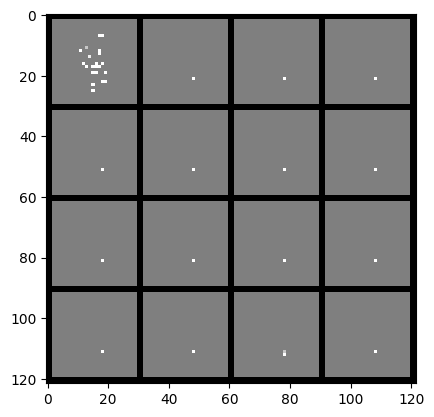

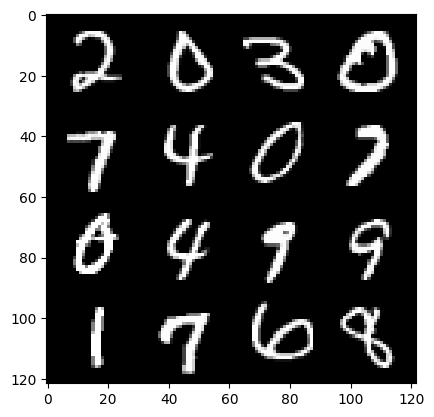

96: step 45300 / Gen loss: 7692331.655017906 / disc_loss: 4168353.196357422


  0%|          | 0/469 [00:00<?, ?it/s]

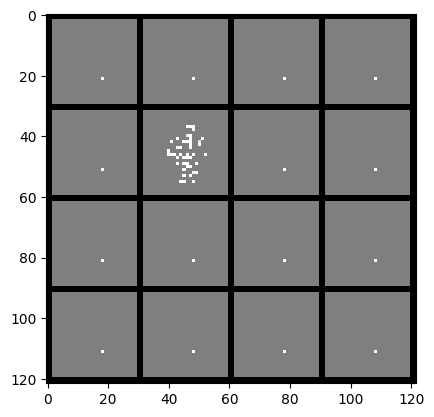

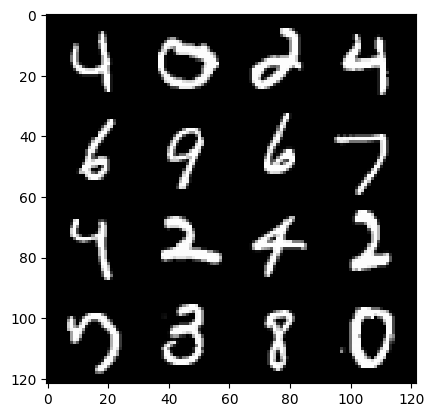

97: step 45600 / Gen loss: 698256.3803645833 / disc_loss: 11128906.226250002


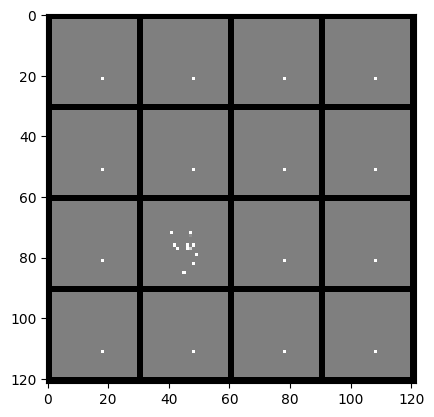

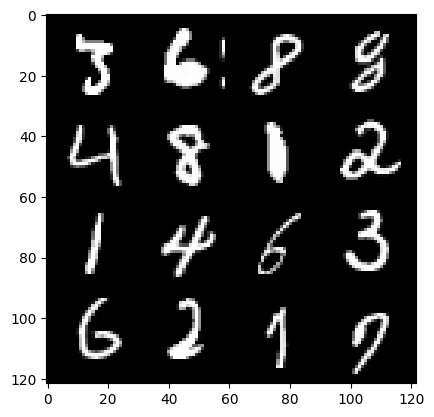

97: step 45900 / Gen loss: 6309446.646389973 / disc_loss: 4412199.25451823


  0%|          | 0/469 [00:00<?, ?it/s]

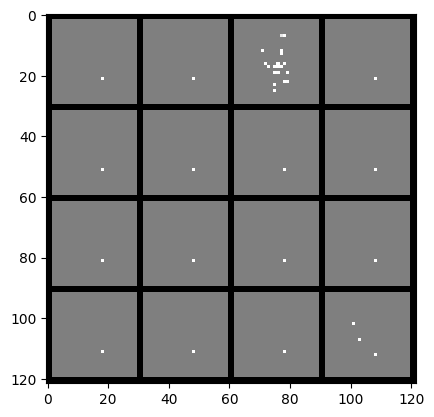

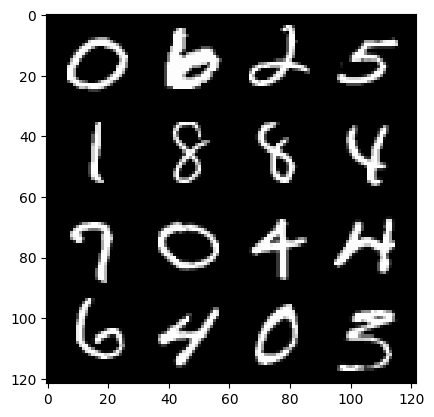

98: step 46200 / Gen loss: 3444641.079923502 / disc_loss: 7671566.631987508


  0%|          | 0/469 [00:00<?, ?it/s]

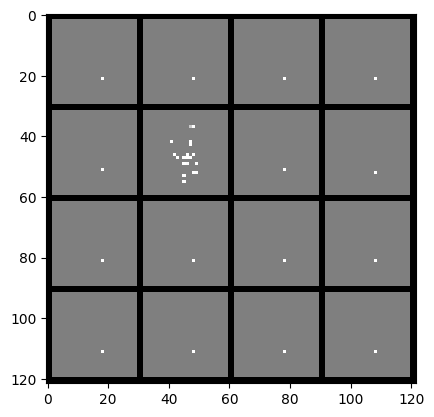

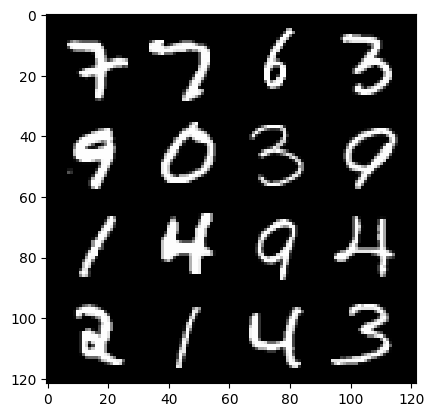

99: step 46500 / Gen loss: 5476062.273079839 / disc_loss: 5699315.187252604


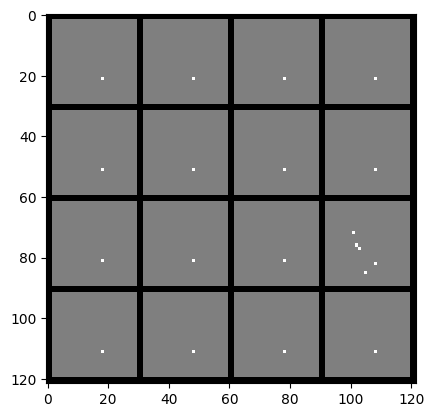

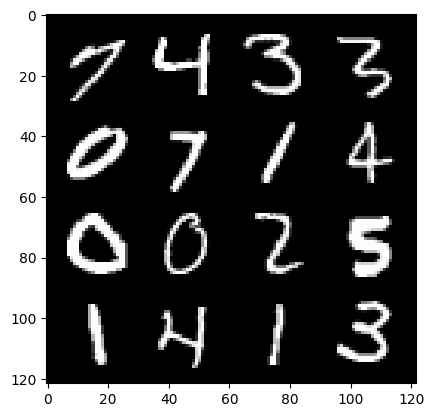

99: step 46800 / Gen loss: 319005.4683292643 / disc_loss: 12610916.34822918


  0%|          | 0/469 [00:00<?, ?it/s]

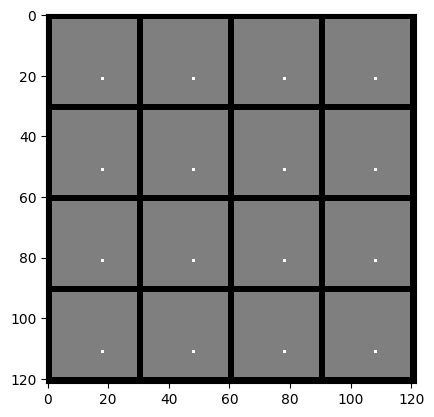

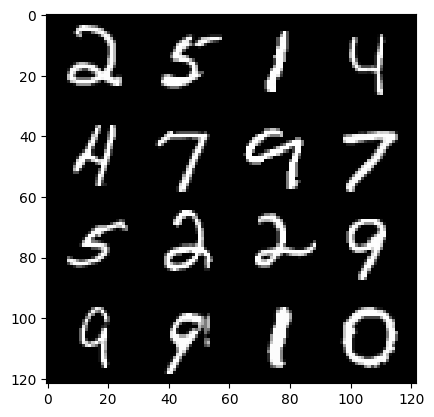

100: step 47100 / Gen loss: 6861854.559427086 / disc_loss: 7363037.270454165


  0%|          | 0/469 [00:00<?, ?it/s]

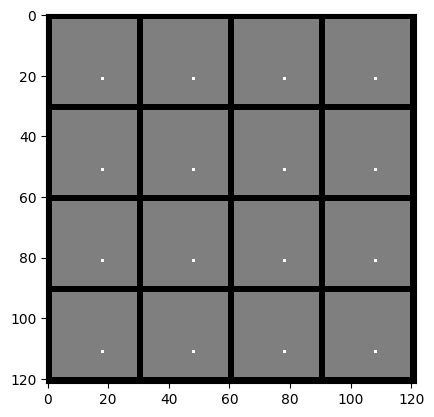

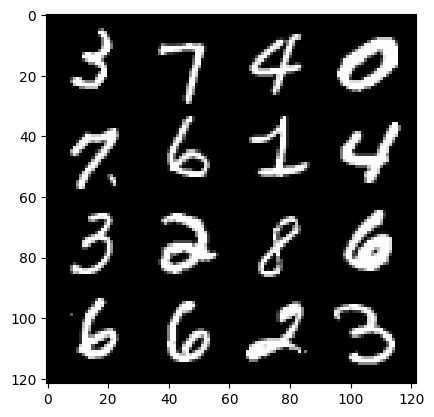

101: step 47400 / Gen loss: 6280578.498308106 / disc_loss: 8956288.626927081


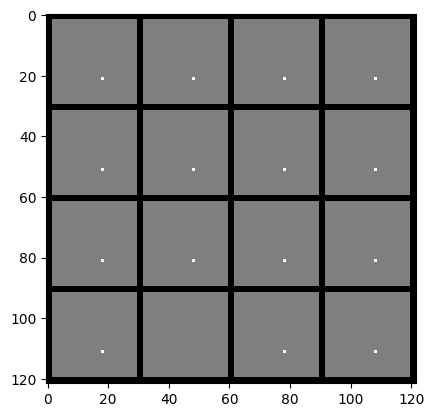

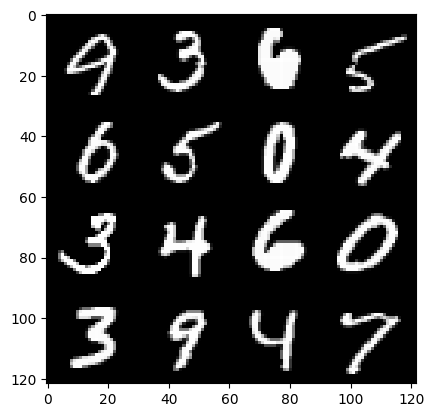

101: step 47700 / Gen loss: 1791083.055489298 / disc_loss: 9904201.38067709


  0%|          | 0/469 [00:00<?, ?it/s]

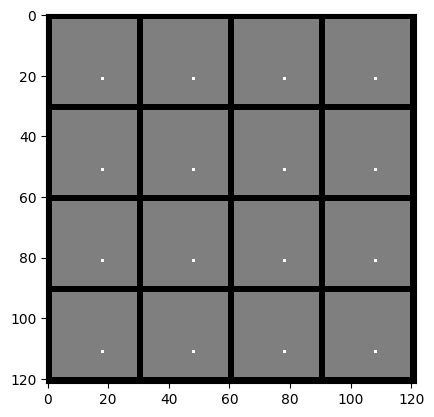

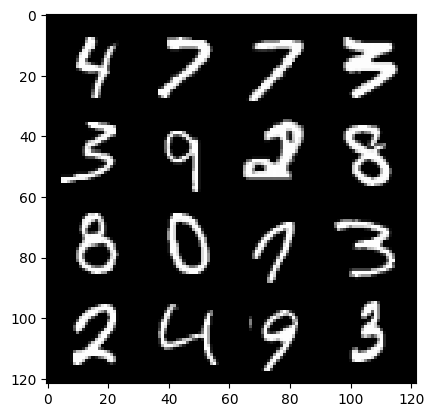

102: step 48000 / Gen loss: 2590228.813958332 / disc_loss: 4758638.688093468


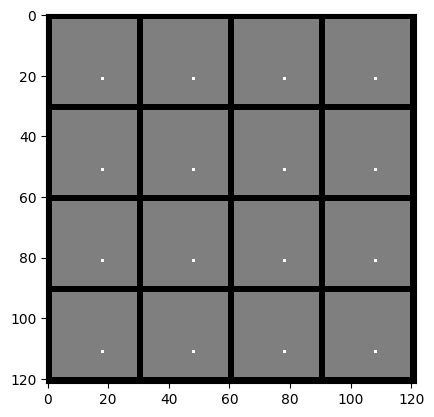

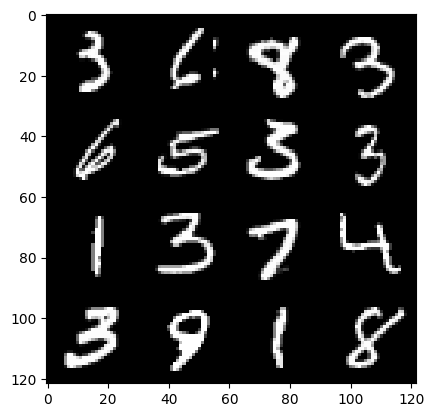

102: step 48300 / Gen loss: 4642461.803153484 / disc_loss: 5305059.443600258


  0%|          | 0/469 [00:00<?, ?it/s]

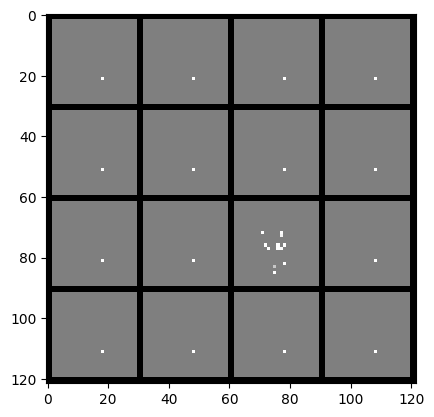

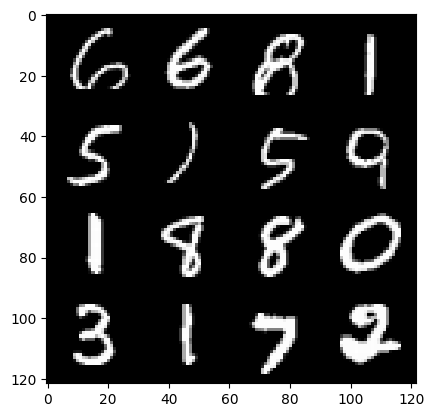

103: step 48600 / Gen loss: 3231503.0650585927 / disc_loss: 5655244.285690917


  0%|          | 0/469 [00:00<?, ?it/s]

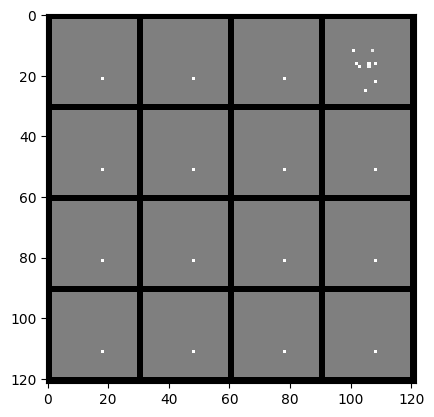

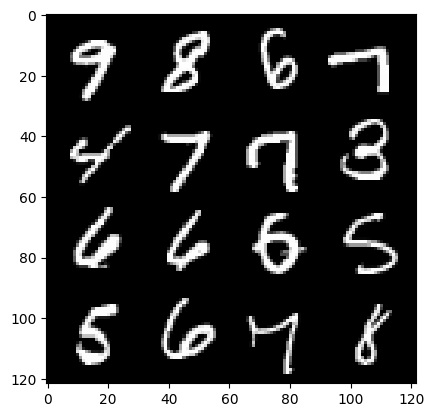

104: step 48900 / Gen loss: 899979.1466666661 / disc_loss: 8452335.717217611


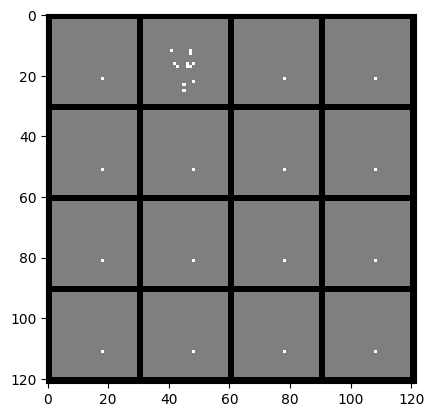

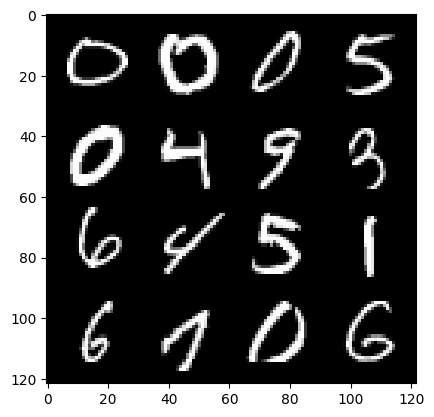

104: step 49200 / Gen loss: 8041385.639665932 / disc_loss: 6275707.350232748


  0%|          | 0/469 [00:00<?, ?it/s]

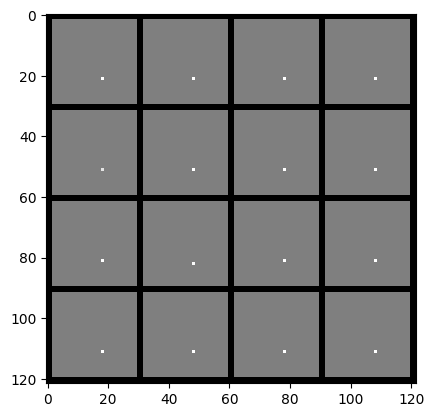

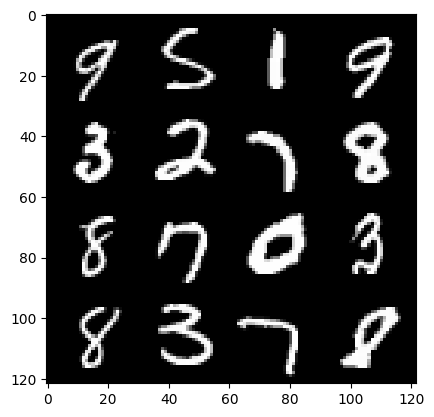

105: step 49500 / Gen loss: 3832094.4799804688 / disc_loss: 17779774.927539043


  0%|          | 0/469 [00:00<?, ?it/s]

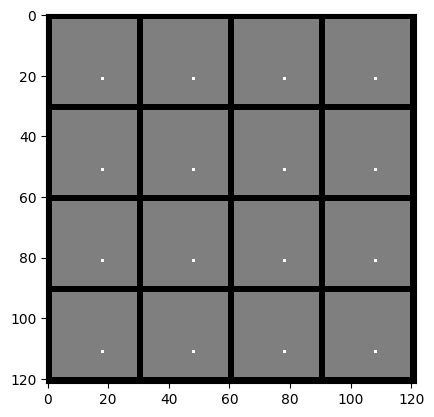

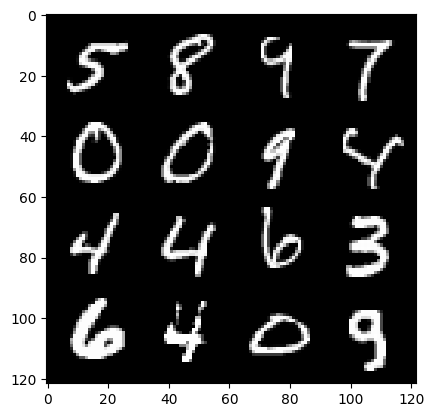

106: step 49800 / Gen loss: 9394196.16086589 / disc_loss: 19317848.54632162


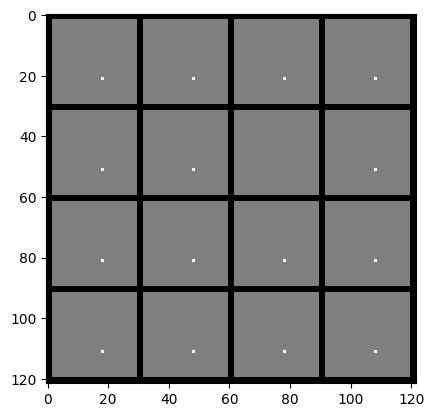

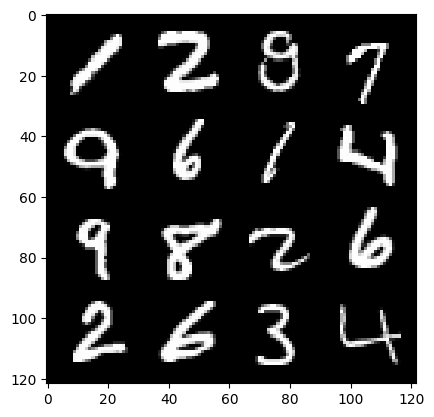

106: step 50100 / Gen loss: 9623572.907870285 / disc_loss: 13625617.27201986


  0%|          | 0/469 [00:00<?, ?it/s]

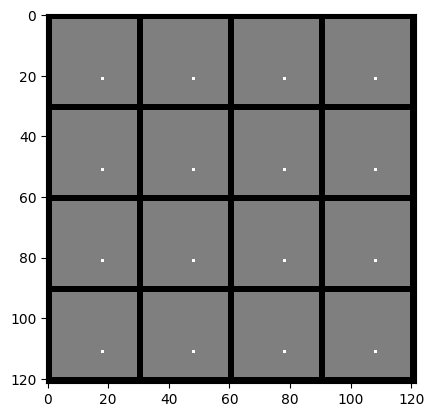

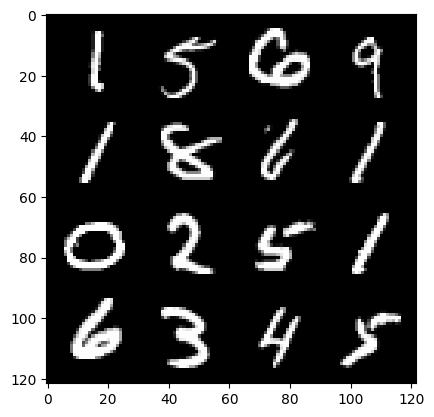

107: step 50400 / Gen loss: 14973364.504891148 / disc_loss: 10472663.887047518


  0%|          | 0/469 [00:00<?, ?it/s]

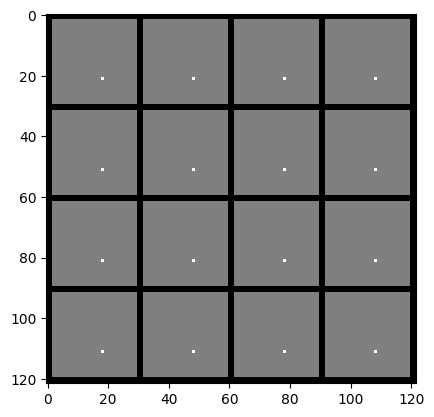

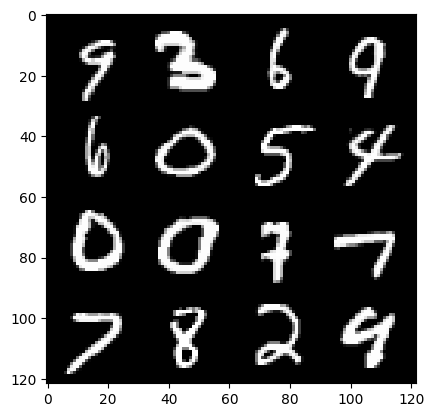

108: step 50700 / Gen loss: 3384.1703645833336 / disc_loss: 29321133.896468088


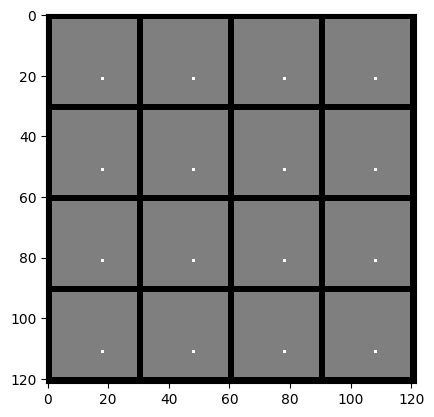

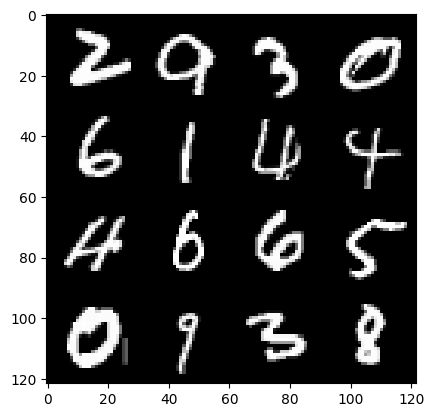

108: step 51000 / Gen loss: 17477142.600833338 / disc_loss: 3402384.160807292


  0%|          | 0/469 [00:00<?, ?it/s]

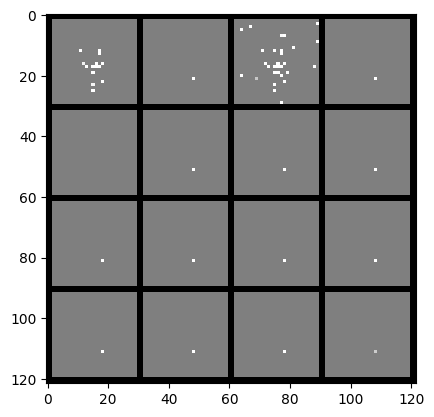

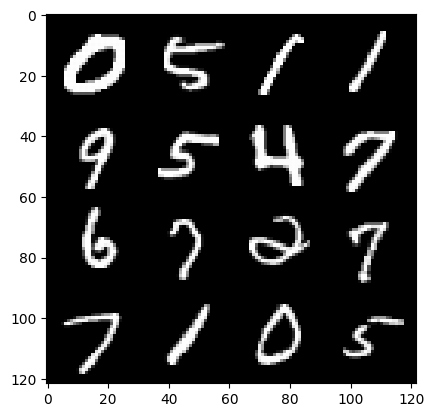

109: step 51300 / Gen loss: 0.0 / disc_loss: 35066850.339999996


  0%|          | 0/469 [00:00<?, ?it/s]

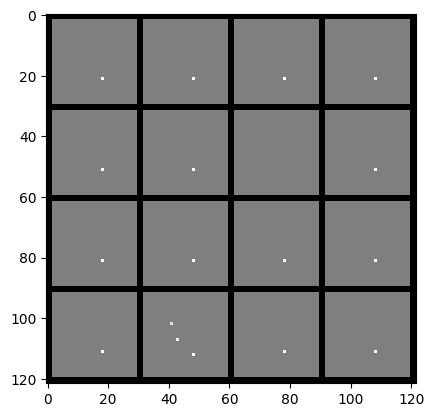

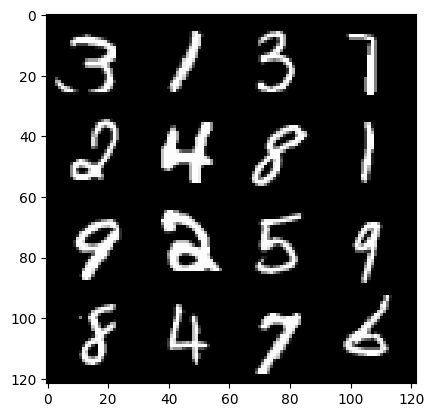

110: step 51600 / Gen loss: 18290405.773906253 / disc_loss: 2615280.6676908378


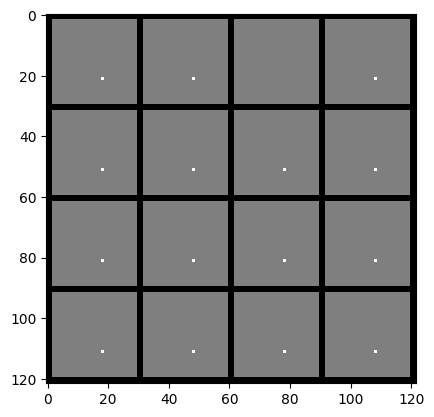

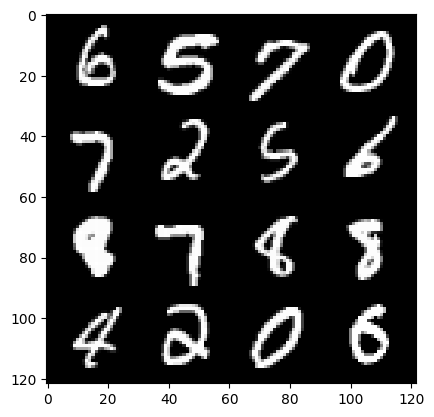

110: step 51900 / Gen loss: 0.0 / disc_loss: 26776943.466666672


  0%|          | 0/469 [00:00<?, ?it/s]

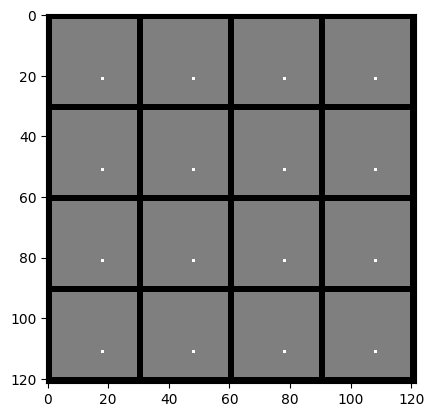

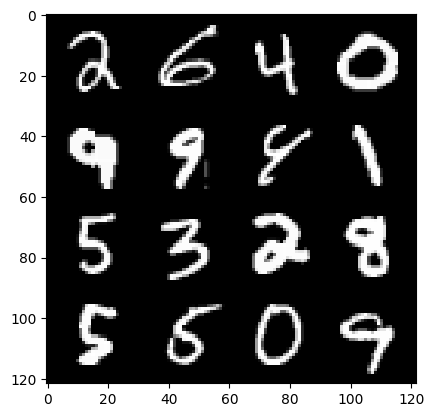

111: step 52200 / Gen loss: 12526993.191663 / disc_loss: 5170415.92395457


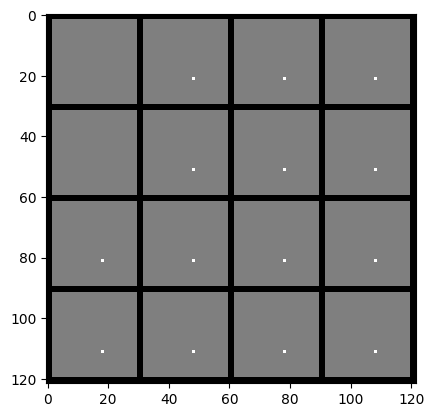

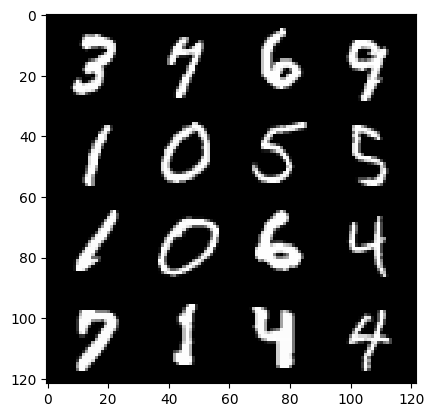

111: step 52500 / Gen loss: 2355898.93319987 / disc_loss: 7133073.14586421


  0%|          | 0/469 [00:00<?, ?it/s]

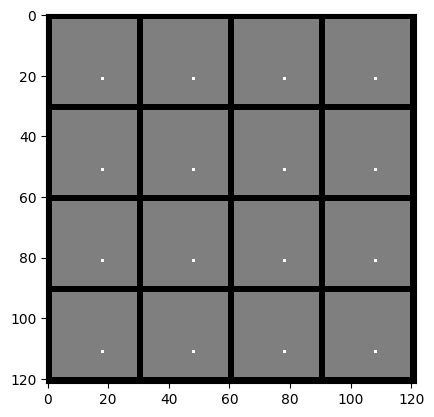

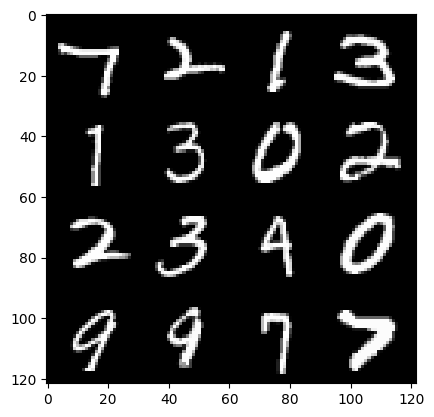

112: step 52800 / Gen loss: 3232288.8077156586 / disc_loss: 6440472.716015625


  0%|          | 0/469 [00:00<?, ?it/s]

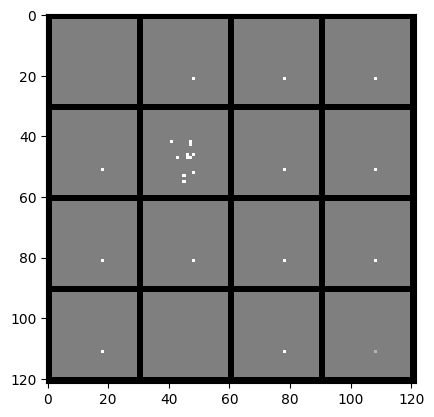

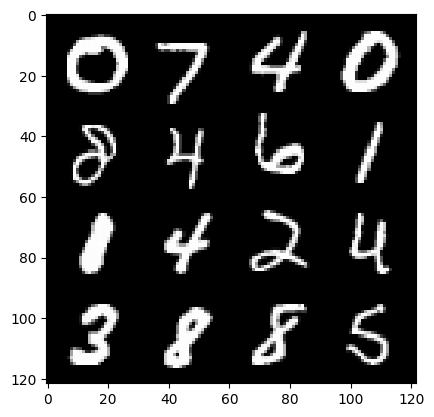

113: step 53100 / Gen loss: 1936056.0700826002 / disc_loss: 14191821.926421707


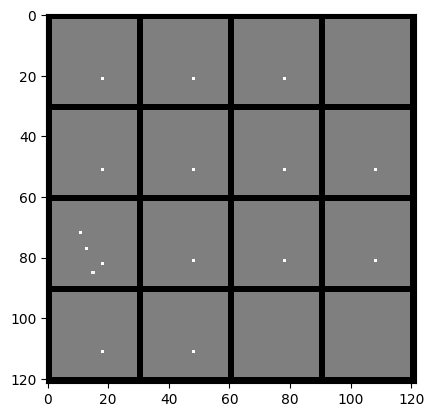

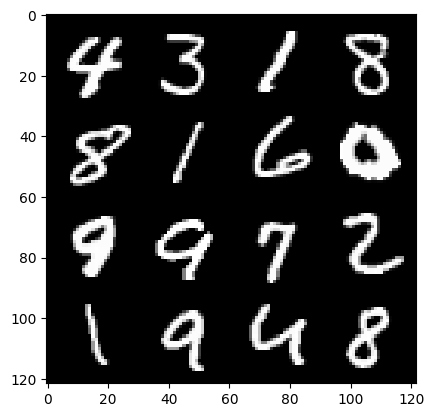

113: step 53400 / Gen loss: 10362646.180520836 / disc_loss: 4134389.9753645826


  0%|          | 0/469 [00:00<?, ?it/s]

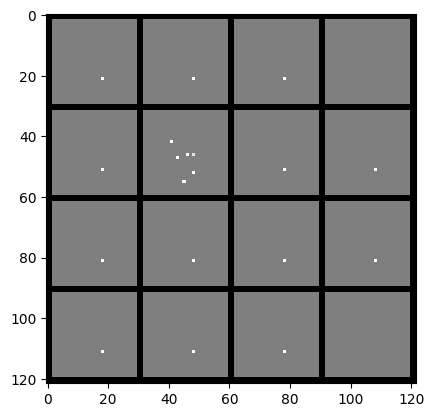

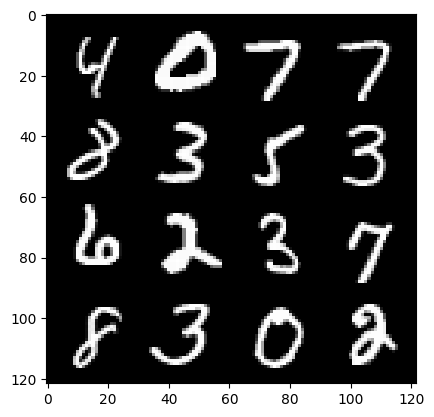

114: step 53700 / Gen loss: 2935119.506368816 / disc_loss: 9031618.298593746


  0%|          | 0/469 [00:00<?, ?it/s]

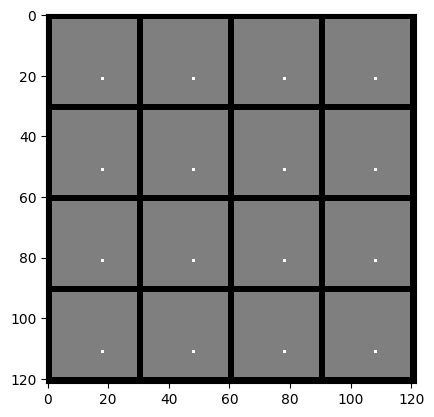

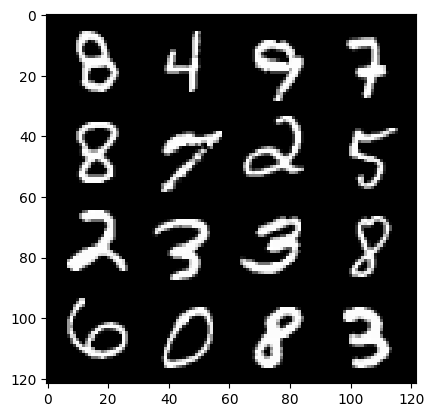

115: step 54000 / Gen loss: 8881109.364583334 / disc_loss: 7785148.189973961


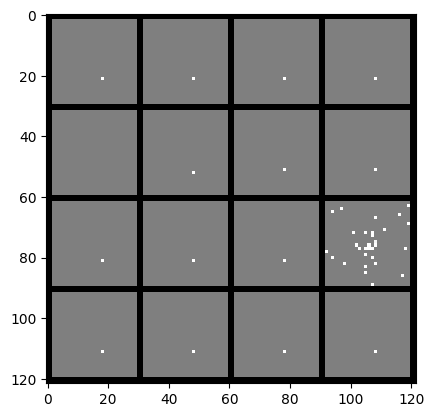

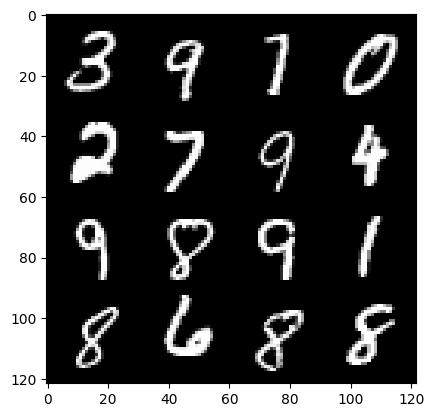

115: step 54300 / Gen loss: 2637290.4252473954 / disc_loss: 13754020.47735677


  0%|          | 0/469 [00:00<?, ?it/s]

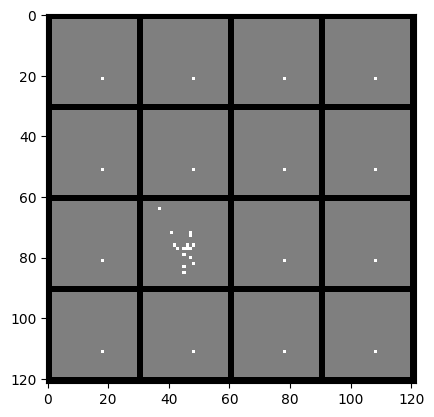

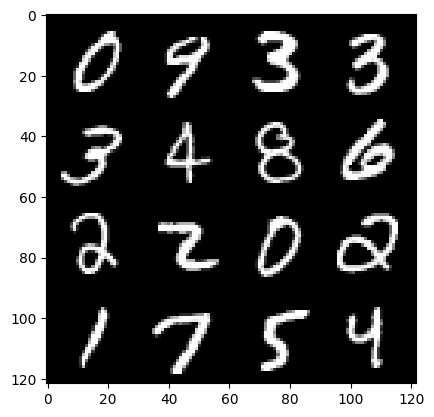

116: step 54600 / Gen loss: 7147130.476940304 / disc_loss: 9920249.27564778


  0%|          | 0/469 [00:00<?, ?it/s]

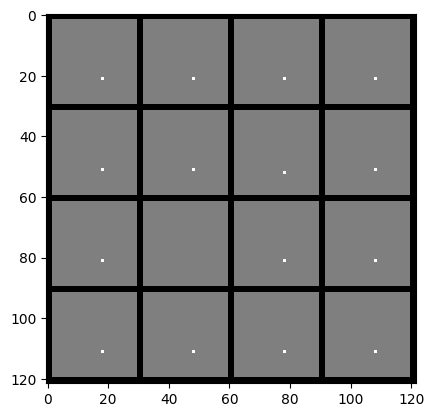

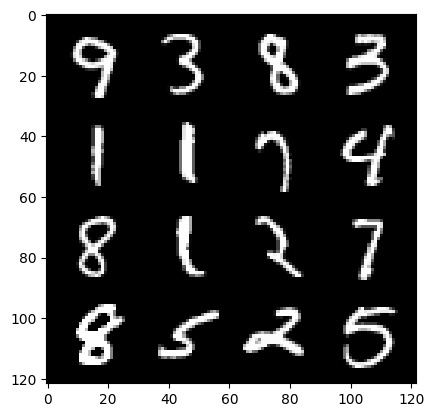

117: step 54900 / Gen loss: 3590014.6779264314 / disc_loss: 19703380.234062493


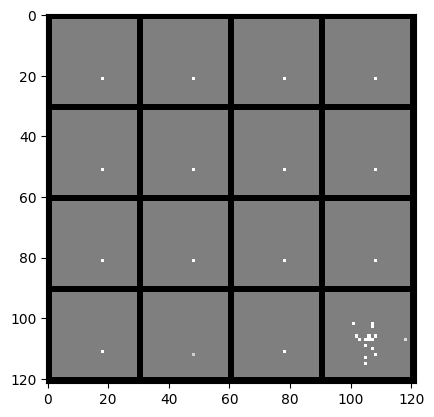

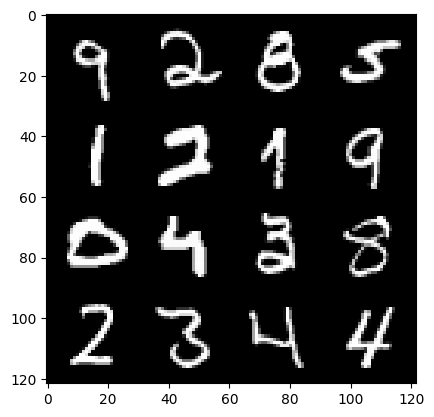

117: step 55200 / Gen loss: 7327772.485911456 / disc_loss: 16932073.015833333


  0%|          | 0/469 [00:00<?, ?it/s]

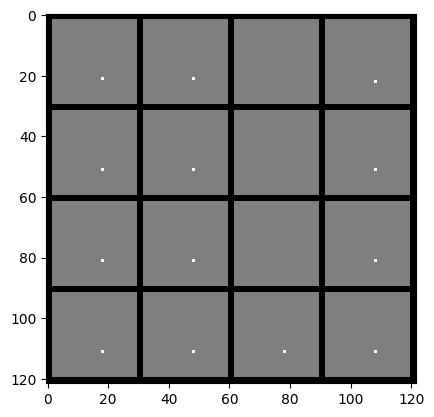

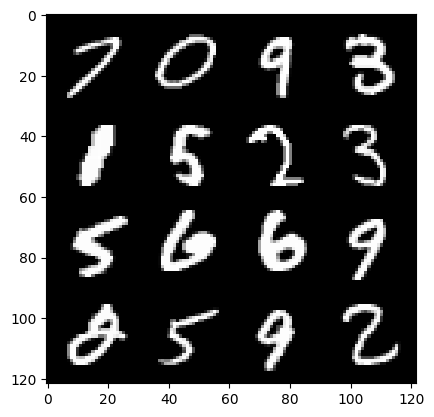

118: step 55500 / Gen loss: 11685930.739495443 / disc_loss: 6108368.734791668


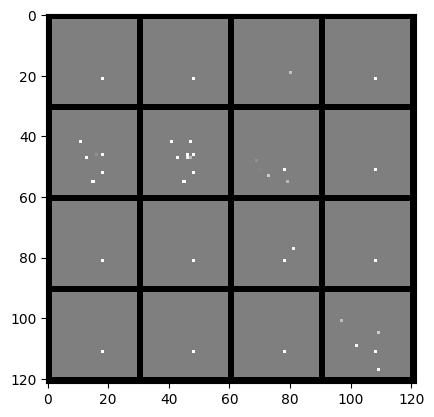

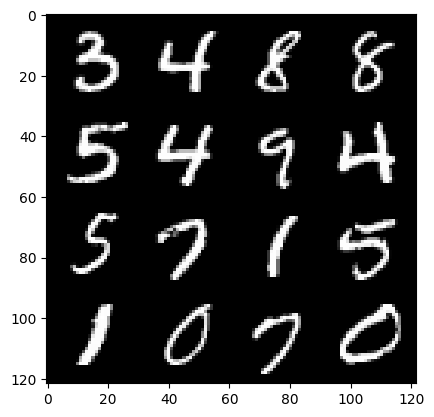

118: step 55800 / Gen loss: 4630551.098671875 / disc_loss: 9711207.840645546


  0%|          | 0/469 [00:00<?, ?it/s]

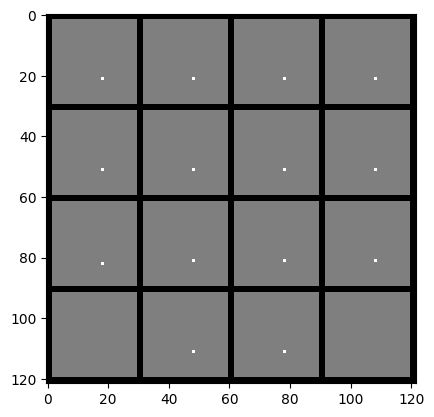

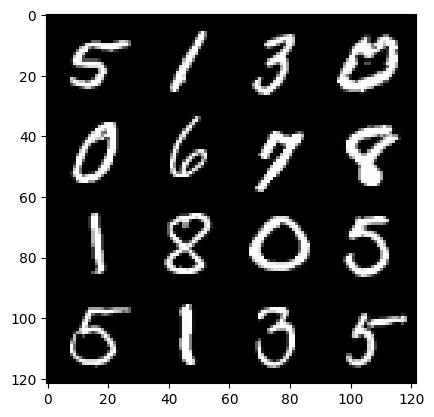

119: step 56100 / Gen loss: 3389571.3685416672 / disc_loss: 9401883.192354737


  0%|          | 0/469 [00:00<?, ?it/s]

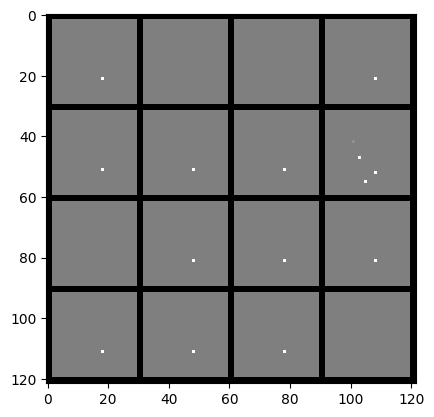

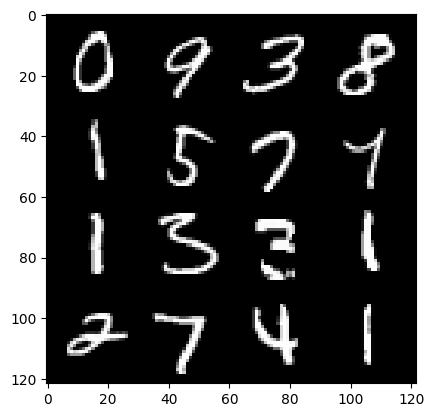

120: step 56400 / Gen loss: 7939266.172605797 / disc_loss: 9884341.193913108


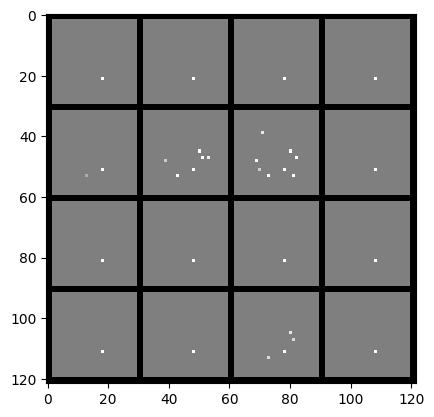

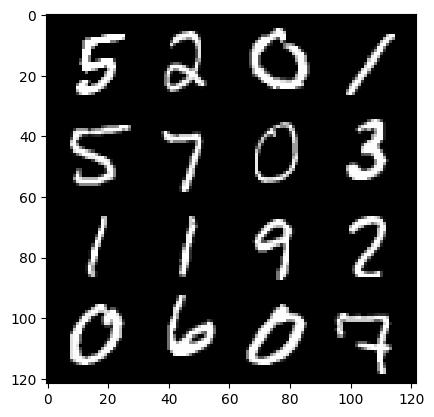

120: step 56700 / Gen loss: 13483310.07983074 / disc_loss: 18005175.351958834


  0%|          | 0/469 [00:00<?, ?it/s]

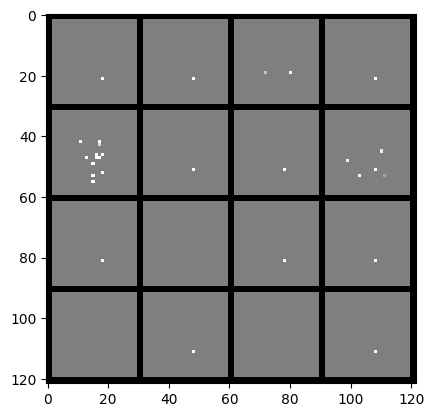

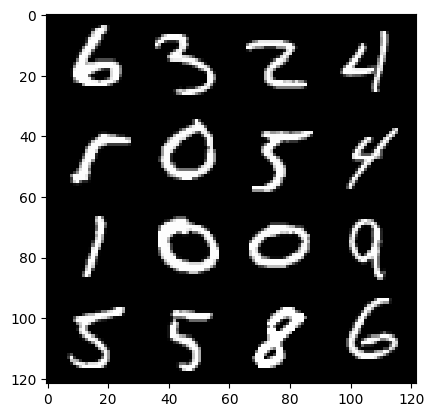

121: step 57000 / Gen loss: 3206294.598990885 / disc_loss: 37123056.5127507


  0%|          | 0/469 [00:00<?, ?it/s]

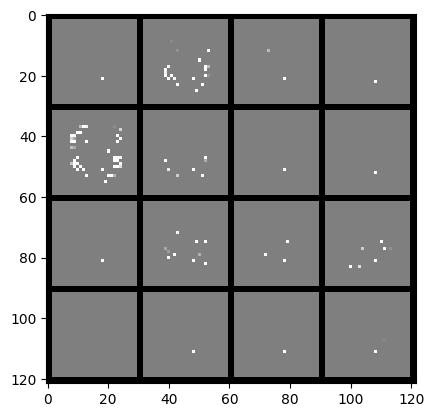

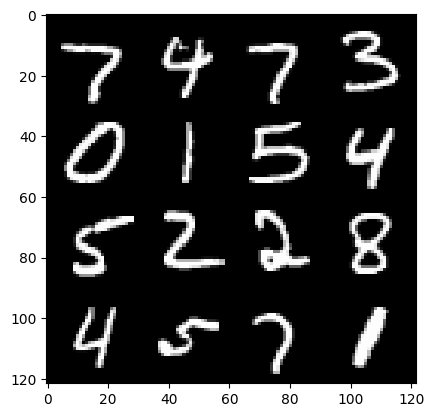

122: step 57300 / Gen loss: 24079481.644514978 / disc_loss: 9023994.878291018


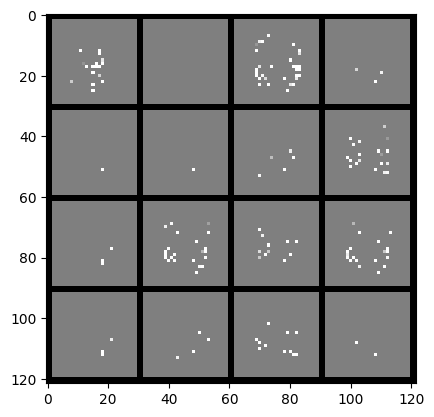

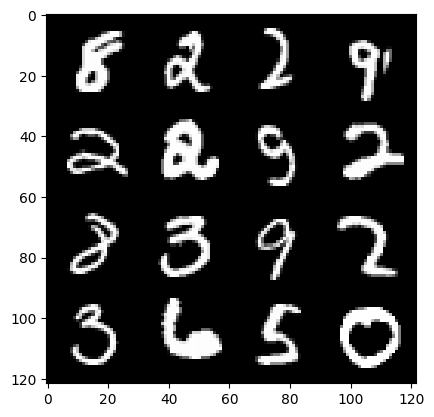

122: step 57600 / Gen loss: 0.0 / disc_loss: 55388963.0333333


  0%|          | 0/469 [00:00<?, ?it/s]

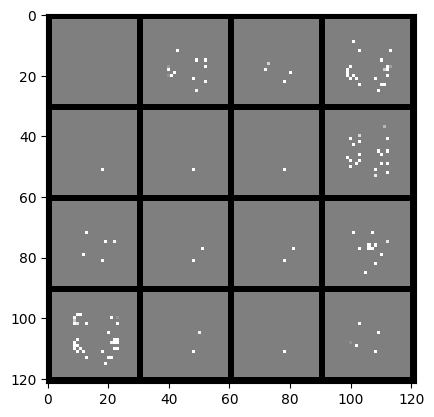

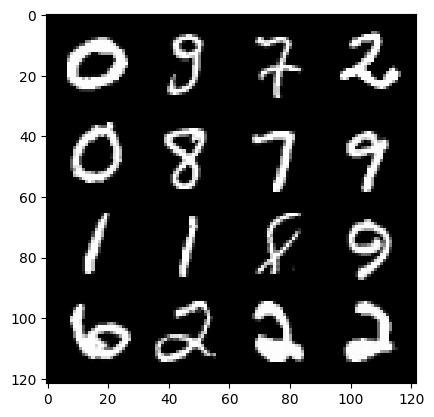

123: step 57900 / Gen loss: 33318259.99481772 / disc_loss: 7056396.785957031


  0%|          | 0/469 [00:00<?, ?it/s]

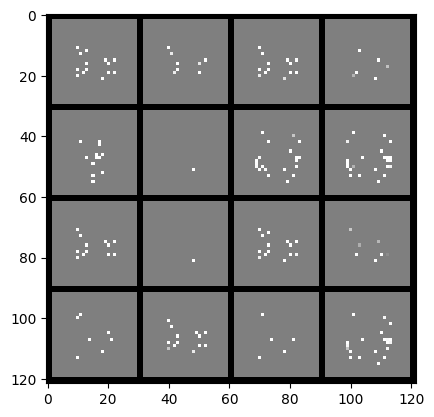

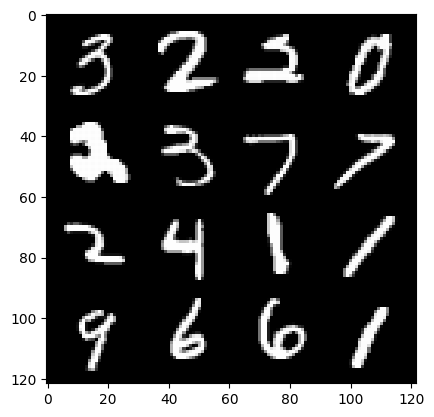

124: step 58200 / Gen loss: 0.0 / disc_loss: 66013234.41333334


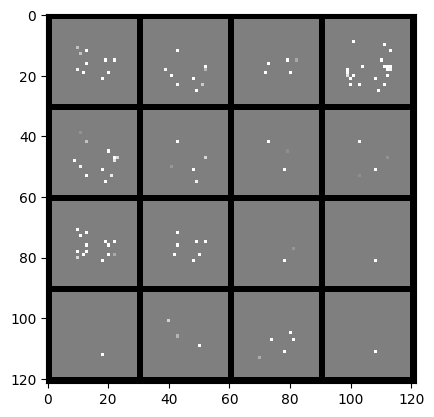

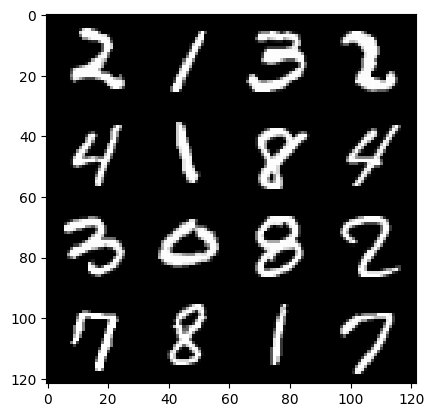

124: step 58500 / Gen loss: 34612439.80214315 / disc_loss: 4832943.227159832


  0%|          | 0/469 [00:00<?, ?it/s]

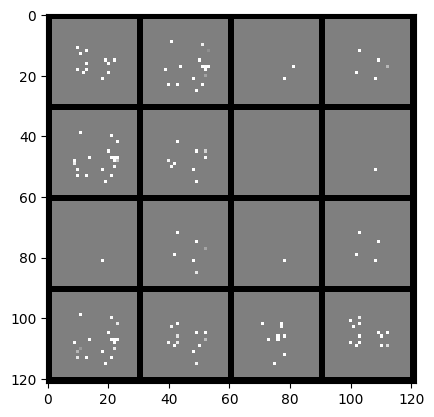

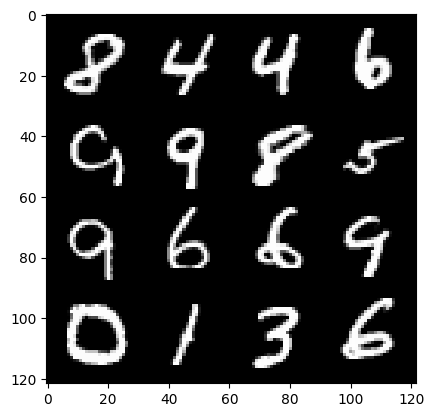

125: step 58800 / Gen loss: 0.0 / disc_loss: 64121054.553333364


  0%|          | 0/469 [00:00<?, ?it/s]

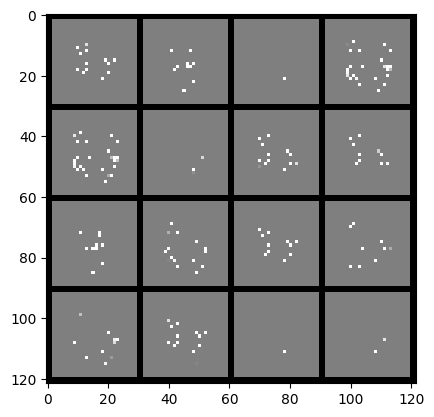

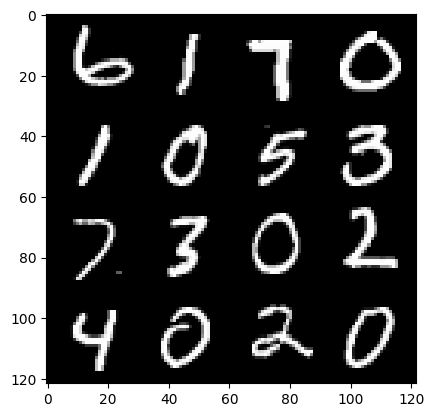

126: step 59100 / Gen loss: 38233948.485624984 / disc_loss: 11120742.765748695


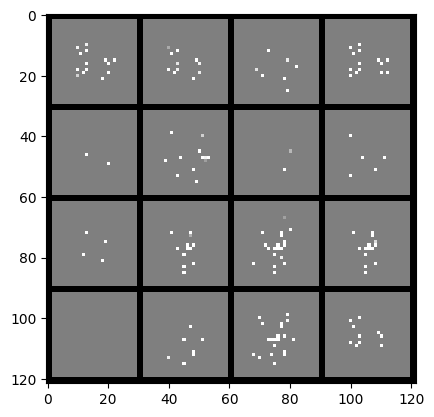

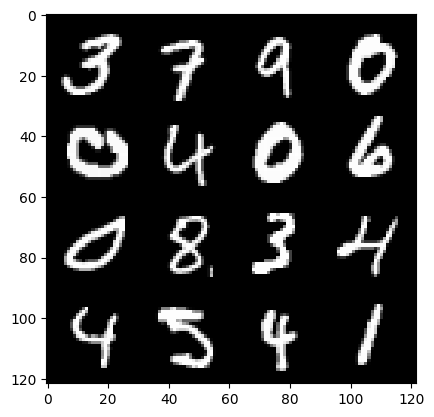

126: step 59400 / Gen loss: 2648550.2370833326 / disc_loss: 49963068.82229815


  0%|          | 0/469 [00:00<?, ?it/s]

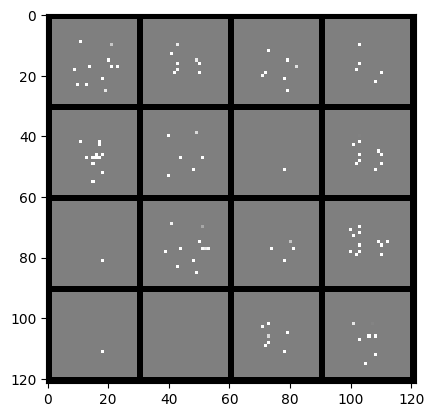

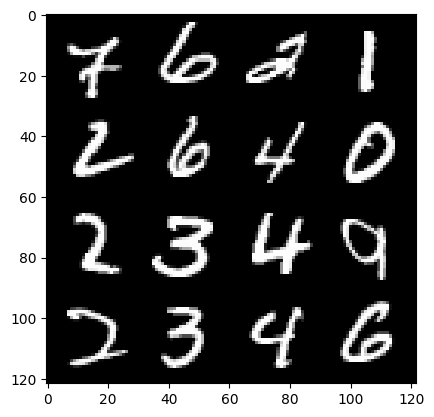

127: step 59700 / Gen loss: 7893502.657288409 / disc_loss: 40733050.67505958


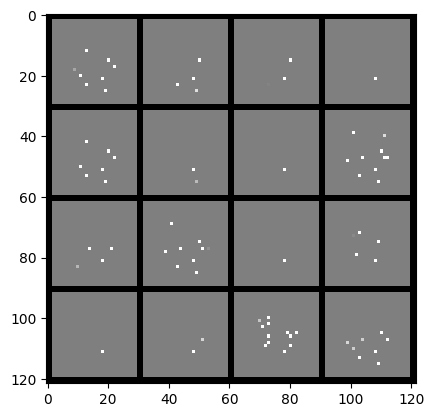

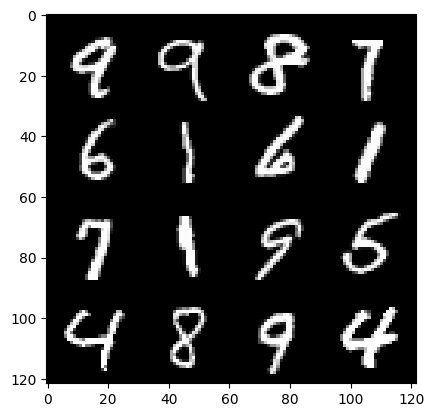

127: step 60000 / Gen loss: 39772770.244270794 / disc_loss: 10611421.385199789


  0%|          | 0/469 [00:00<?, ?it/s]

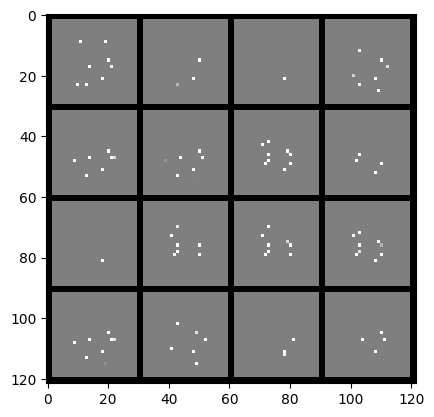

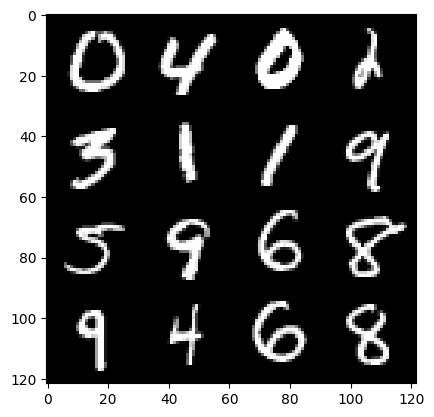

128: step 60300 / Gen loss: 0.0 / disc_loss: 68261690.68


  0%|          | 0/469 [00:00<?, ?it/s]

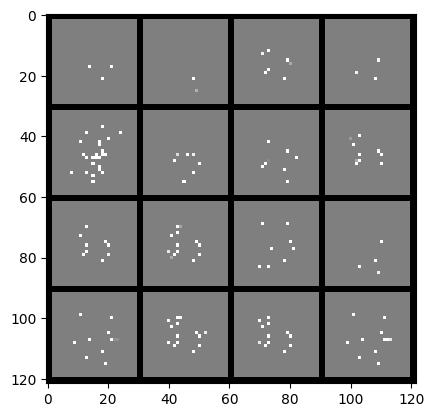

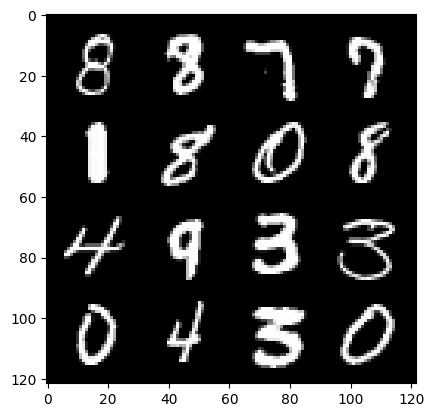

129: step 60600 / Gen loss: 21901781.40873289 / disc_loss: 8898682.020405278


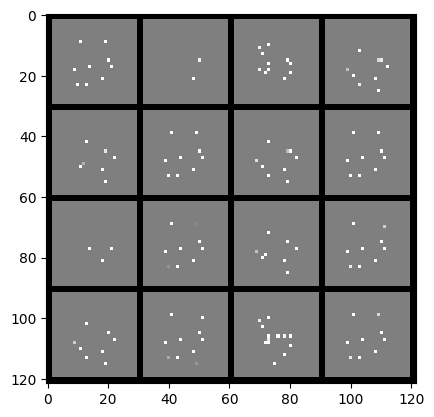

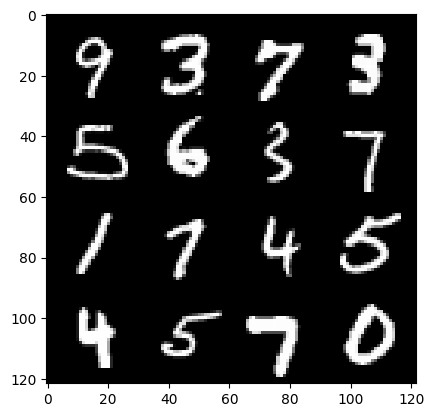

129: step 60900 / Gen loss: 490635.46286743163 / disc_loss: 16178949.02941406


  0%|          | 0/469 [00:00<?, ?it/s]

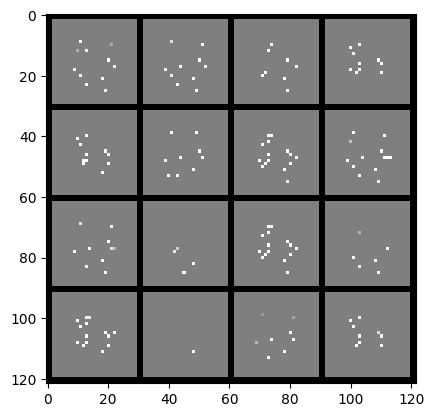

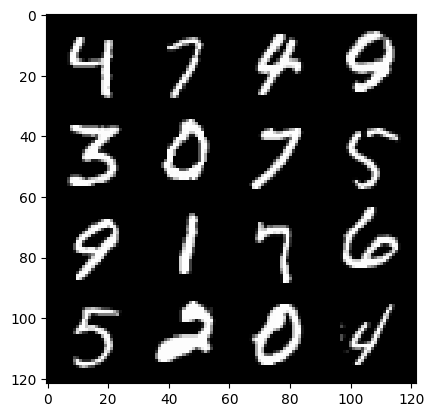

130: step 61200 / Gen loss: 10832250.613645831 / disc_loss: 11975032.660820713


  0%|          | 0/469 [00:00<?, ?it/s]

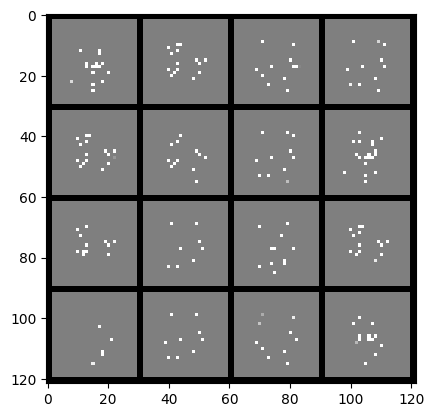

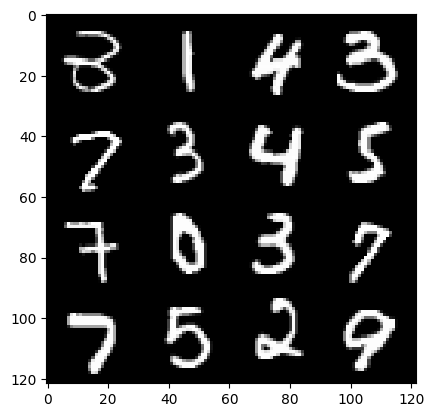

131: step 61500 / Gen loss: 6431727.645808919 / disc_loss: 23298808.715729162


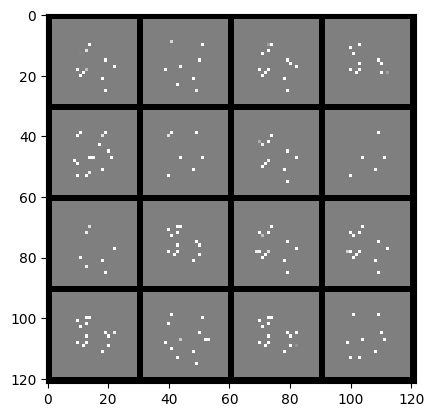

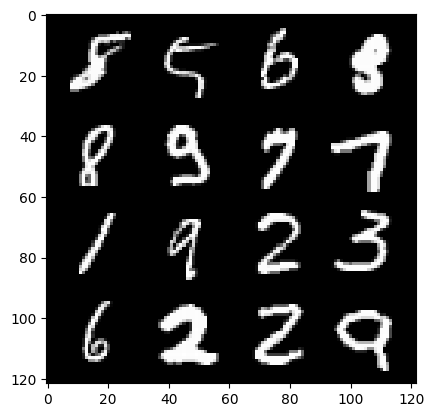

131: step 61800 / Gen loss: 7380869.066666667 / disc_loss: 24978780.21872394


  0%|          | 0/469 [00:00<?, ?it/s]

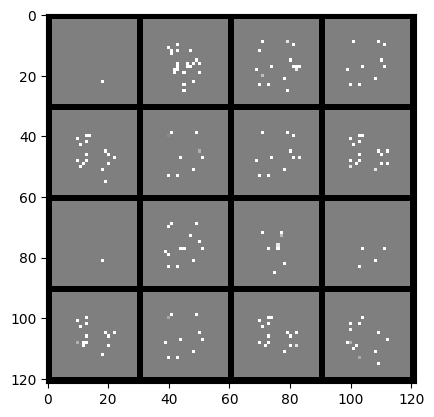

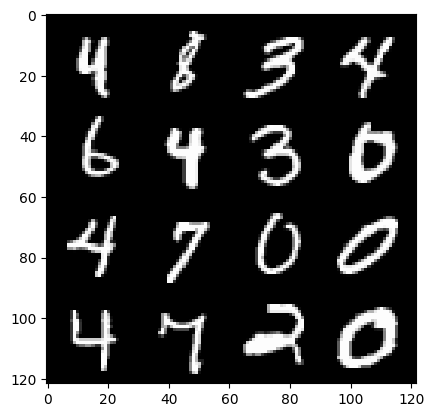

132: step 62100 / Gen loss: 18862128.405484 / disc_loss: 9827832.495775552


  0%|          | 0/469 [00:00<?, ?it/s]

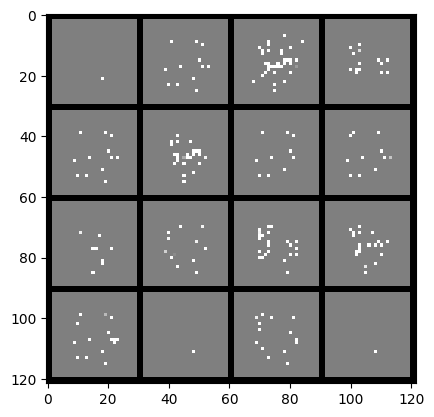

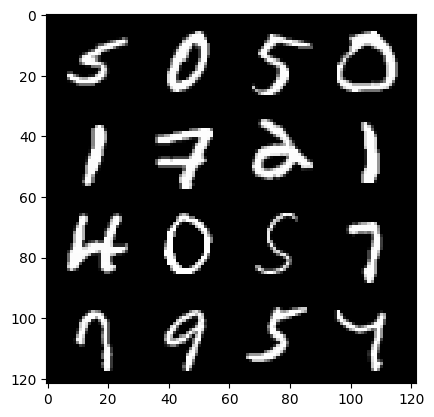

133: step 62400 / Gen loss: 2467402.1367057296 / disc_loss: 32553504.56877951


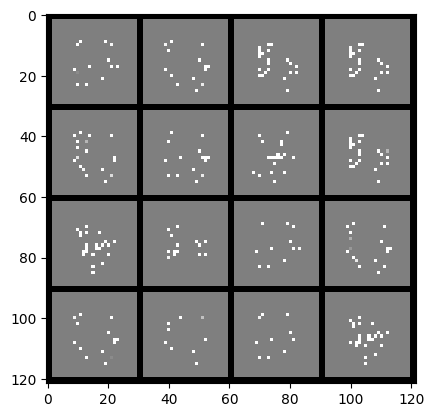

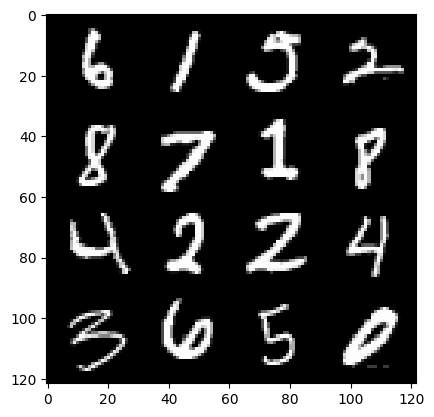

133: step 62700 / Gen loss: 20803555.3995573 / disc_loss: 18215009.176119797


  0%|          | 0/469 [00:00<?, ?it/s]

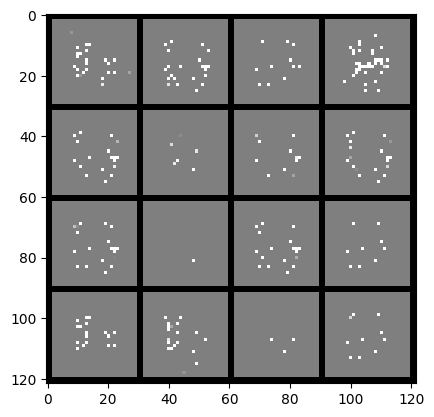

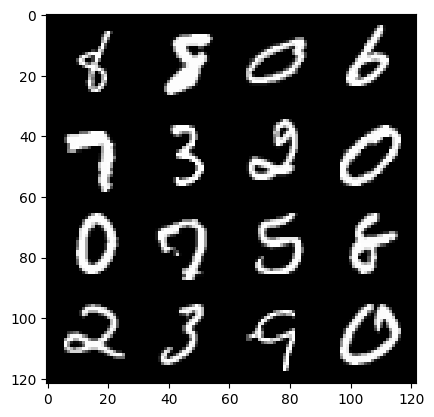

134: step 63000 / Gen loss: 12085737.365792241 / disc_loss: 18564933.471249994


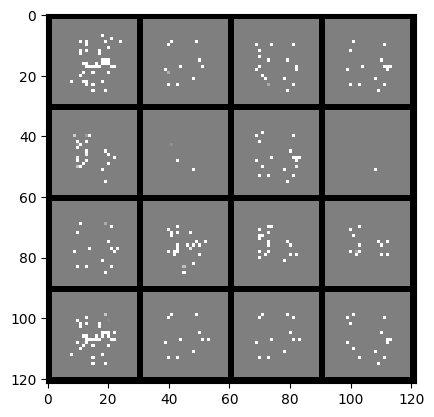

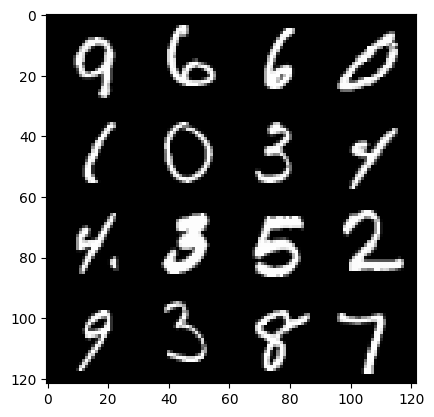

134: step 63300 / Gen loss: 2344313.322540283 / disc_loss: 24997463.876938492


  0%|          | 0/469 [00:00<?, ?it/s]

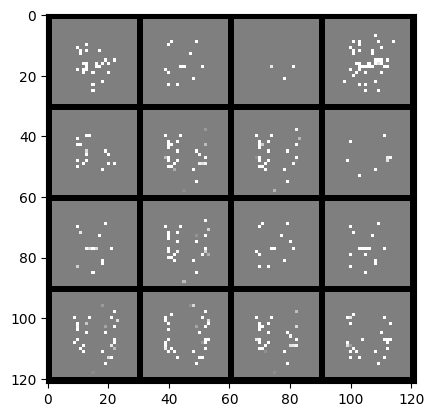

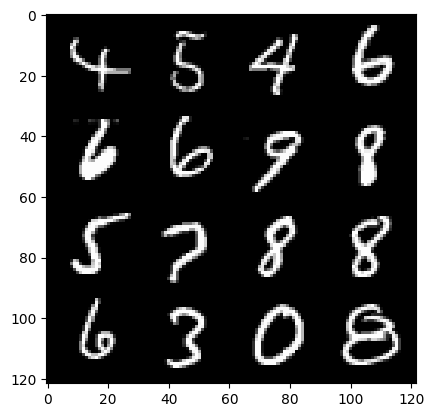

135: step 63600 / Gen loss: 19265424.87946613 / disc_loss: 5526099.975469793


  0%|          | 0/469 [00:00<?, ?it/s]

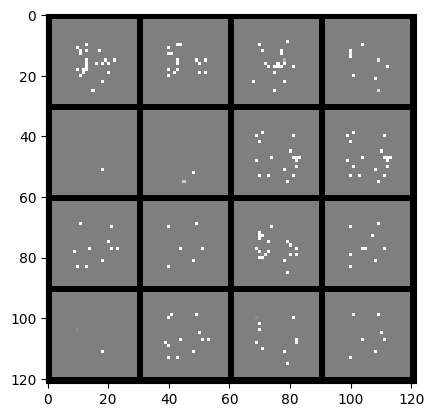

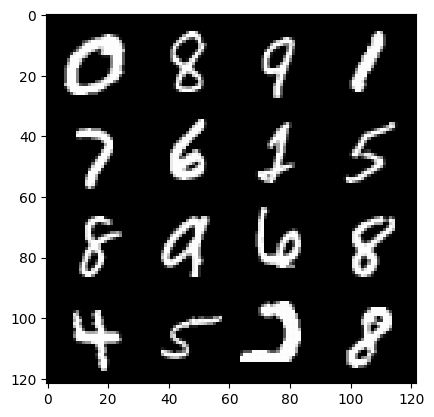

136: step 63900 / Gen loss: 0.0 / disc_loss: 42207316.15333333


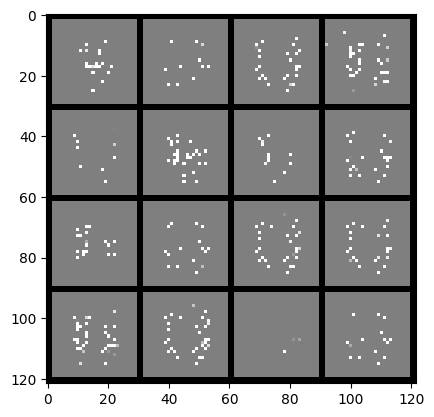

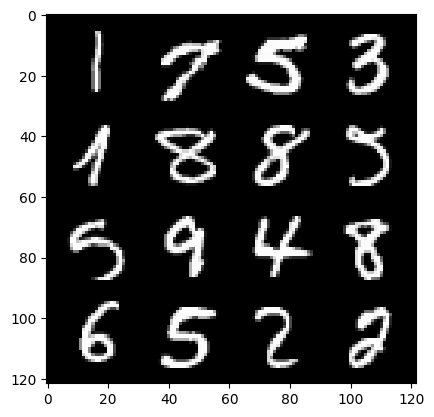

136: step 64200 / Gen loss: 27959657.5447396 / disc_loss: 3328313.5543912756


  0%|          | 0/469 [00:00<?, ?it/s]

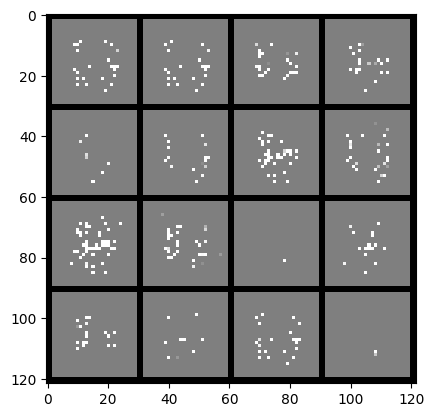

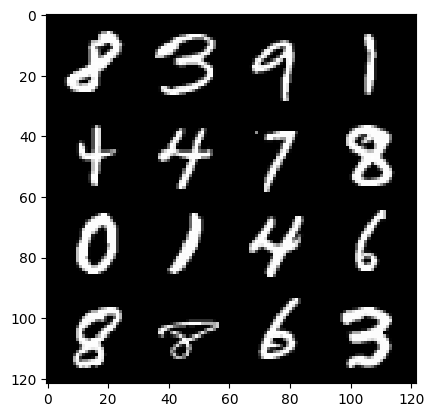

137: step 64500 / Gen loss: 0.0 / disc_loss: 54871678.55333334


  0%|          | 0/469 [00:00<?, ?it/s]

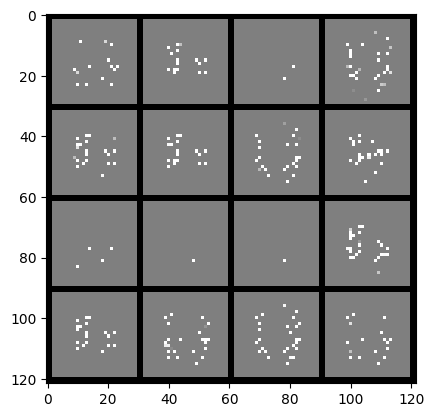

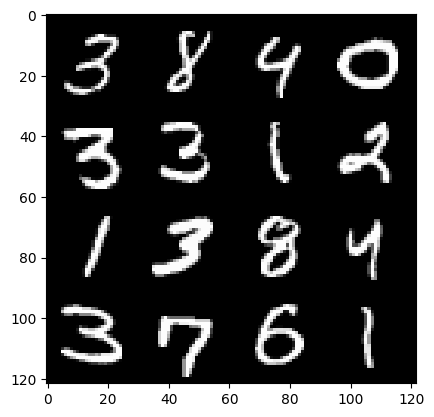

138: step 64800 / Gen loss: 32223133.689192716 / disc_loss: 10115509.371165363


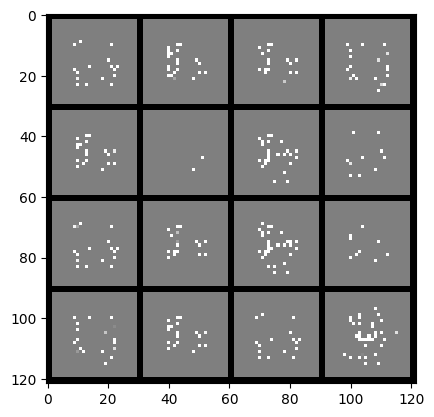

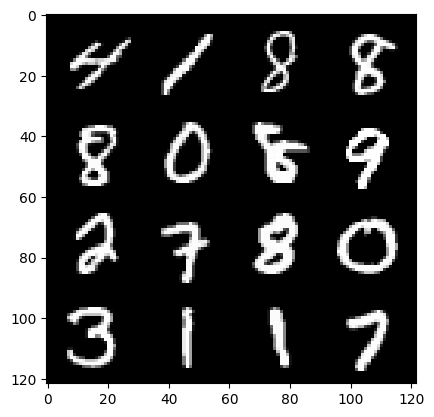

138: step 65100 / Gen loss: 6116737.473476564 / disc_loss: 33633882.54053071


  0%|          | 0/469 [00:00<?, ?it/s]

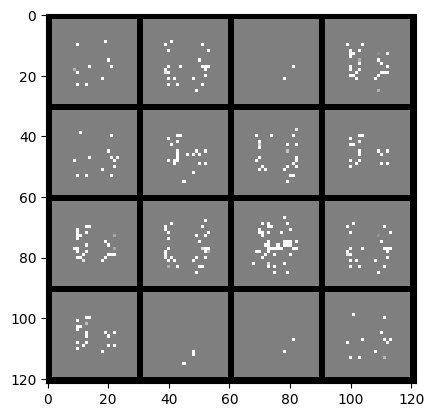

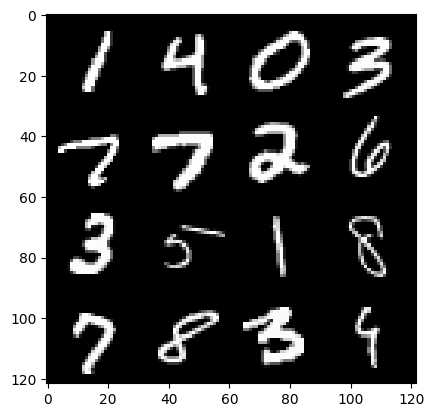

139: step 65400 / Gen loss: 5412432.111660461 / disc_loss: 30208782.881744776


  0%|          | 0/469 [00:00<?, ?it/s]

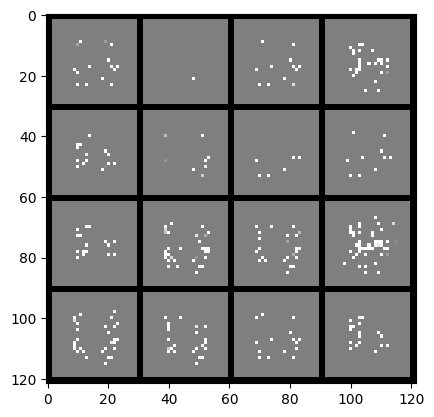

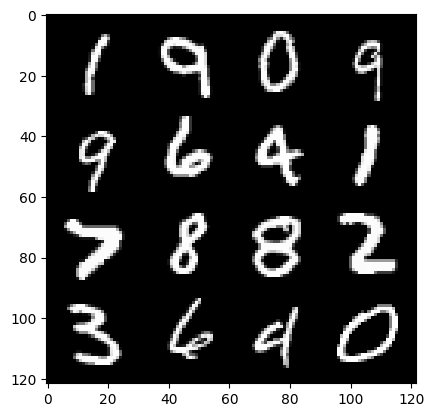

140: step 65700 / Gen loss: 13201666.130771486 / disc_loss: 18063812.712135408


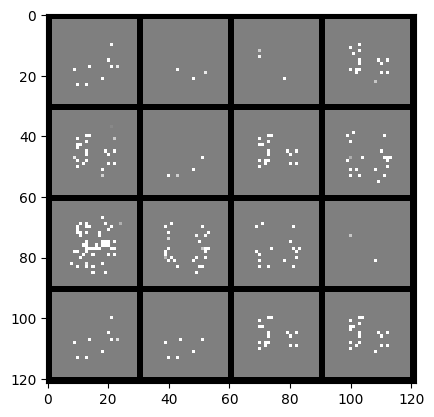

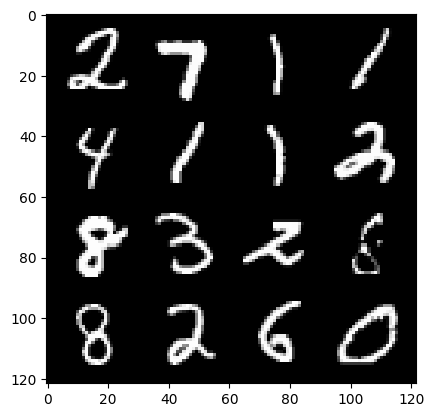

140: step 66000 / Gen loss: 4810691.177896805 / disc_loss: 6639800.874609374


  0%|          | 0/469 [00:00<?, ?it/s]

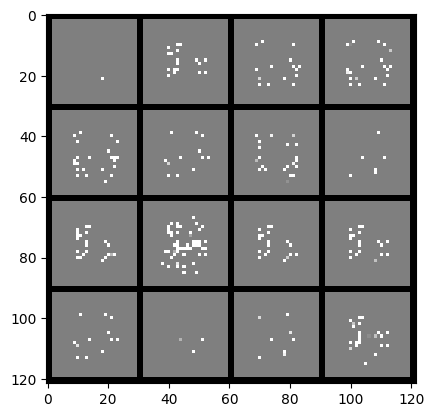

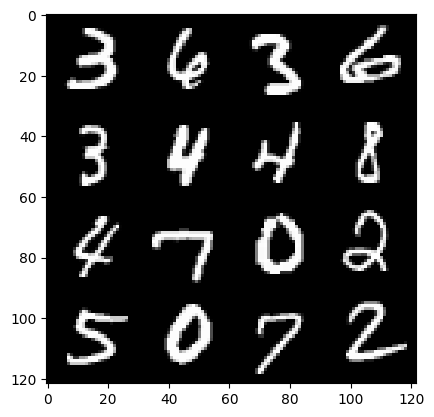

141: step 66300 / Gen loss: 6521058.449320475 / disc_loss: 8255143.373932286


  0%|          | 0/469 [00:00<?, ?it/s]

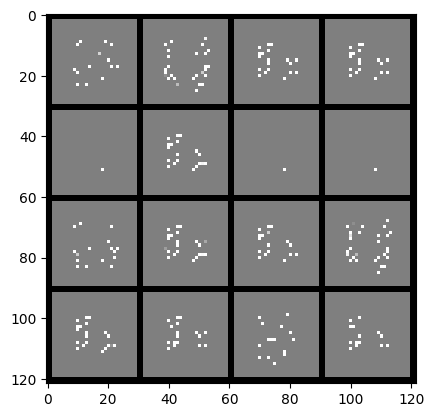

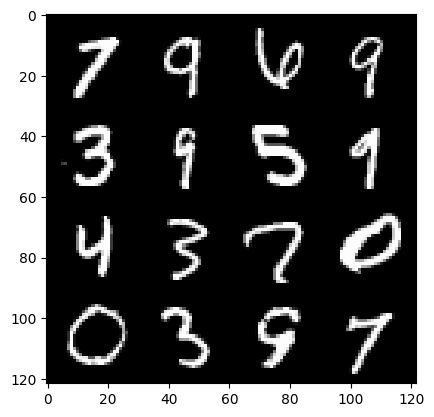

142: step 66600 / Gen loss: 3215745.013805338 / disc_loss: 14857096.972003583


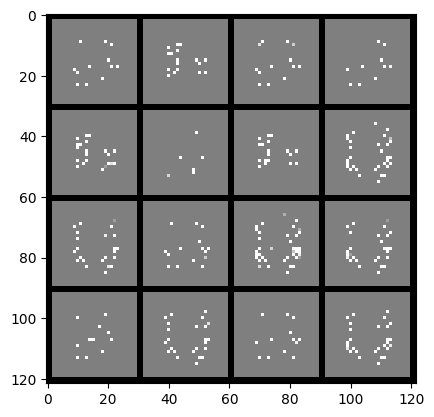

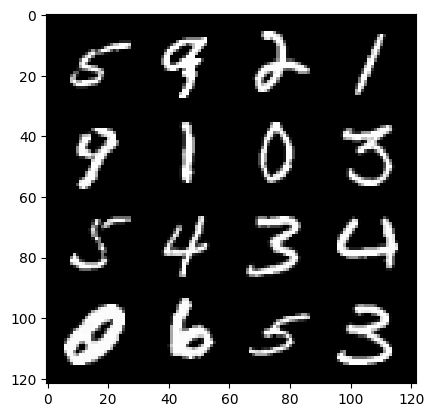

142: step 66900 / Gen loss: 10645603.350489605 / disc_loss: 31276735.838671885


  0%|          | 0/469 [00:00<?, ?it/s]

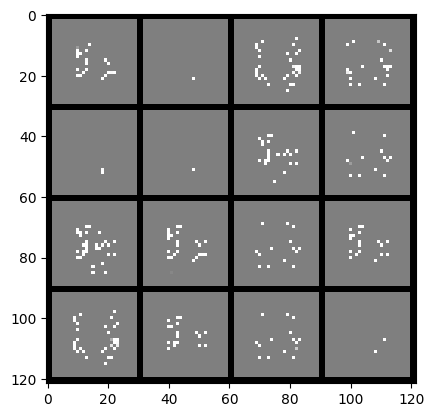

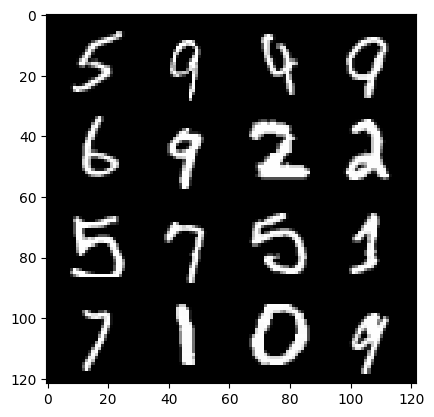

143: step 67200 / Gen loss: 16439672.033816729 / disc_loss: 48965070.1951367


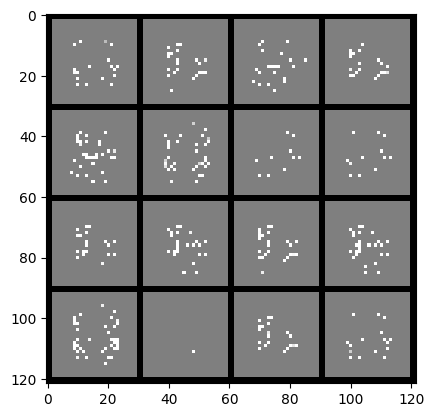

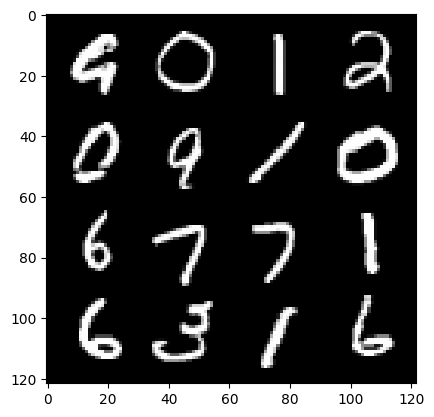

143: step 67500 / Gen loss: 28202305.410351563 / disc_loss: 30792678.136705723


  0%|          | 0/469 [00:00<?, ?it/s]

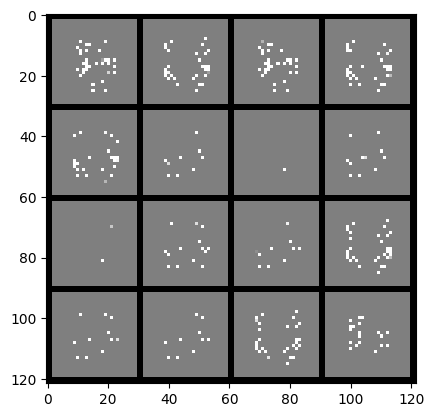

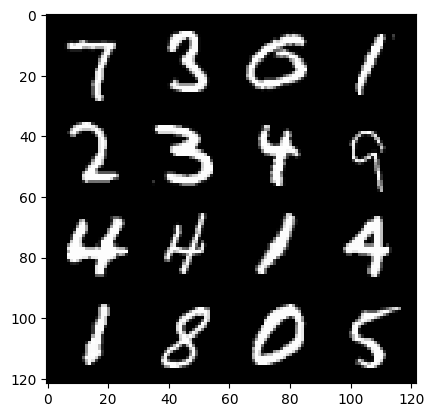

144: step 67800 / Gen loss: 14636968.068506265 / disc_loss: 31444923.002513


  0%|          | 0/469 [00:00<?, ?it/s]

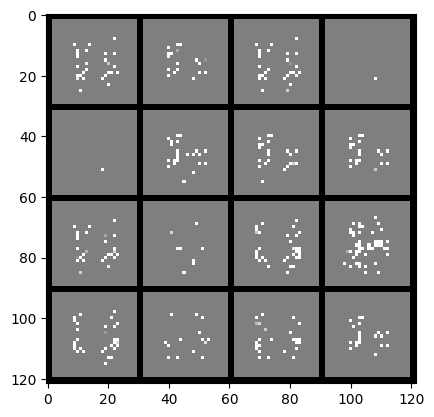

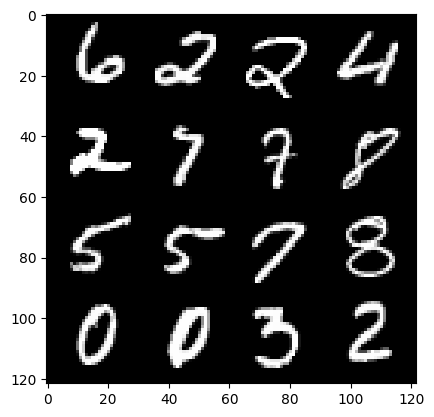

145: step 68100 / Gen loss: 5201694.020260111 / disc_loss: 25345050.756940123


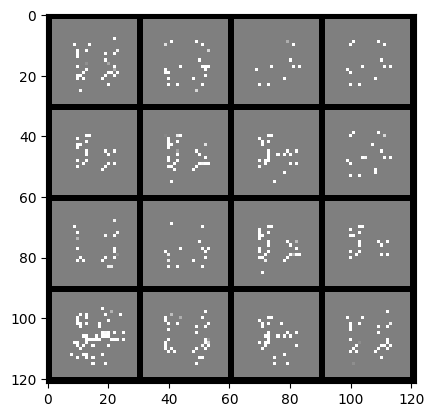

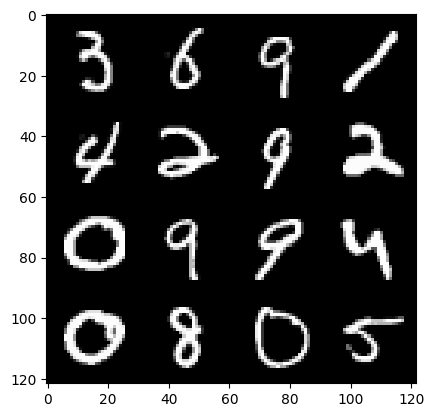

145: step 68400 / Gen loss: 12106920.636302084 / disc_loss: 27872100.826129563


  0%|          | 0/469 [00:00<?, ?it/s]

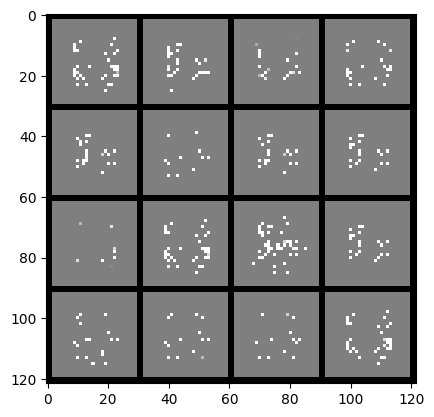

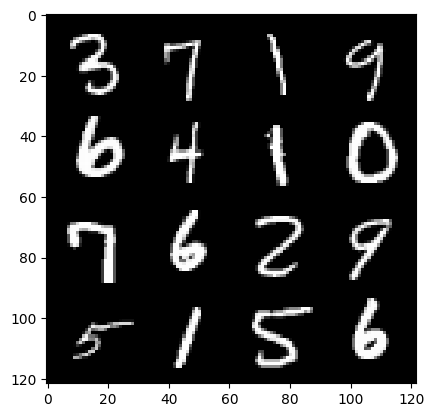

146: step 68700 / Gen loss: 20556414.883934733 / disc_loss: 22886078.096822917


  0%|          | 0/469 [00:00<?, ?it/s]

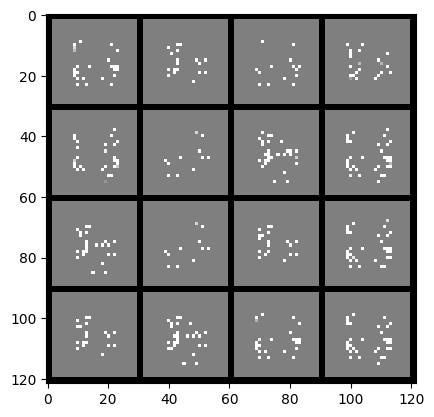

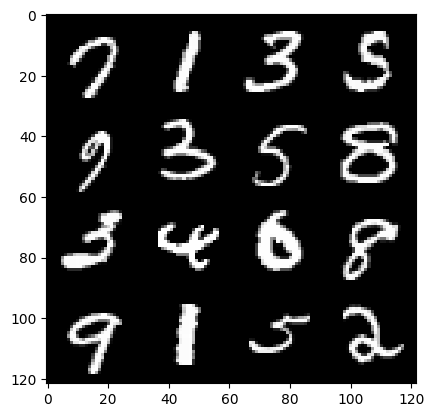

147: step 69000 / Gen loss: 21489742.60057292 / disc_loss: 41970821.524433576


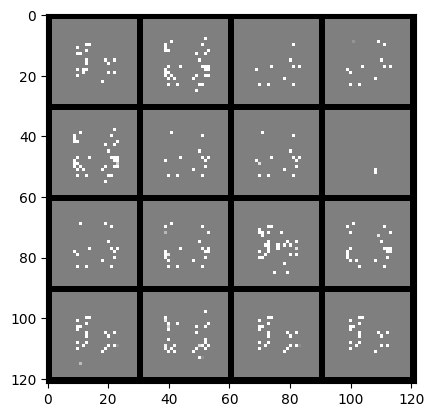

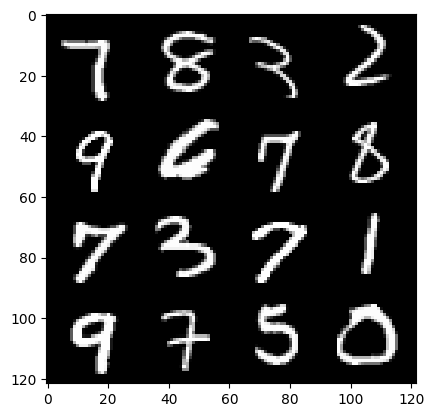

147: step 69300 / Gen loss: 13073981.77958333 / disc_loss: 60578660.33083334


  0%|          | 0/469 [00:00<?, ?it/s]

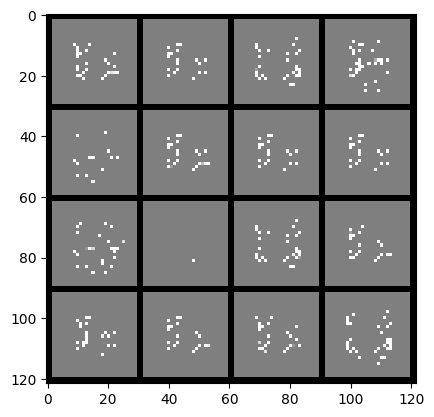

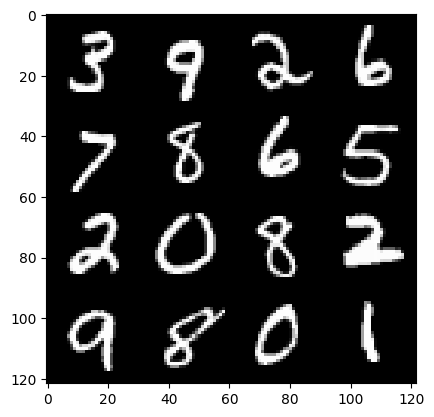

148: step 69600 / Gen loss: 37091363.37791665 / disc_loss: 28783172.898520533


  0%|          | 0/469 [00:00<?, ?it/s]

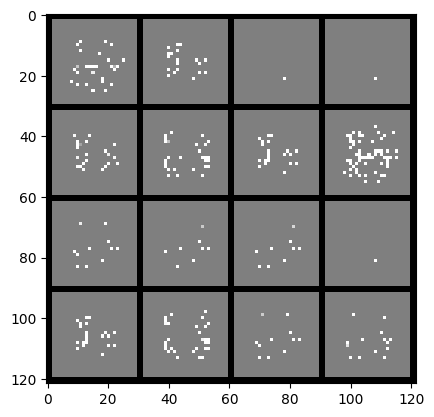

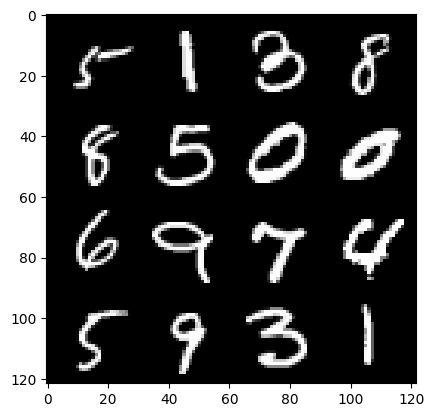

149: step 69900 / Gen loss: 1254142.6041666665 / disc_loss: 61856647.97071664


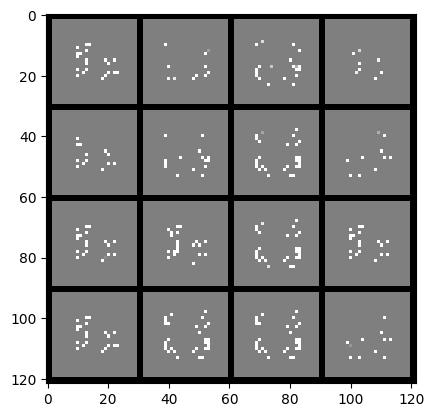

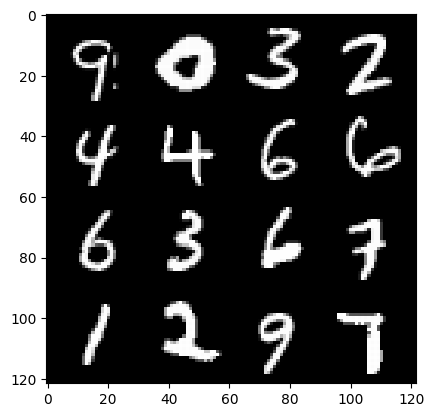

149: step 70200 / Gen loss: 23040280.30794271 / disc_loss: 10637918.18118571


  0%|          | 0/469 [00:00<?, ?it/s]

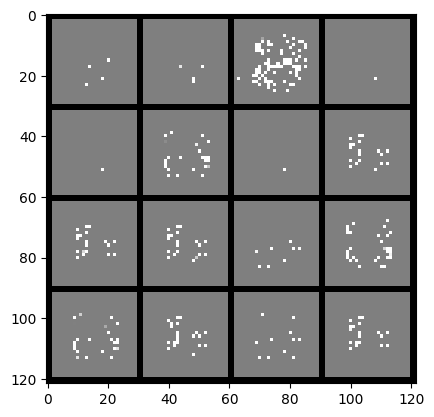

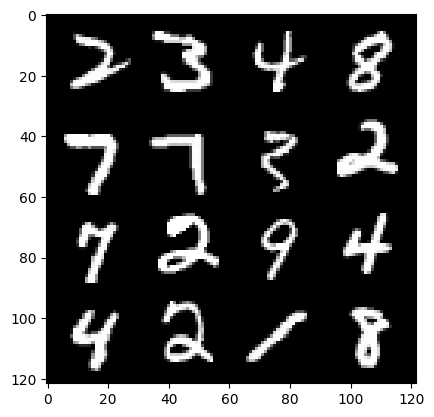

150: step 70500 / Gen loss: 4799601.665208332 / disc_loss: 33178378.242229834


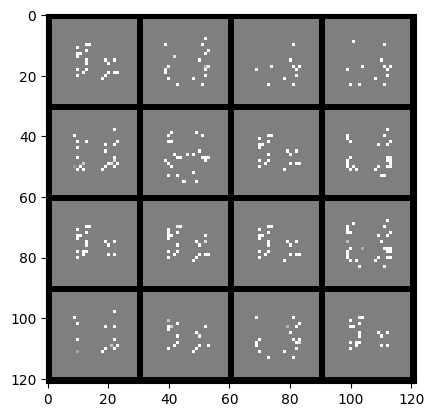

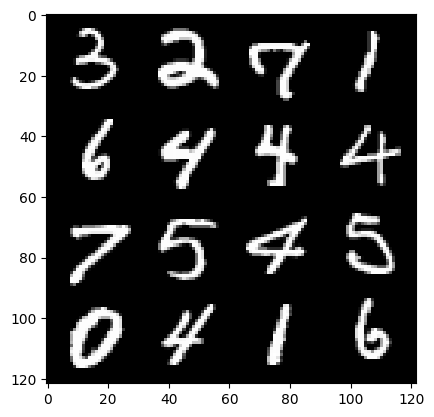

150: step 70800 / Gen loss: 9346991.508339431 / disc_loss: 14981506.084724525


  0%|          | 0/469 [00:00<?, ?it/s]

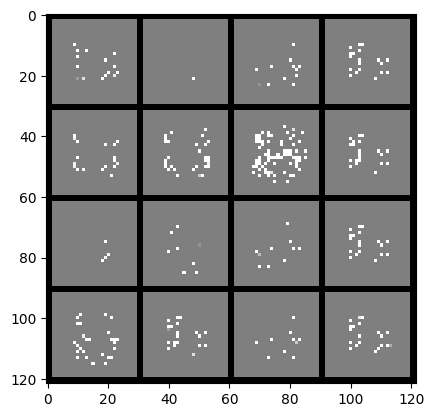

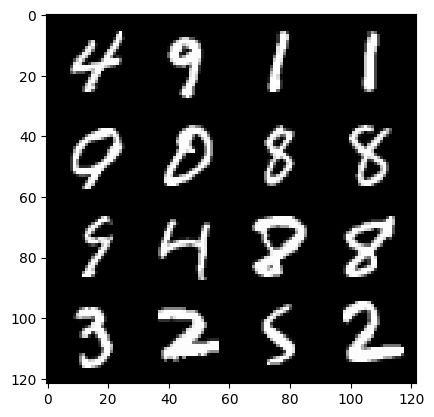

151: step 71100 / Gen loss: 7483680.654088541 / disc_loss: 16586270.67118489


  0%|          | 0/469 [00:00<?, ?it/s]

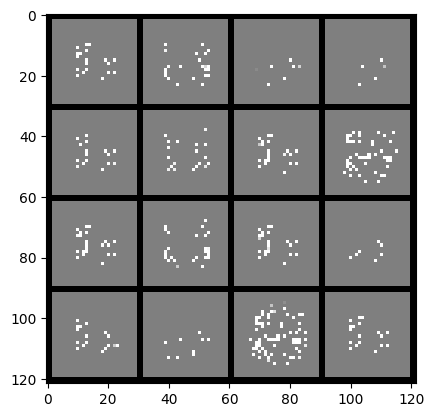

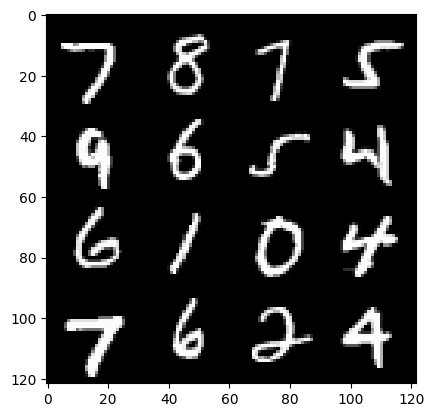

152: step 71400 / Gen loss: 12964943.791321462 / disc_loss: 10610495.512628583


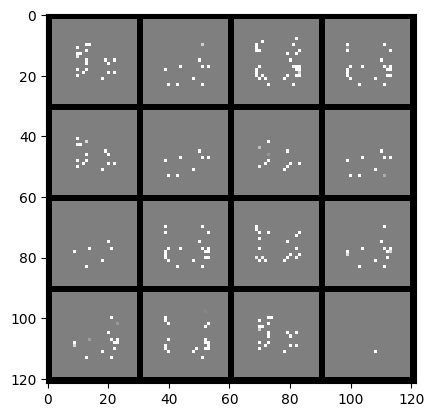

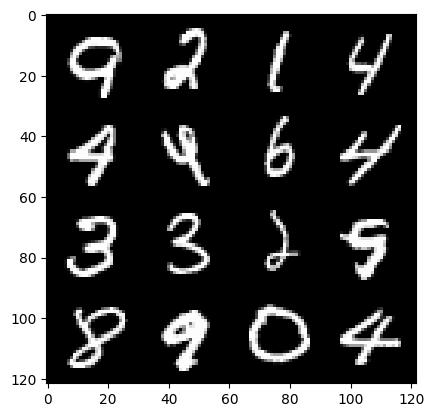

152: step 71700 / Gen loss: 9782668.279687494 / disc_loss: 16714989.016217448


  0%|          | 0/469 [00:00<?, ?it/s]

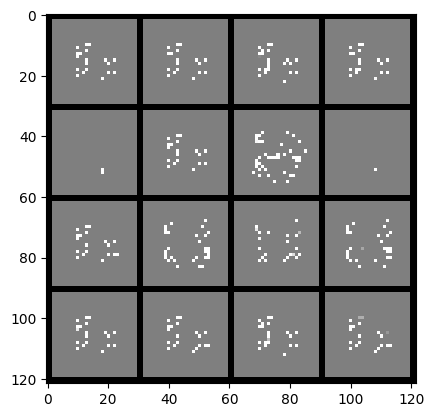

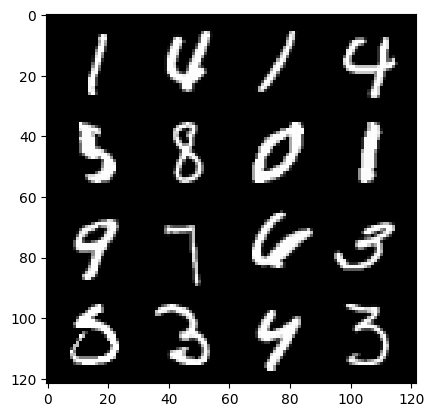

153: step 72000 / Gen loss: 517715.2588541666 / disc_loss: 19359210.53796357


  0%|          | 0/469 [00:00<?, ?it/s]

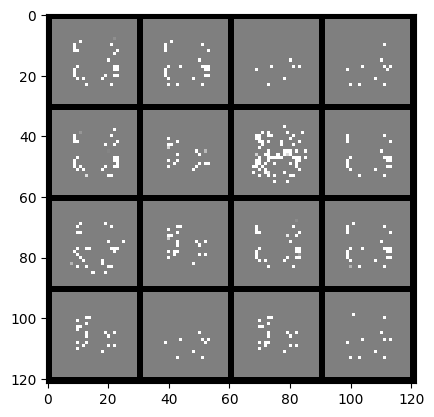

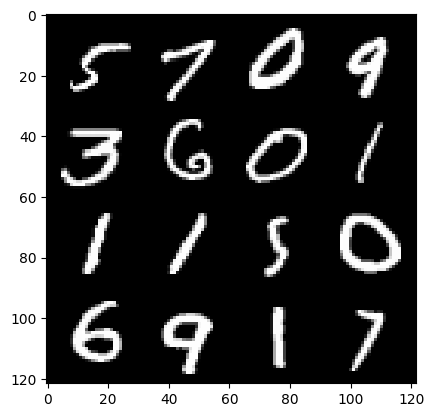

154: step 72300 / Gen loss: 15146780.439199217 / disc_loss: 12818135.793385422


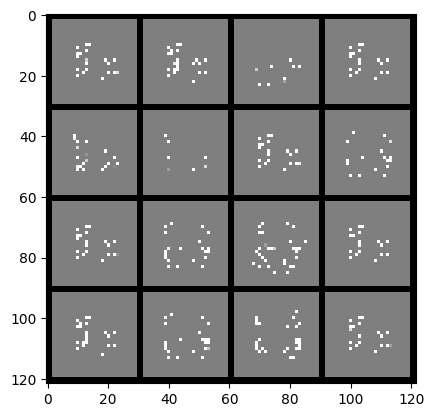

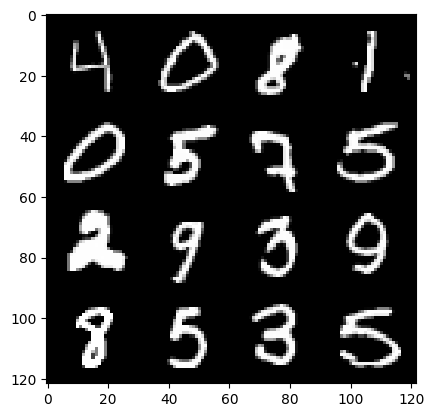

154: step 72600 / Gen loss: 6761454.722499999 / disc_loss: 25012722.10175378


  0%|          | 0/469 [00:00<?, ?it/s]

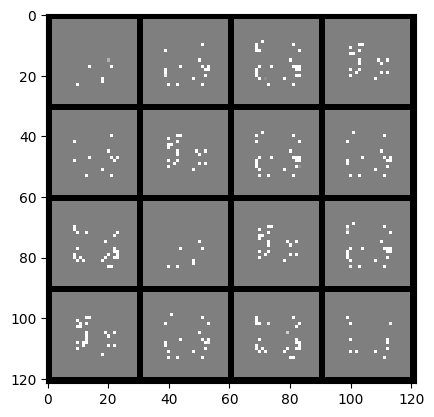

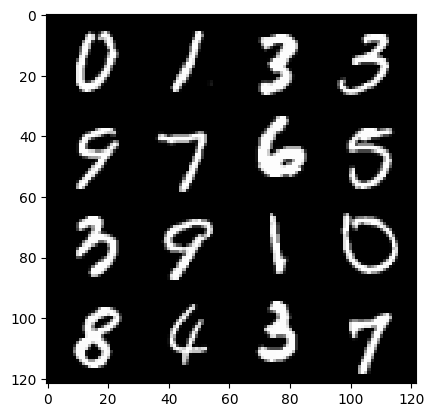

155: step 72900 / Gen loss: 9052966.377425943 / disc_loss: 9341252.551124671


  0%|          | 0/469 [00:00<?, ?it/s]

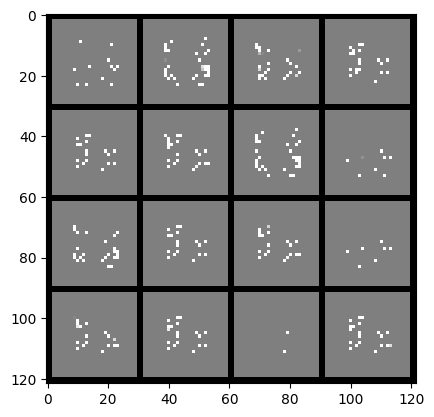

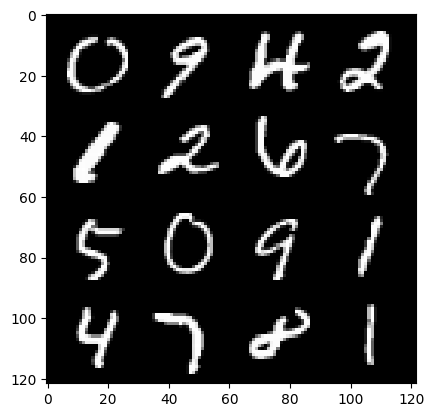

156: step 73200 / Gen loss: 2274401.4276047777 / disc_loss: 17275668.51014241


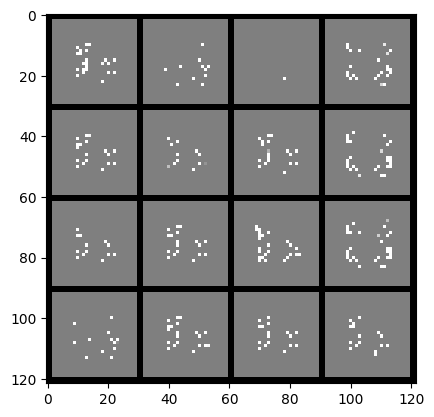

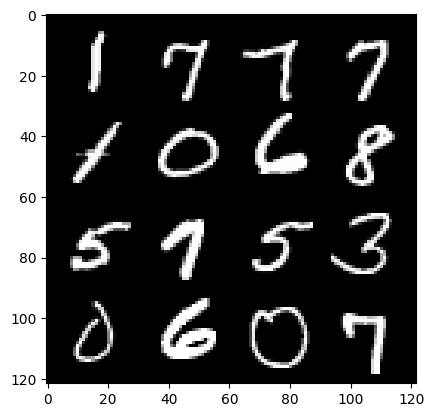

156: step 73500 / Gen loss: 9324515.216293124 / disc_loss: 10174240.750735875


  0%|          | 0/469 [00:00<?, ?it/s]

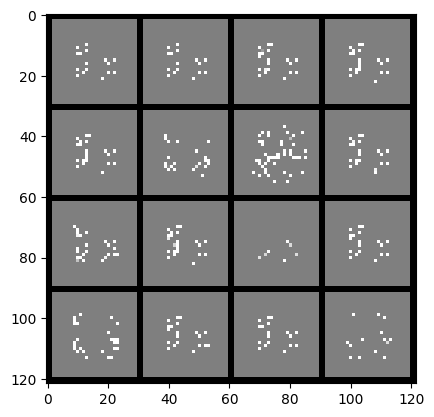

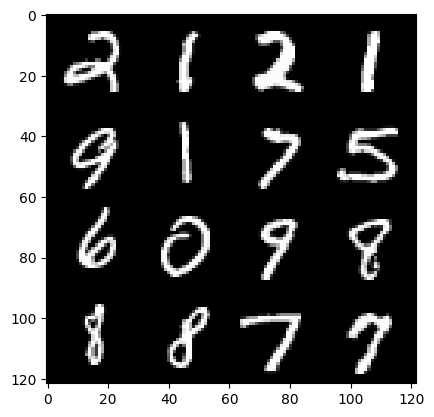

157: step 73800 / Gen loss: 10603353.016040036 / disc_loss: 17850522.526202798


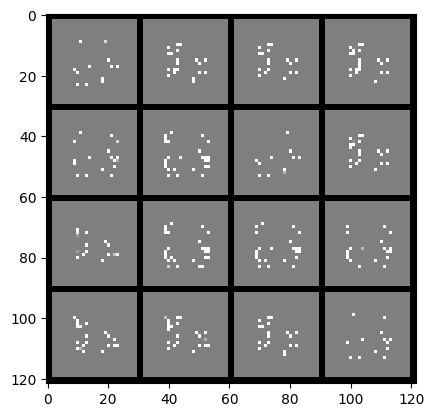

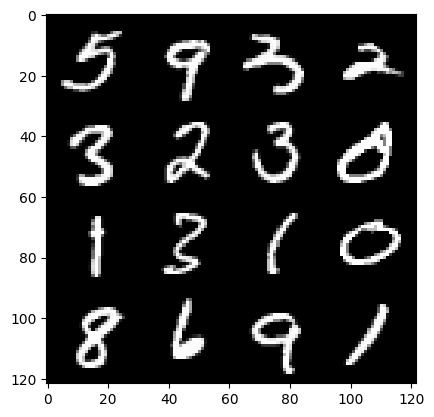

157: step 74100 / Gen loss: 5458716.428001302 / disc_loss: 37206156.86185812


  0%|          | 0/469 [00:00<?, ?it/s]

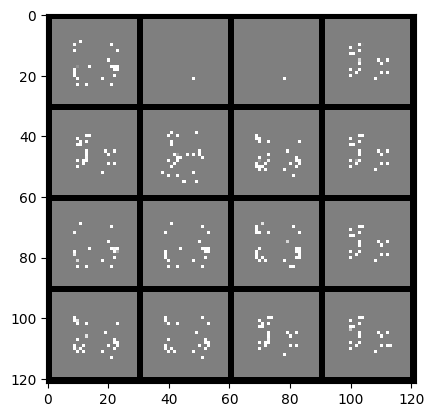

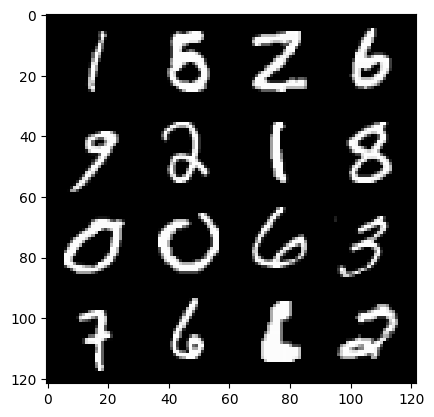

158: step 74400 / Gen loss: 26354026.92031901 / disc_loss: 24643435.54333253


  0%|          | 0/469 [00:00<?, ?it/s]

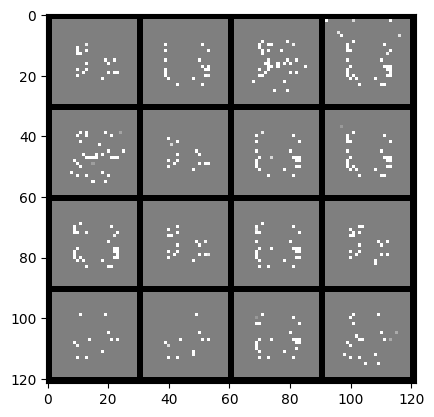

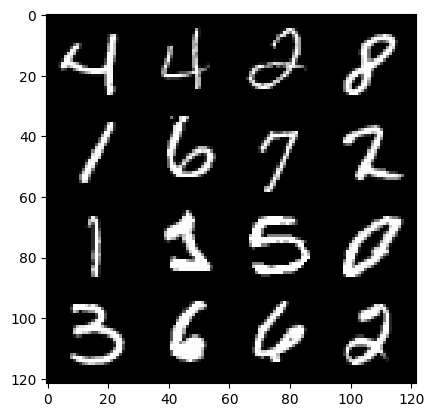

159: step 74700 / Gen loss: 19985980.975522466 / disc_loss: 38503632.42208333


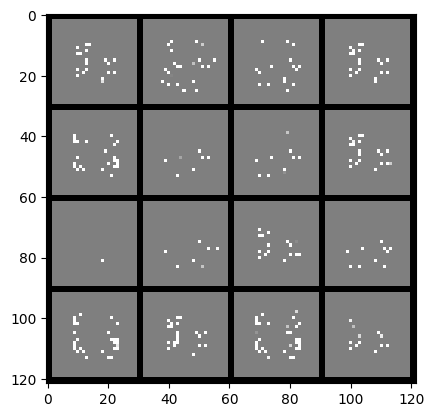

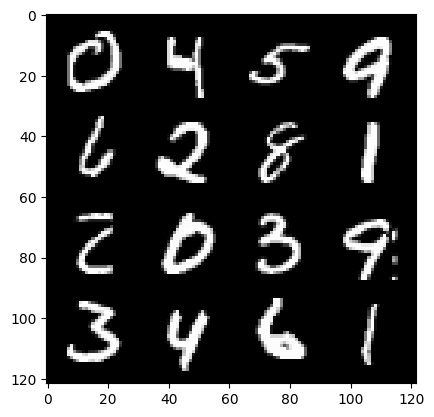

159: step 75000 / Gen loss: 16509694.730362957 / disc_loss: 16723629.50671713


  0%|          | 0/469 [00:00<?, ?it/s]

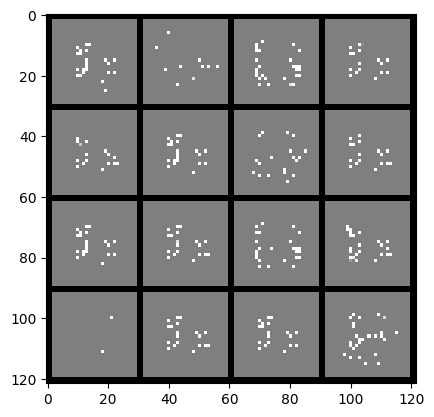

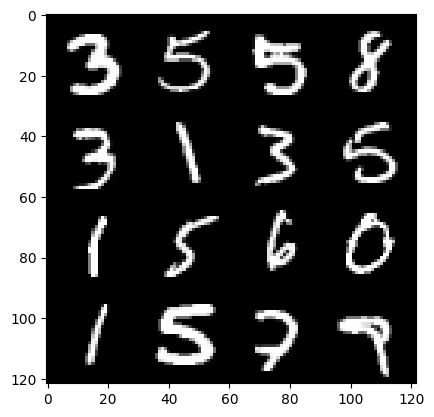

160: step 75300 / Gen loss: 16927960.398961585 / disc_loss: 52282471.51526368


  0%|          | 0/469 [00:00<?, ?it/s]

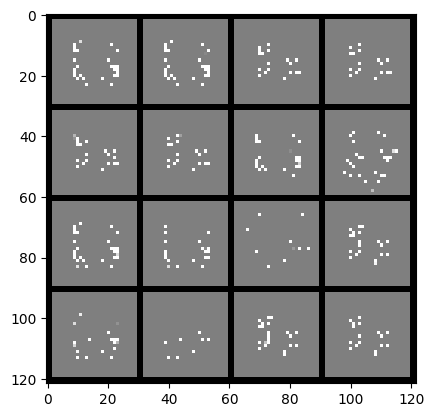

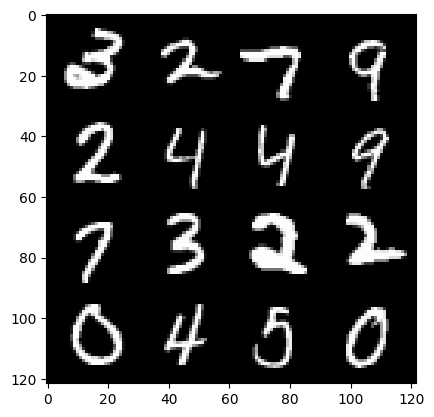

161: step 75600 / Gen loss: 16686005.48352213 / disc_loss: 52796443.171389565


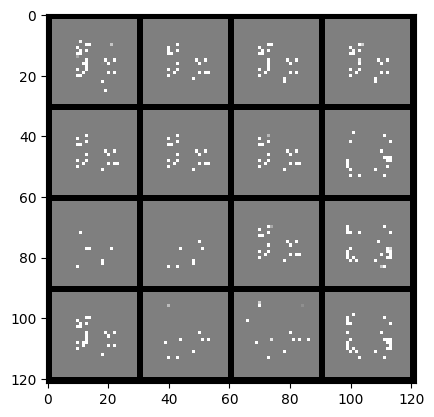

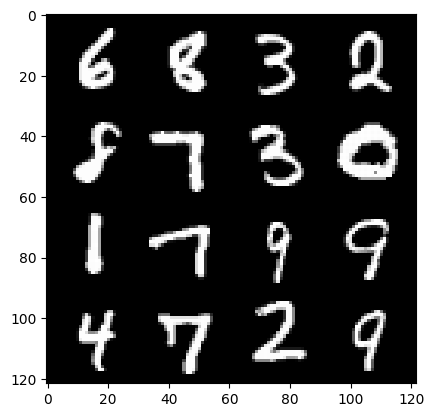

161: step 75900 / Gen loss: 29685954.95228515 / disc_loss: 34941020.05807942


  0%|          | 0/469 [00:00<?, ?it/s]

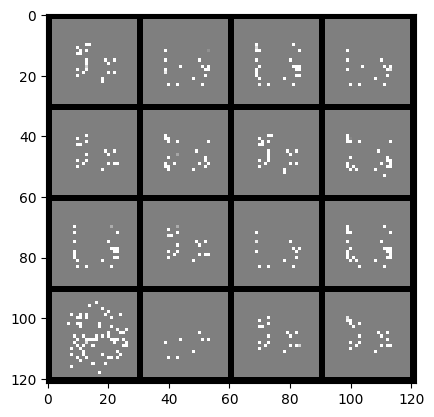

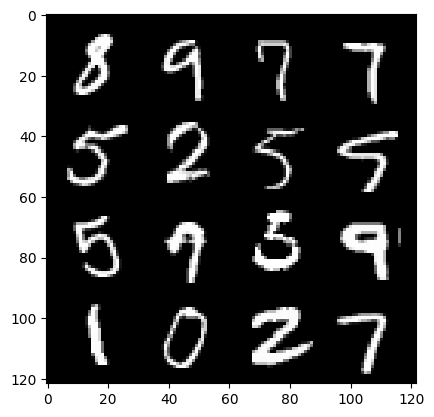

162: step 76200 / Gen loss: 39166170.52526041 / disc_loss: 50016641.630989596


  0%|          | 0/469 [00:00<?, ?it/s]

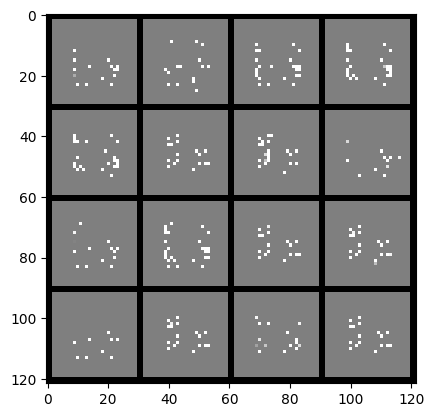

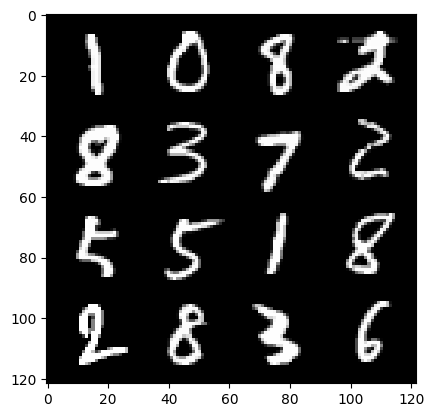

163: step 76500 / Gen loss: 5725528.06733073 / disc_loss: 96717337.13695315


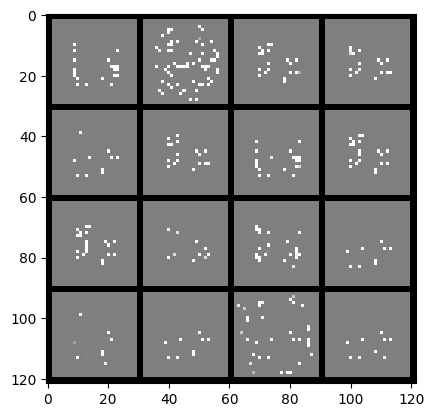

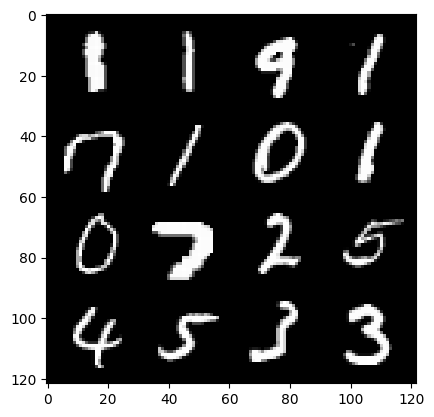

163: step 76800 / Gen loss: 61555995.297063805 / disc_loss: 22741362.74159505


  0%|          | 0/469 [00:00<?, ?it/s]

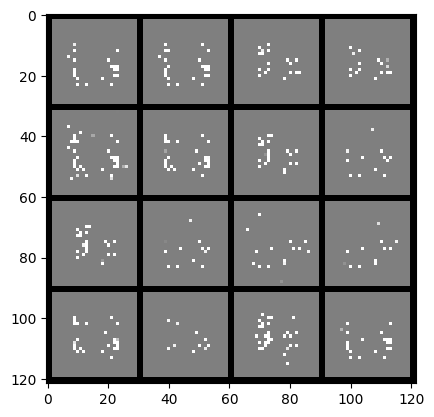

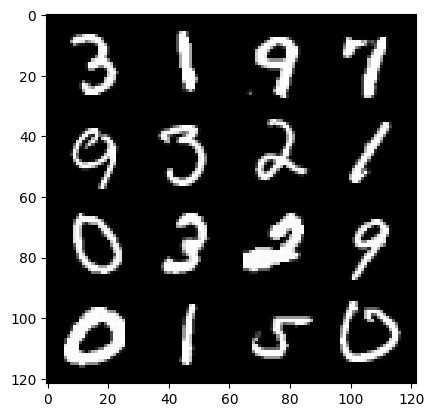

164: step 77100 / Gen loss: 0.0 / disc_loss: 117752420.21499991


  0%|          | 0/469 [00:00<?, ?it/s]

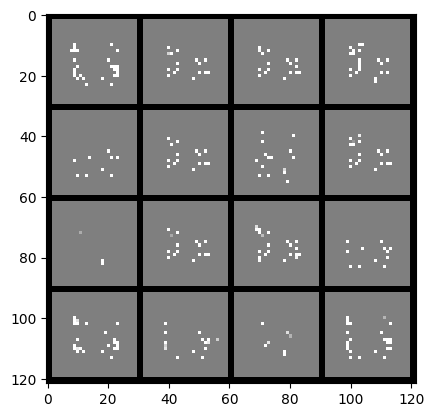

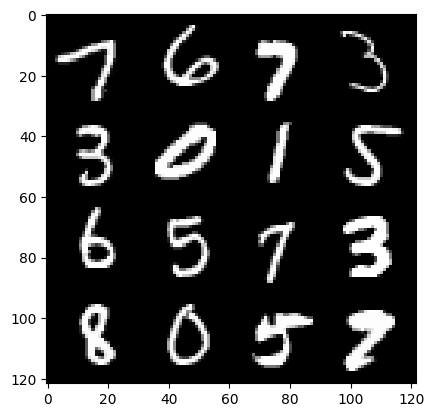

165: step 77400 / Gen loss: 66433368.449999966 / disc_loss: 30465504.985624995


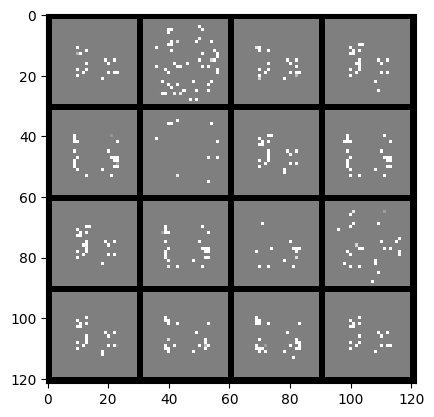

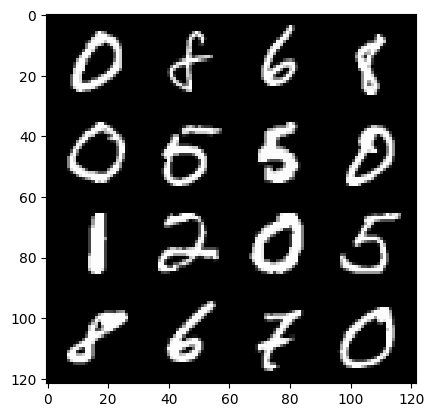

165: step 77700 / Gen loss: 13014014.199583335 / disc_loss: 85375019.71010414


  0%|          | 0/469 [00:00<?, ?it/s]

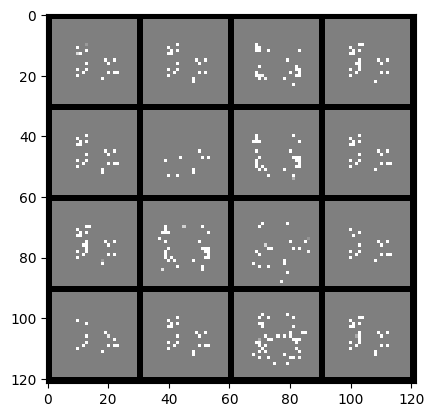

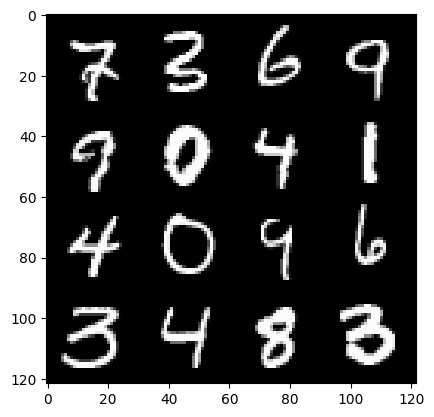

166: step 78000 / Gen loss: 6688884.212083333 / disc_loss: 91536862.20679195


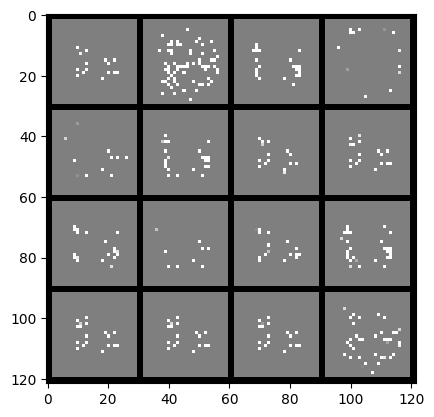

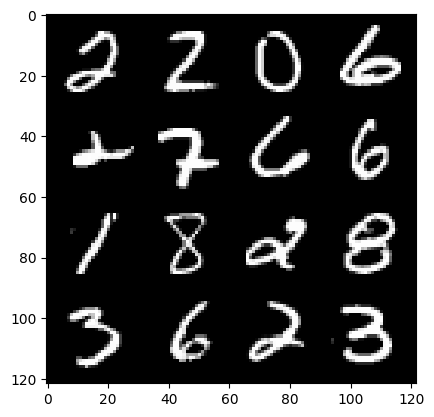

166: step 78300 / Gen loss: 86125447.29736978 / disc_loss: 10397856.963660074


  0%|          | 0/469 [00:00<?, ?it/s]

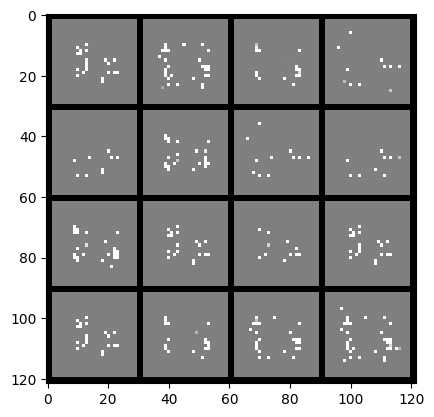

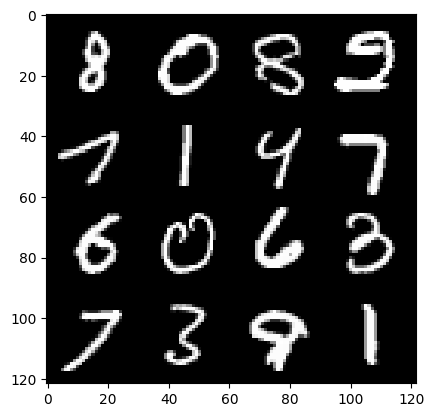

167: step 78600 / Gen loss: 0.0 / disc_loss: 131424656.82666671


  0%|          | 0/469 [00:00<?, ?it/s]

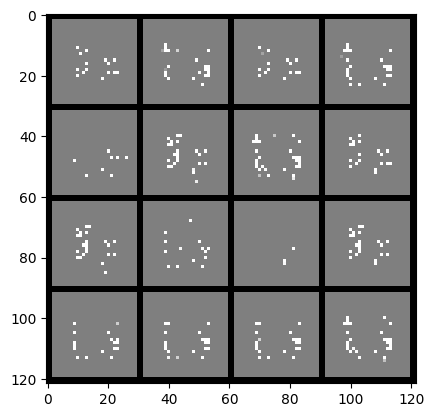

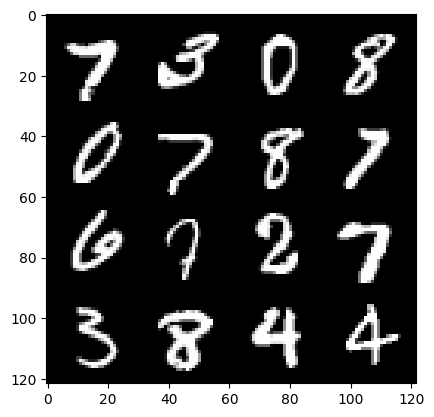

168: step 78900 / Gen loss: 48492066.4370052 / disc_loss: 30693959.422247726


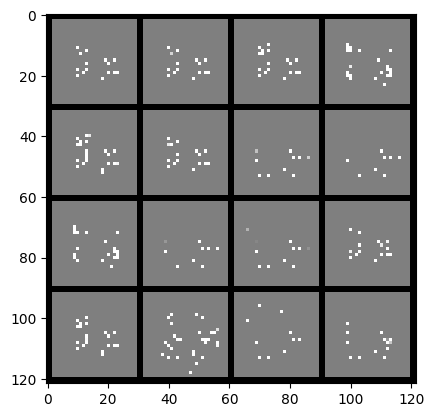

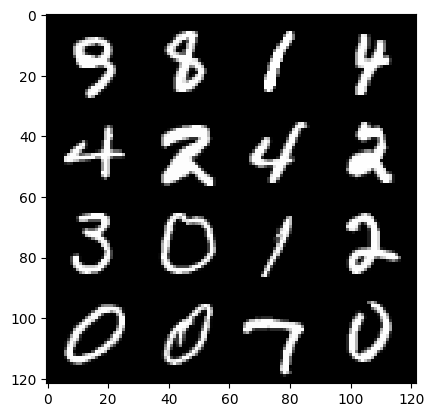

168: step 79200 / Gen loss: 21749400.911542986 / disc_loss: 44668263.331666686


  0%|          | 0/469 [00:00<?, ?it/s]

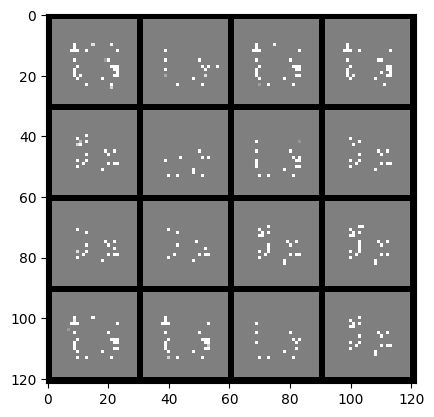

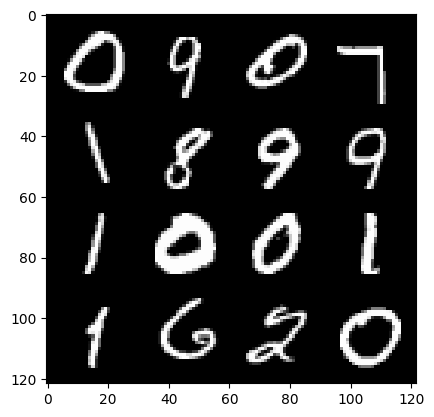

169: step 79500 / Gen loss: 0.0 / disc_loss: 84944753.93333332


  0%|          | 0/469 [00:00<?, ?it/s]

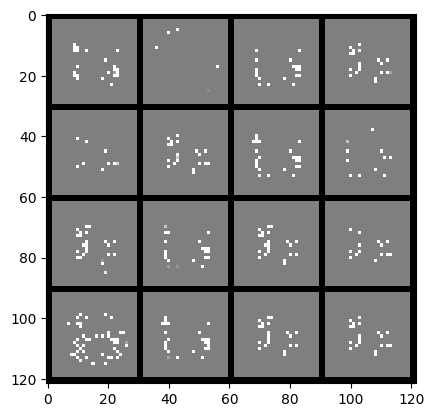

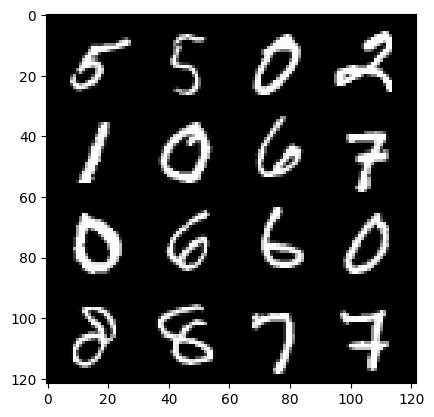

170: step 79800 / Gen loss: 59674269.730576135 / disc_loss: 2363563.0123583986


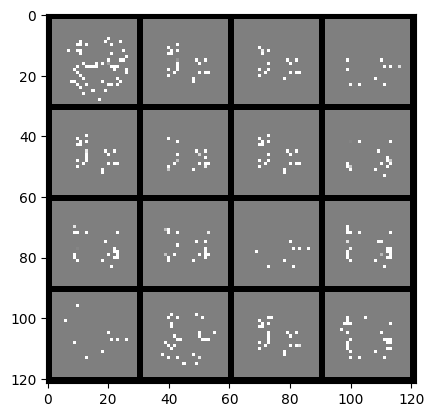

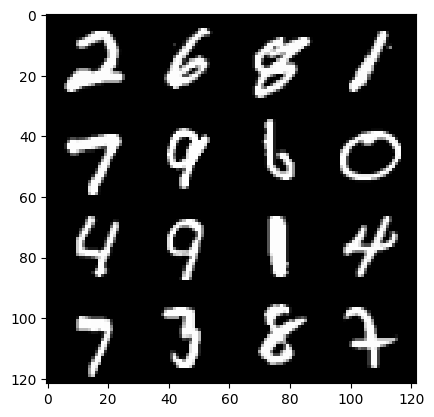

170: step 80100 / Gen loss: 0.0 / disc_loss: 59576035.00666664


  0%|          | 0/469 [00:00<?, ?it/s]

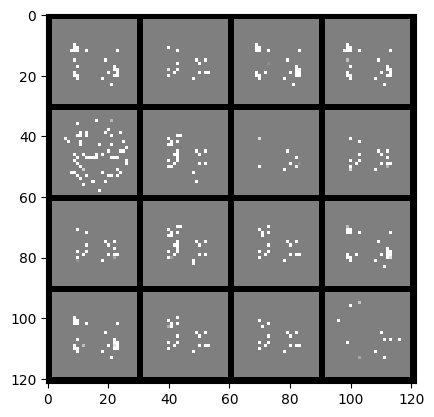

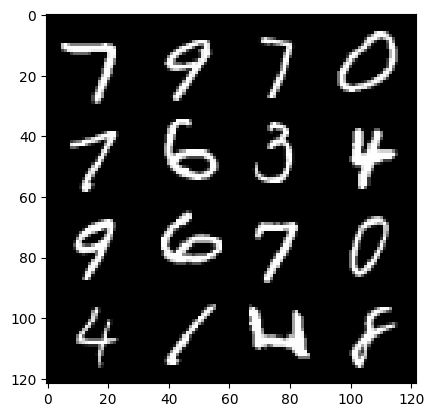

171: step 80400 / Gen loss: 16572889.815569662 / disc_loss: 7340802.7349739075


  0%|          | 0/469 [00:00<?, ?it/s]

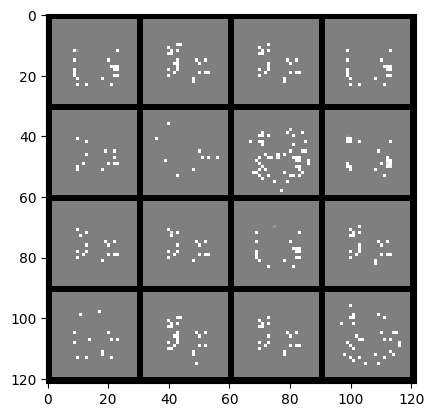

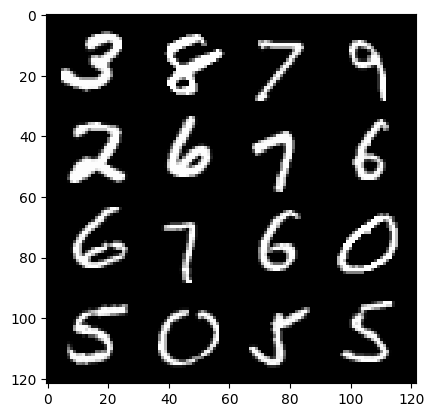

172: step 80700 / Gen loss: 4066718.829931641 / disc_loss: 20381935.349459335


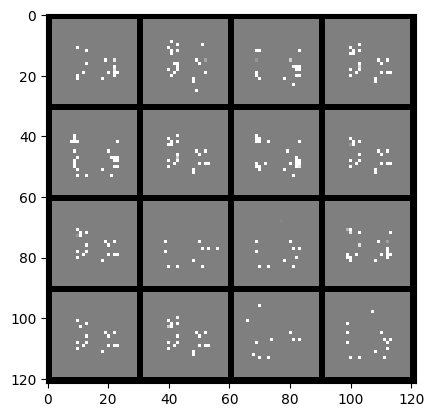

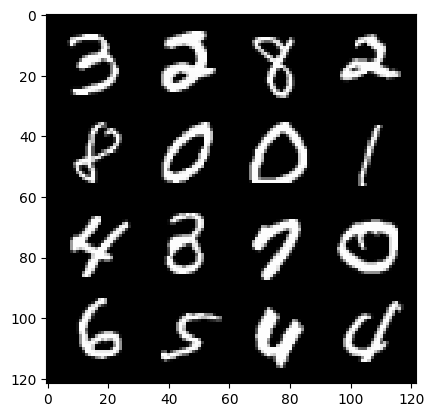

172: step 81000 / Gen loss: 11735712.70205891 / disc_loss: 12996788.85205027


  0%|          | 0/469 [00:00<?, ?it/s]

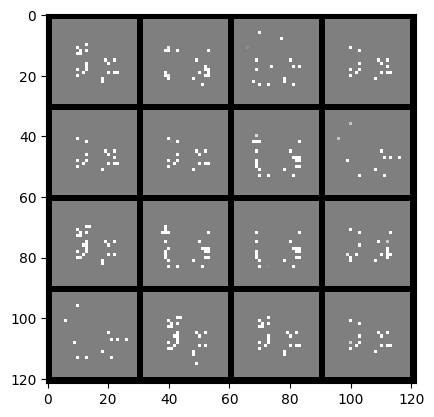

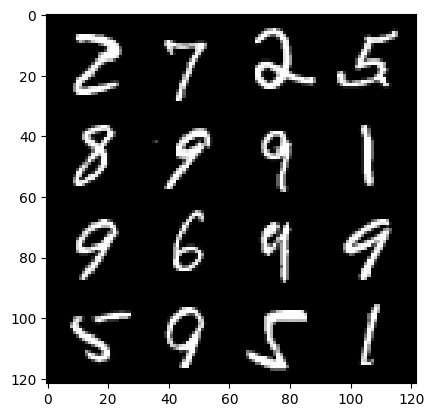

173: step 81300 / Gen loss: 7002598.017851563 / disc_loss: 15842243.956494143


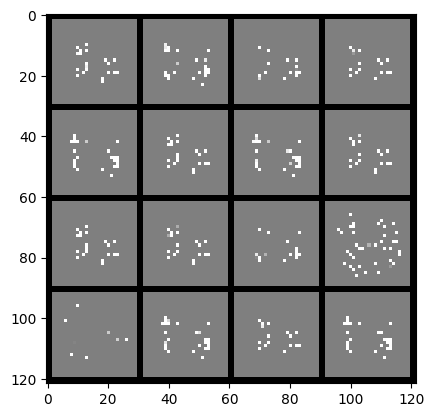

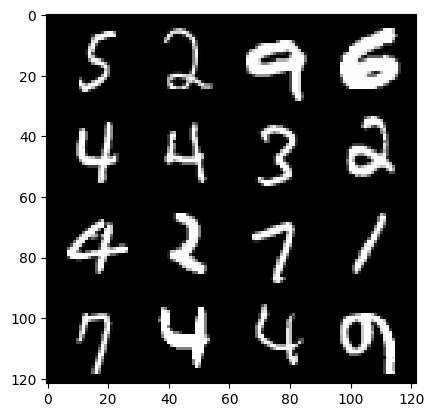

173: step 81600 / Gen loss: 10520776.960651044 / disc_loss: 29399455.888811845


  0%|          | 0/469 [00:00<?, ?it/s]

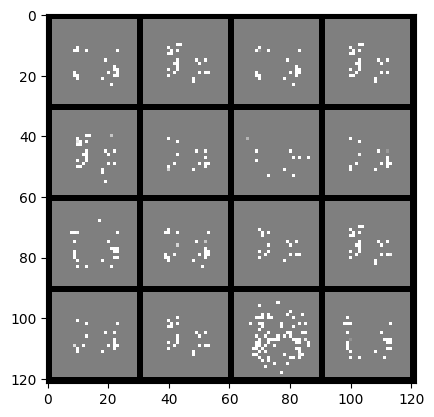

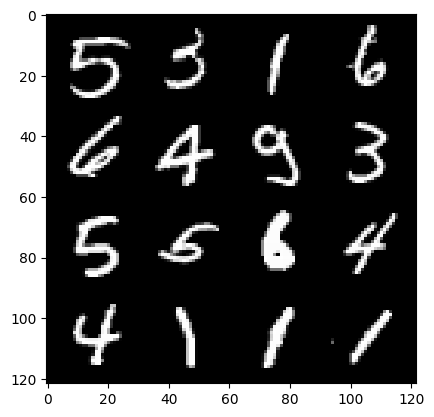

174: step 81900 / Gen loss: 17073870.7154126 / disc_loss: 14789067.013721112


  0%|          | 0/469 [00:00<?, ?it/s]

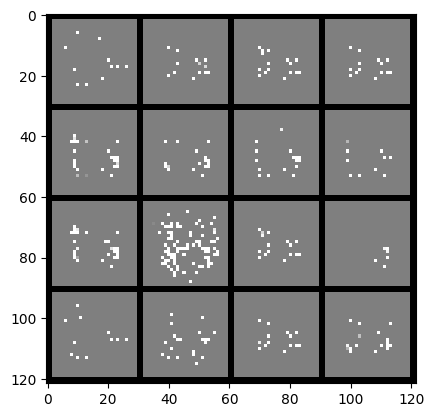

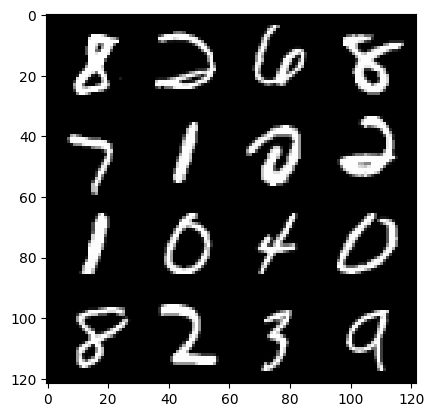

175: step 82200 / Gen loss: 8674078.804511718 / disc_loss: 44202633.36972108


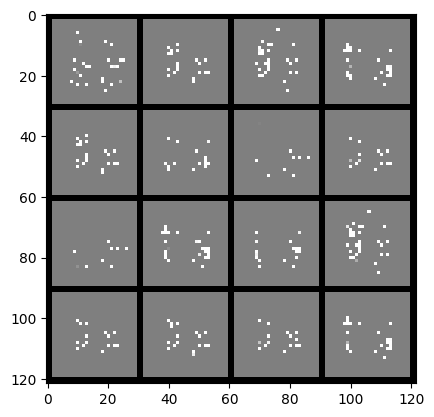

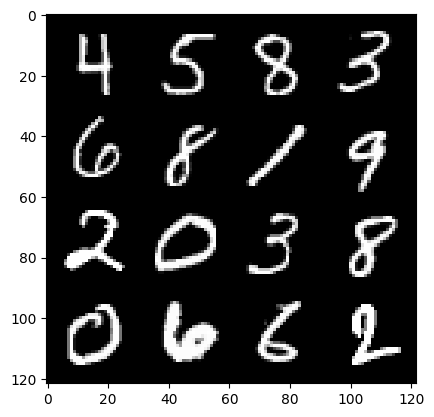

175: step 82500 / Gen loss: 30728429.20908486 / disc_loss: 15761572.849609379


  0%|          | 0/469 [00:00<?, ?it/s]

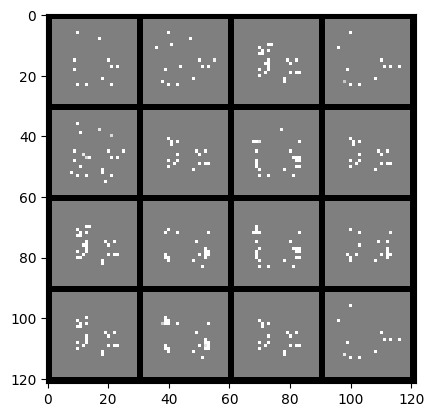

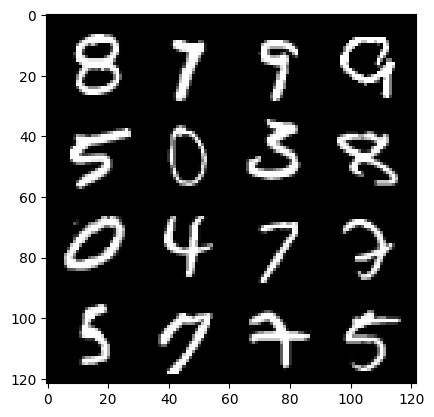

176: step 82800 / Gen loss: 1334431.9956119792 / disc_loss: 66973347.49012699


  0%|          | 0/469 [00:00<?, ?it/s]

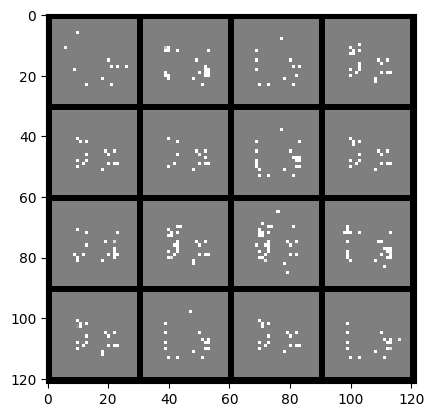

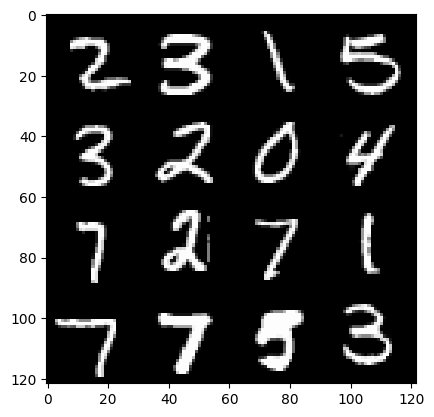

177: step 83100 / Gen loss: 38917818.42207029 / disc_loss: 20600235.118033845


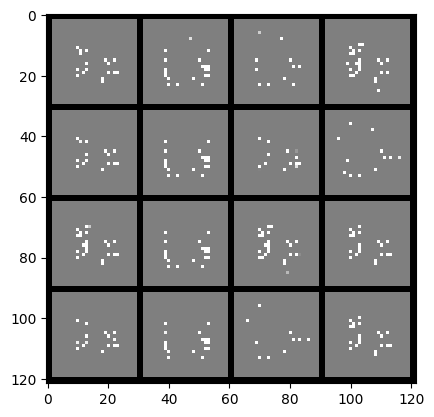

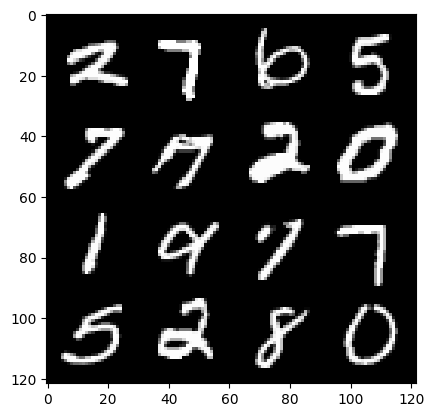

177: step 83400 / Gen loss: 3212762.446285808 / disc_loss: 61224186.884081766


  0%|          | 0/469 [00:00<?, ?it/s]

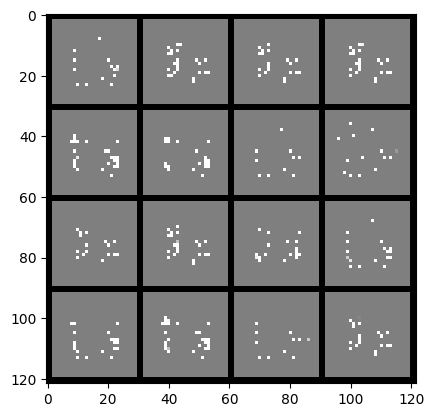

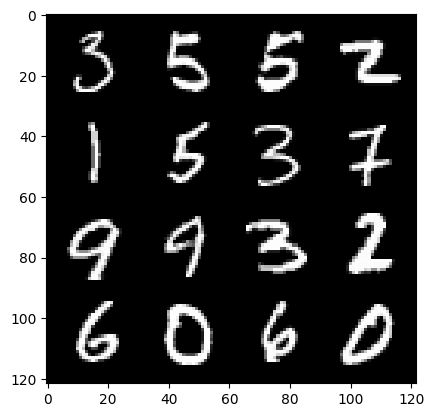

178: step 83700 / Gen loss: 25131919.988645986 / disc_loss: 24475589.128171388


  0%|          | 0/469 [00:00<?, ?it/s]

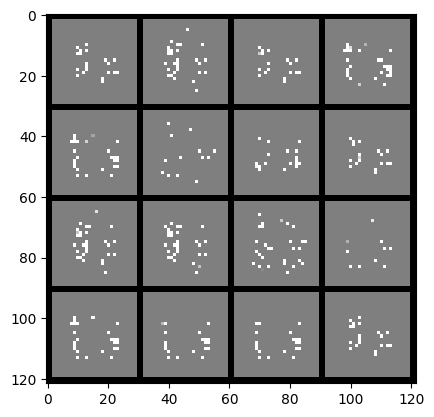

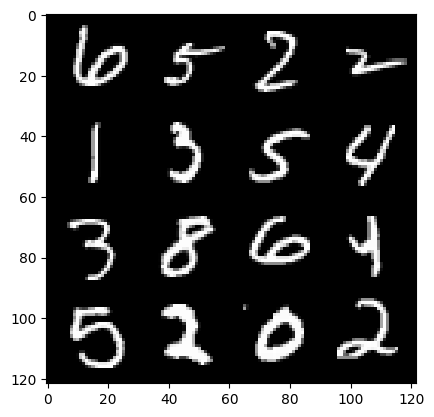

179: step 84000 / Gen loss: 3962269.302064411 / disc_loss: 6651955.630007931


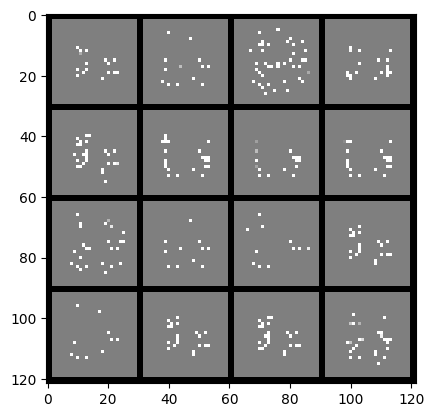

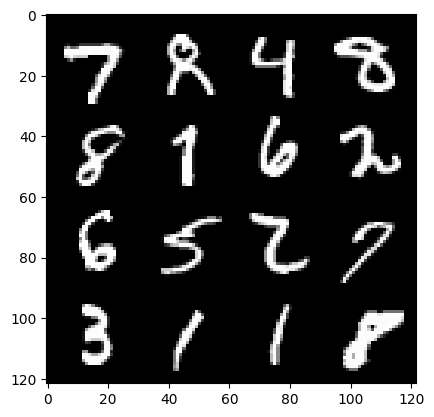

179: step 84300 / Gen loss: 5855475.470770772 / disc_loss: 14303343.120566403


  0%|          | 0/469 [00:00<?, ?it/s]

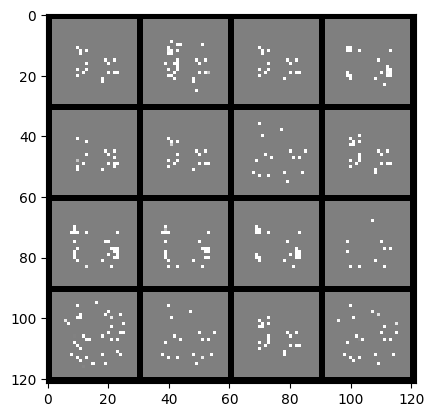

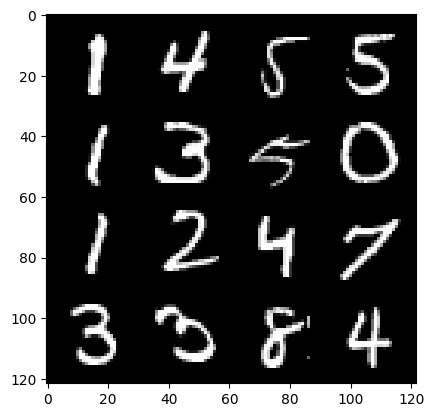

180: step 84600 / Gen loss: 14683722.62047526 / disc_loss: 16571660.991689444


  0%|          | 0/469 [00:00<?, ?it/s]

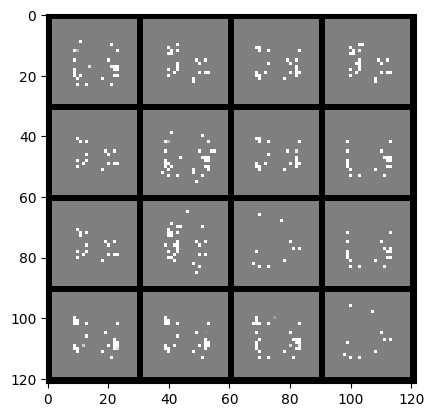

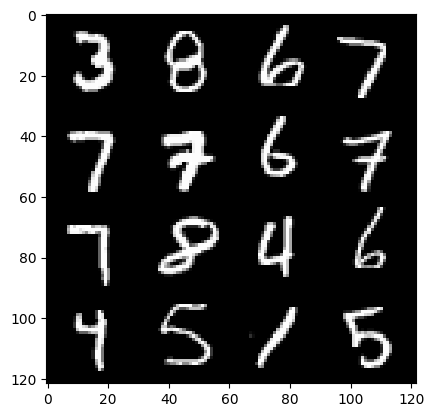

181: step 84900 / Gen loss: 6809381.704348962 / disc_loss: 36905928.666354164


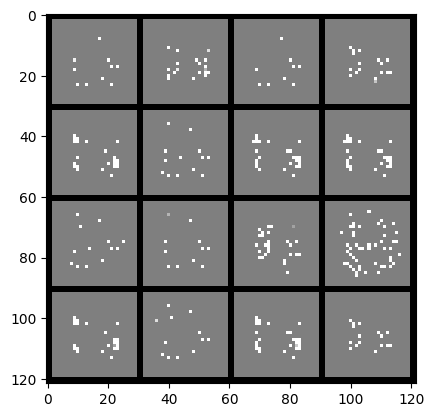

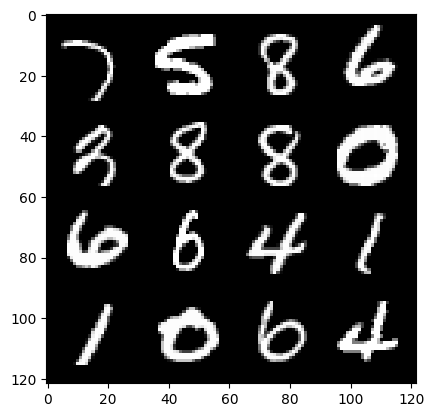

181: step 85200 / Gen loss: 16729297.813256837 / disc_loss: 24148583.060429703


  0%|          | 0/469 [00:00<?, ?it/s]

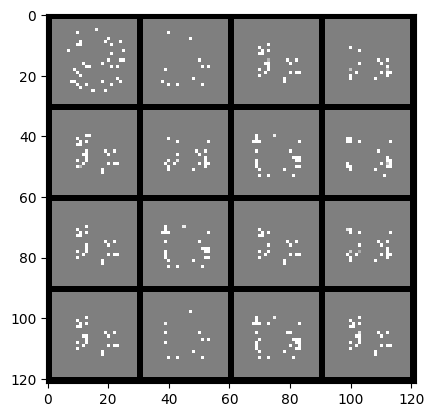

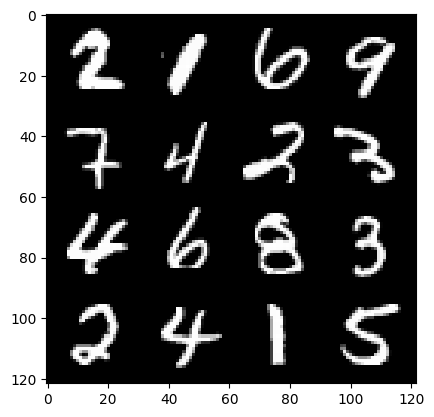

182: step 85500 / Gen loss: 14322249.609375002 / disc_loss: 44395581.580780454


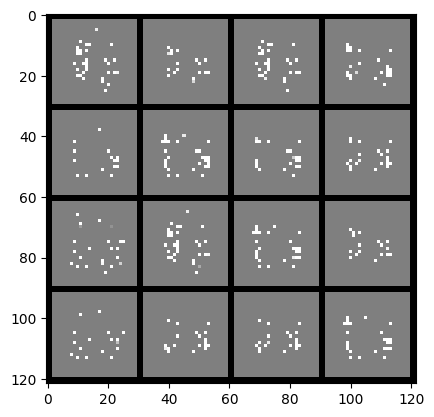

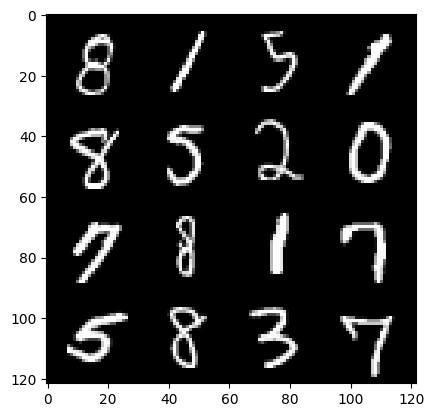

182: step 85800 / Gen loss: 37108975.22573119 / disc_loss: 32169043.620963544


  0%|          | 0/469 [00:00<?, ?it/s]

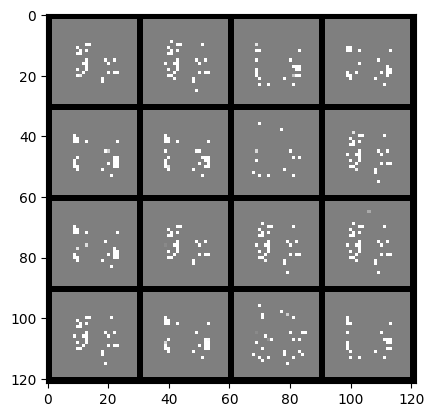

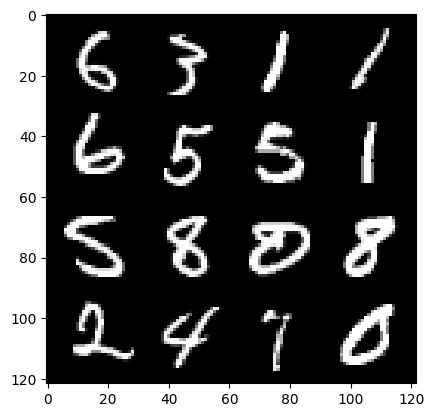

183: step 86100 / Gen loss: 23555637.17229818 / disc_loss: 83154706.38801917


  0%|          | 0/469 [00:00<?, ?it/s]

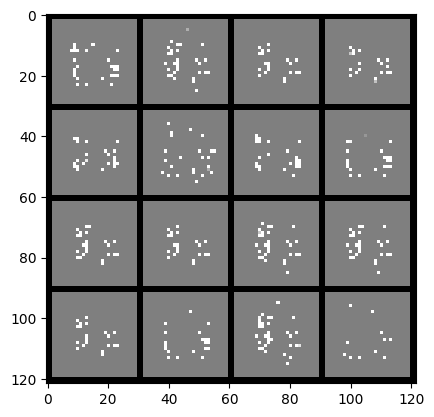

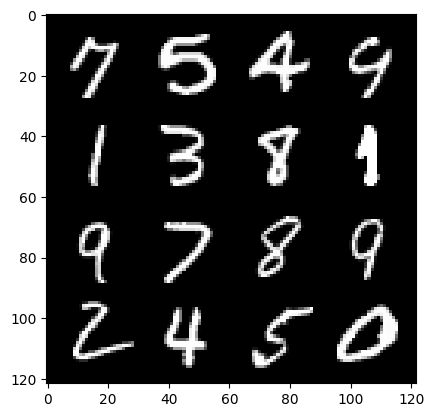

184: step 86400 / Gen loss: 42737556.5245801 / disc_loss: 80199902.55854164


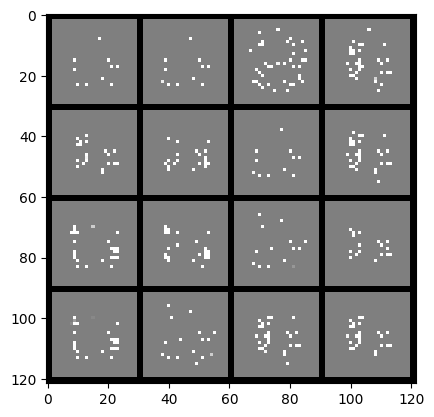

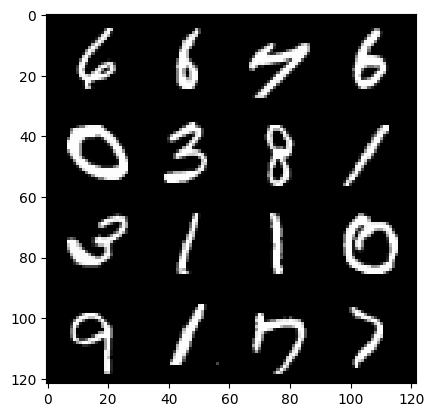

184: step 86700 / Gen loss: 43351358.23696695 / disc_loss: 78804182.97156247


  0%|          | 0/469 [00:00<?, ?it/s]

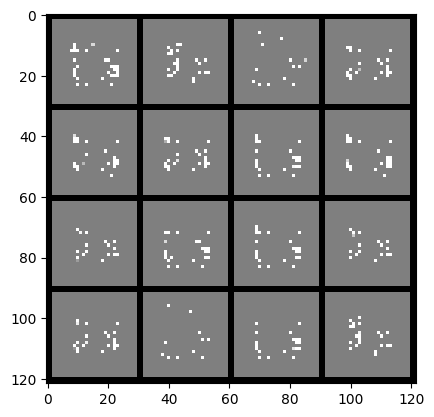

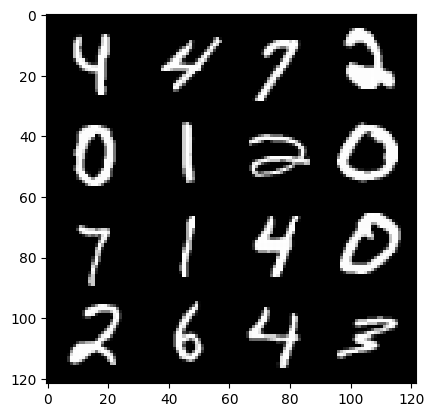

185: step 87000 / Gen loss: 43977938.63192706 / disc_loss: 75721600.71955729


  0%|          | 0/469 [00:00<?, ?it/s]

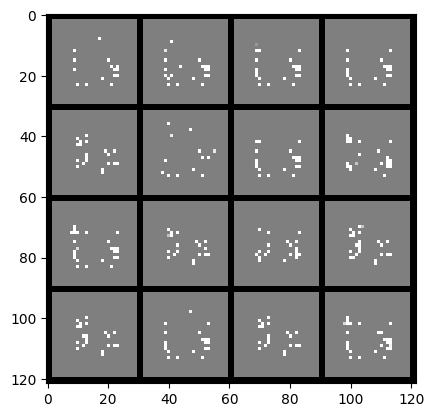

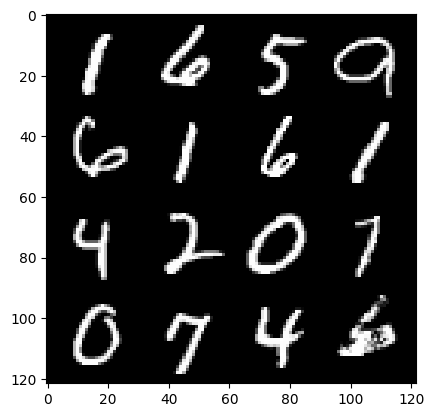

186: step 87300 / Gen loss: 18624646.558930255 / disc_loss: 76449454.83152503


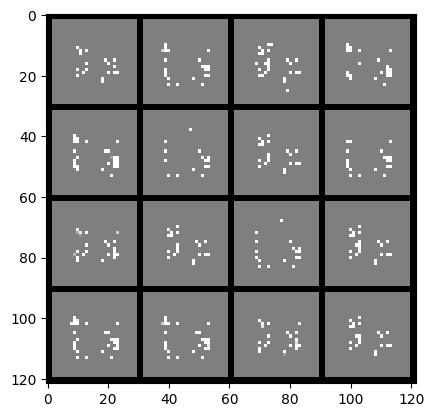

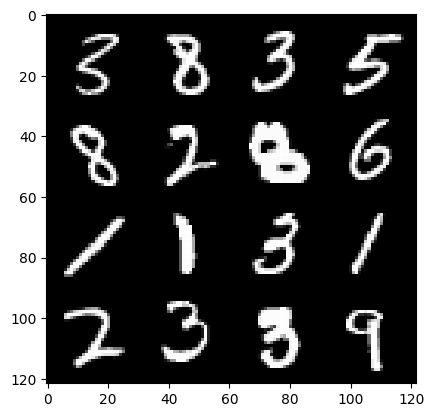

186: step 87600 / Gen loss: 24558301.58358725 / disc_loss: 38460039.53875308


  0%|          | 0/469 [00:00<?, ?it/s]

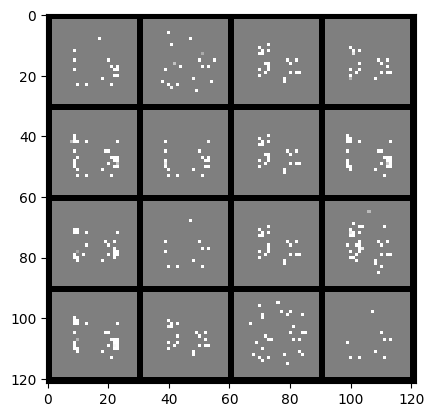

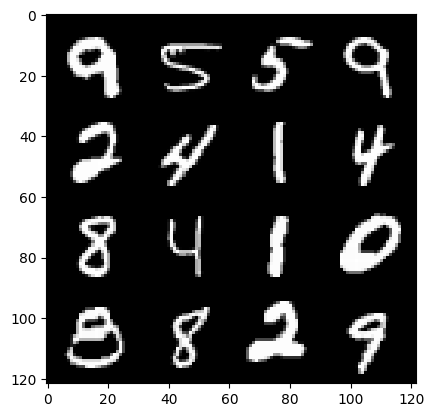

187: step 87900 / Gen loss: 19635803.93245869 / disc_loss: 47572950.5296452


  0%|          | 0/469 [00:00<?, ?it/s]

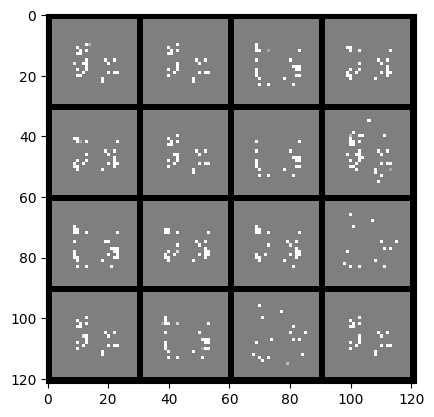

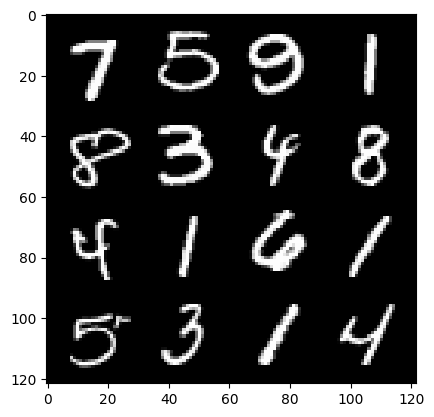

188: step 88200 / Gen loss: 33915534.86257813 / disc_loss: 35281602.04453126


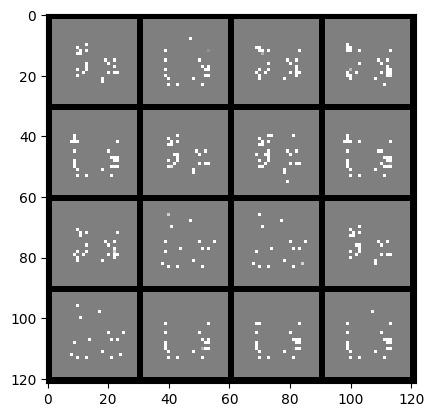

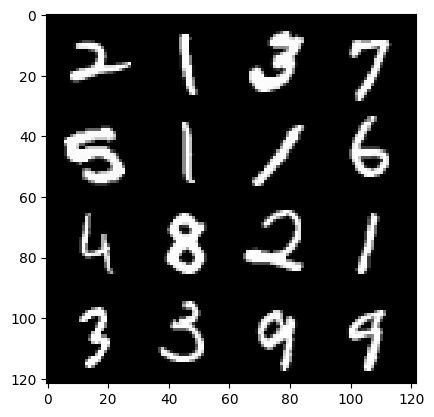

188: step 88500 / Gen loss: 31505994.25338542 / disc_loss: 72454396.94386393


  0%|          | 0/469 [00:00<?, ?it/s]

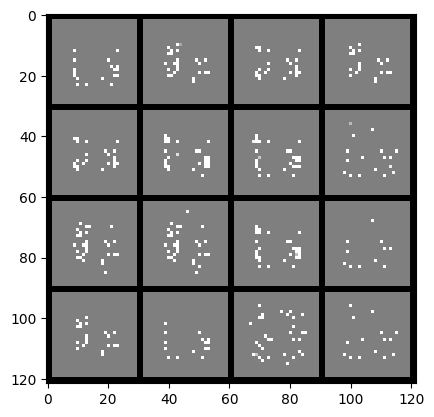

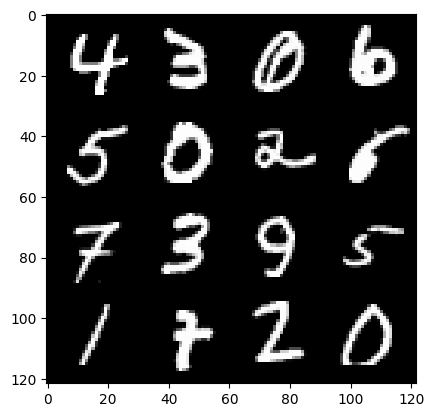

189: step 88800 / Gen loss: 31181123.11057292 / disc_loss: 89127459.11766276


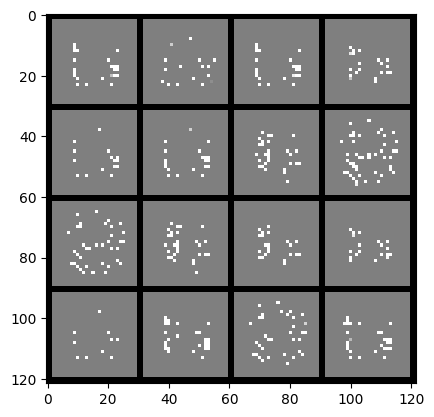

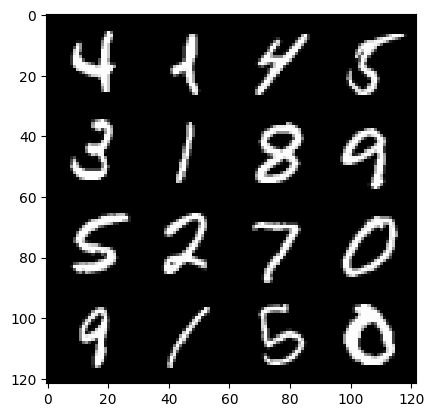

189: step 89100 / Gen loss: 40910807.521500655 / disc_loss: 78958725.90438801


  0%|          | 0/469 [00:00<?, ?it/s]

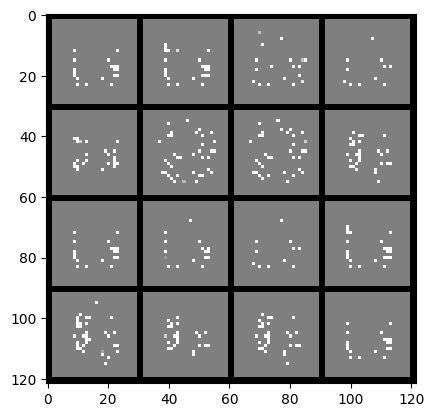

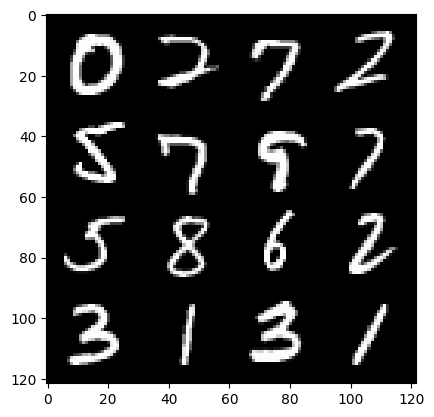

190: step 89400 / Gen loss: 54190019.71385417 / disc_loss: 67754050.52572916


  0%|          | 0/469 [00:00<?, ?it/s]

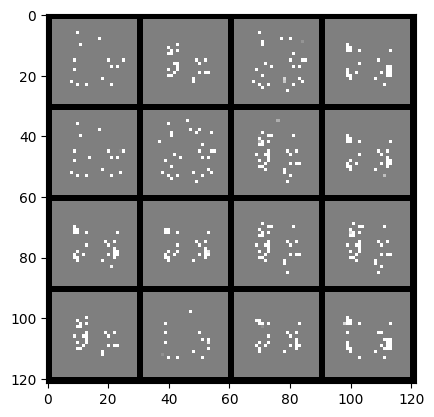

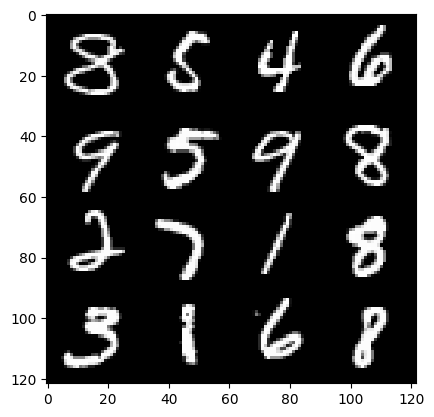

191: step 89700 / Gen loss: 0.0 / disc_loss: 154935666.26000002


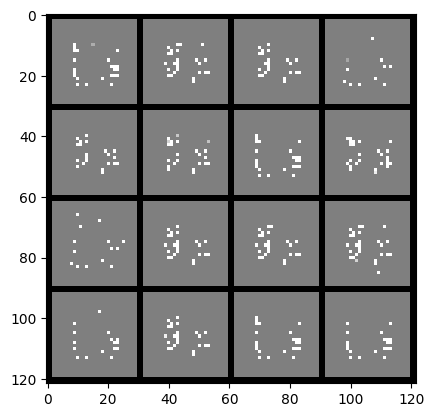

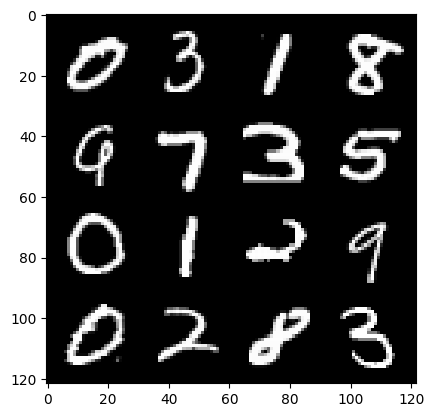

191: step 90000 / Gen loss: 99668963.80353437 / disc_loss: 5642639.715205483


  0%|          | 0/469 [00:00<?, ?it/s]

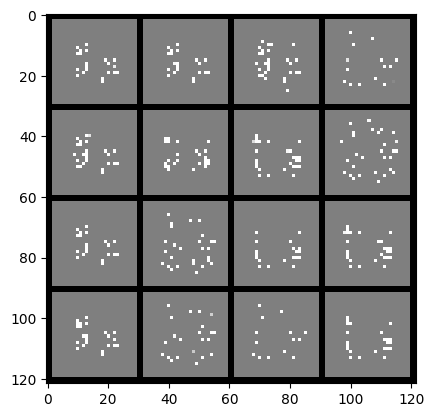

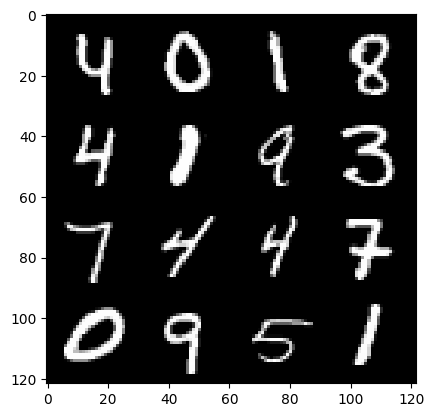

192: step 90300 / Gen loss: 0.0 / disc_loss: 82415778.22


  0%|          | 0/469 [00:00<?, ?it/s]

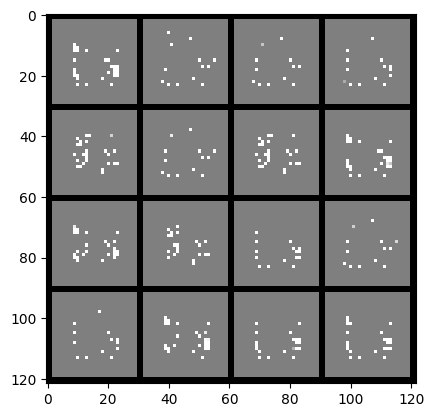

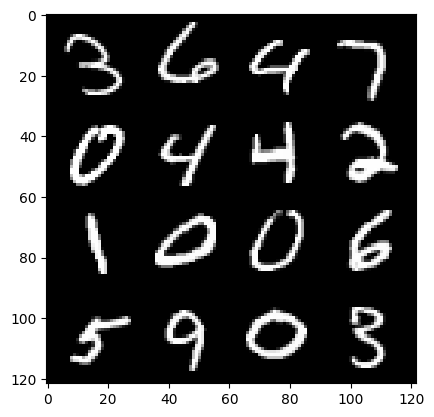

193: step 90600 / Gen loss: 25909063.140576176 / disc_loss: 12085244.982307939


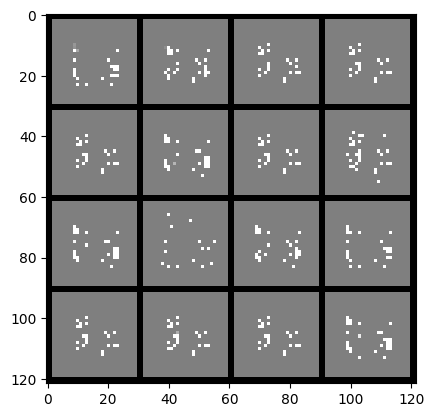

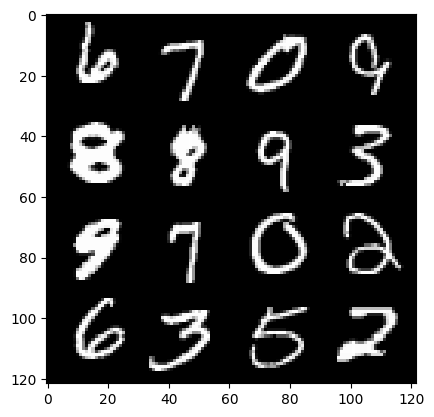

193: step 90900 / Gen loss: 10618569.57744792 / disc_loss: 58701042.95480307


  0%|          | 0/469 [00:00<?, ?it/s]

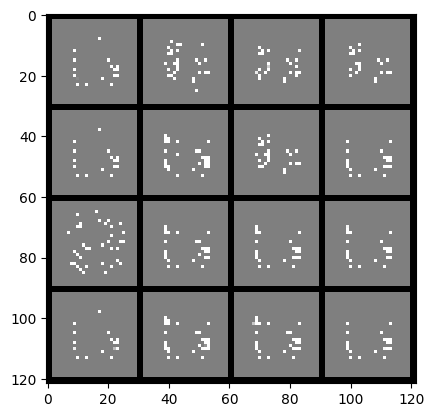

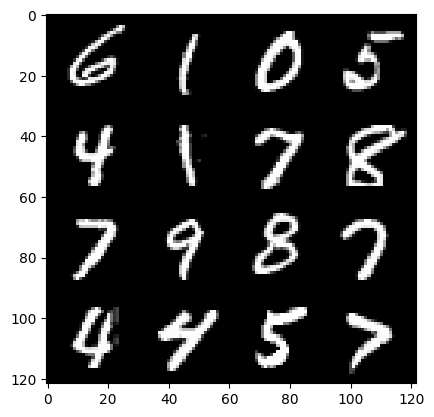

194: step 91200 / Gen loss: 43764803.168290995 / disc_loss: 28050699.77523438


  0%|          | 0/469 [00:00<?, ?it/s]

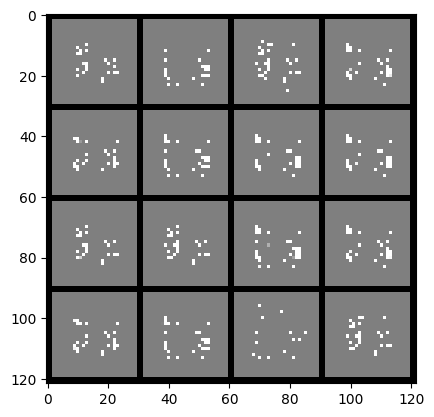

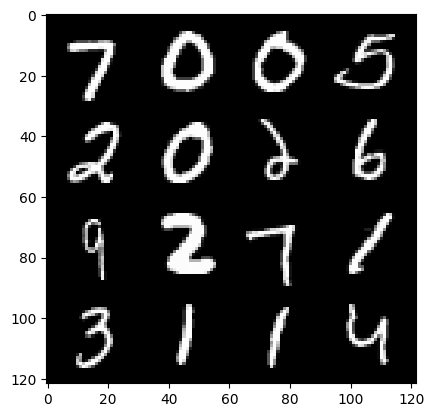

195: step 91500 / Gen loss: 4399454.103619792 / disc_loss: 88662591.70103998


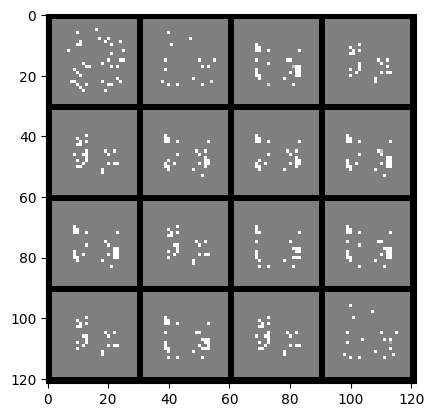

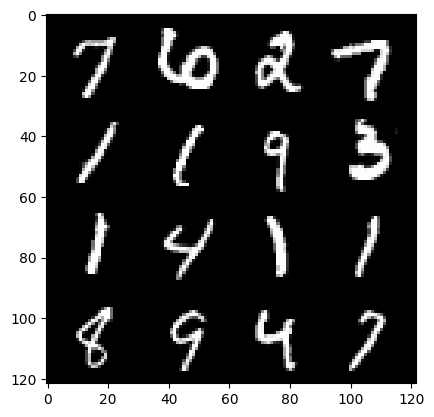

195: step 91800 / Gen loss: 33730155.79083336 / disc_loss: 47151199.75935708


  0%|          | 0/469 [00:00<?, ?it/s]

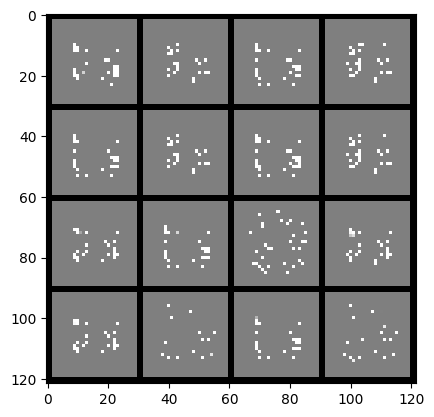

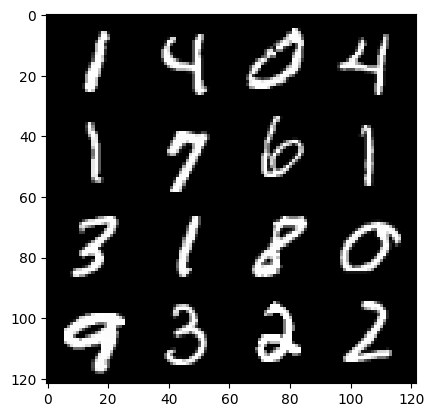

196: step 92100 / Gen loss: 51052621.974490955 / disc_loss: 40709582.19891114


  0%|          | 0/469 [00:00<?, ?it/s]

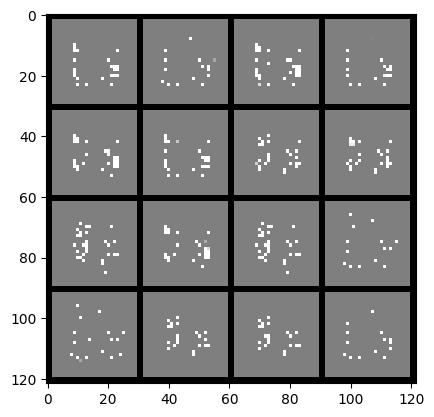

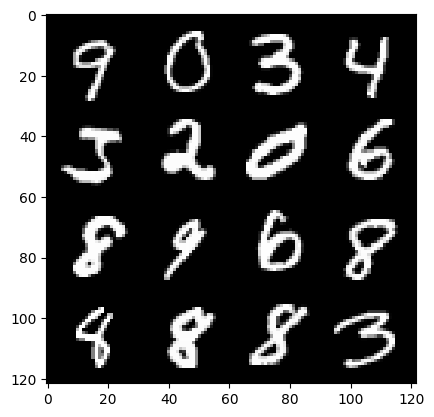

197: step 92400 / Gen loss: 9388814.031567384 / disc_loss: 79502598.99645989


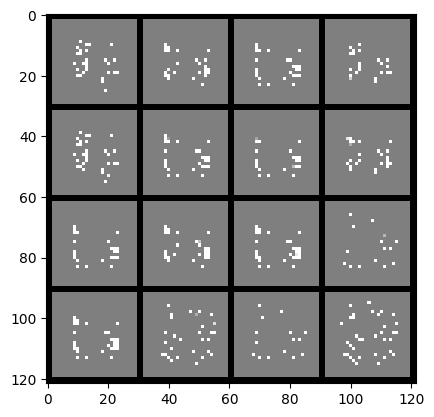

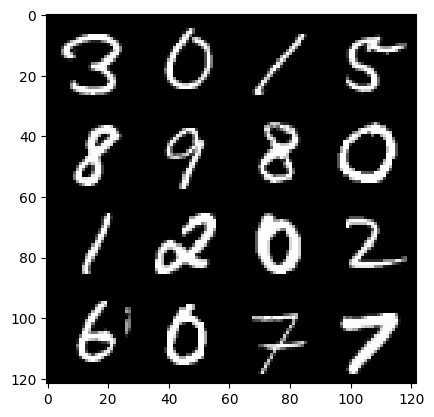

197: step 92700 / Gen loss: 43623039.40531252 / disc_loss: 25879670.183248688


  0%|          | 0/469 [00:00<?, ?it/s]

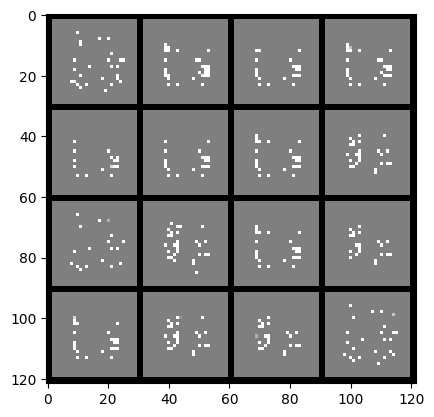

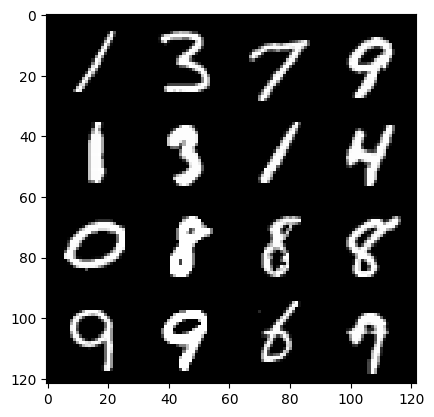

198: step 93000 / Gen loss: 4482369.874791668 / disc_loss: 101295026.92981285


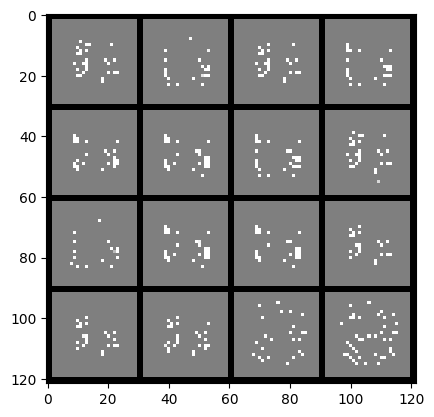

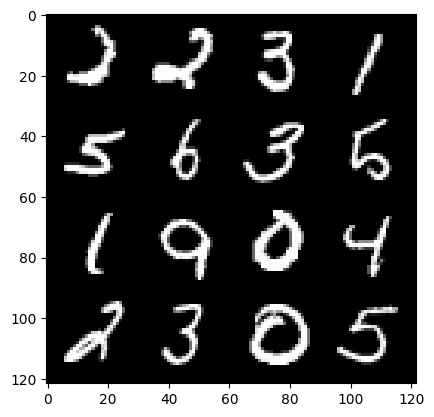

198: step 93300 / Gen loss: 59116375.041015595 / disc_loss: 44379619.2257438


  0%|          | 0/469 [00:00<?, ?it/s]

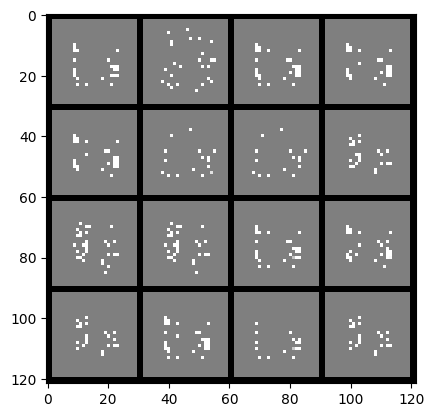

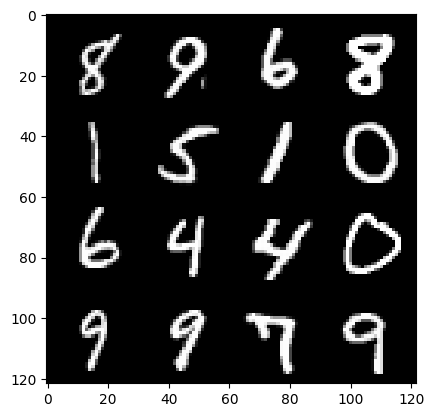

199: step 93600 / Gen loss: 8224640.603958334 / disc_loss: 108598785.24312502


In [15]:
### batch size = 128
### 60000 / 128 = 468.75  = 469 steps in each epoch
### Each step is going to process 128 images = size of the batch (except the last step)

for epoch in range(epochs):
  for real, _ in tqdm(dataloader):
    ### discriminator
    disc.train() # set the gradients to zero


    current_batch_size=len(real) # real: 128 x 1 x 28 x 28
    real = real.view(current_batch_size, -1) # 128 x 784
    real = real.to(device)

    disc_loss = calc_disc_loss(loss_func,gen,disc,current_batch_size,real,z_dim)
    disc_loss.backward(), # Backpropagation
    disc_opt.step(), # Optimizer step

    ### generator
    gen.train(), # set the gradients to zero
    gen_loss = calc_gen_loss(loss_func,gen,disc,current_batch_size,z_dim)
    gen_loss.backward(), # Backpropagation
    gen_opt.step(), # Optimizer step

    ### statistics + visualization

    # adding the values into the losses
    mean_disc_loss+=disc_loss.item()/info_step # .item() transforms the tensor value into a standalone value
    mean_gen_loss+=gen_loss.item()/info_step

    if cur_step % info_step == 0 and cur_step>0:
      fake_noise = gen_noise(current_batch_size, z_dim)
      fake = gen(fake_noise)
      show(fake)
      show(real)
      print(f"{epoch}: step {cur_step} / Gen loss: {mean_gen_loss} / disc_loss: {mean_disc_loss}")
      mean_gen_loss, mean_disc_loss=0,0
    cur_step+=1


**In the quantitative assessment of GANs, especially for complex image datasets, which metrics are suitable for evaluating the quality and diversity of the generated images?**

*FID - Frechet Inception Distance*
* A metric attempting to quantitatively evaluate the quality of
generated images.Use features learned for classification, and see how similar they are for real and generated images. The distance is measured using the Fréchet distance, also known as the Wasserstein-2 distance.

*IS - Inception Score*

* The IS uses an Inception network to compute the logit of generated images. It measures the diversity and quality of generated images by comparing them to real images. The IS is calculated by predicting the probabilities of the generated samples. A sample is classified strongly as one specific class means that it has high quality. In other words, it is assumed that low entropy and high quality data are correlated. The IS value varies between 1 and the number of classes of the classifier.

*MS-SSIM - Multi-scale structural similarity for image quality*

* is based on the comparison between two image structures, luminance and contrast at different scales. The MS-SSIM provides a metric that compares the similarity between the real and the synthesized dataset. MS-SSIM is calculated using the average pairwise of SSIM with N batches. MS-SSIM evaluates images at multiple scales (resolutions), allowing better consideration of local changes and details that may be invisible at one scale level. This makes MS-SSIM more sensitive to different types of distortion, especially when the image changes at different levels of detail.